In [1]:
import numpy as np
import matplotlib.pyplot as plt
import glob
%matplotlib inline 

from skimage import io, color, filters, feature, restoration
from skimage.transform import resize, rotate
from skimage.color import rgb2gray
from scipy.spatial.distance import squareform
from scipy.misc import imread
from transparent_imshow import transp_imshow
import matplotlib.cm as cm
from scipy import ndimage, misc




In [2]:
# unruled = glob.glob('../Sketches/Unruled/*')
ruled = glob.glob('../Sketches/Ruled/*')

'../Sketches/Ruled/IMG_0014.jpg'

In [3]:
ruled0 = imread(ruled[0], mode = 'L')

/Users/reiffd/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


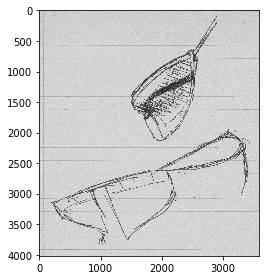

In [4]:
io.imshow(ruled0)

In [5]:
mean = np.mean(ruled0)
std = np.std(ruled0)
maxi = np.max(ruled0)
mini = np.min(ruled0)

In [6]:
standardized_ruled0 = (ruled0 - mini)/(maxi - mini)

In [7]:
standardized_ruled0

array([[0.796, 0.796, 0.812, ..., 0.8  , 0.8  , 0.792],
       [0.816, 0.8  , 0.812, ..., 0.82 , 0.824, 0.824],
       [0.88 , 0.848, 0.836, ..., 0.828, 0.824, 0.82 ],
       ...,
       [0.844, 0.86 , 0.872, ..., 0.84 , 0.848, 0.86 ],
       [0.832, 0.848, 0.856, ..., 0.836, 0.848, 0.86 ],
       [0.84 , 0.836, 0.832, ..., 0.804, 0.816, 0.812]])

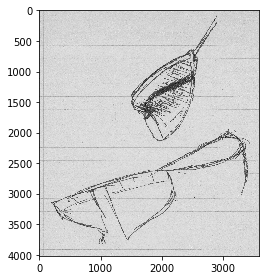

In [8]:
io.imshow(standardized_ruled0)

In [9]:
threshold = 0.75
binarized = 1.0 * (standardized_ruled0 > threshold)


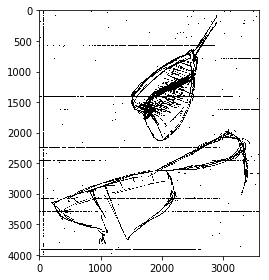

In [10]:
io.imshow(binarized)

In [11]:
result = np.ones((4017,3600))

In [12]:
result[:binarized.shape[0], :binarized.shape[1]] = binarized

In [13]:
result.shape

(4017, 3600)

In [14]:
mask = np.zeros((result.shape[0] * result.shape[1]))

In [15]:
mask.shape

(14461200,)

In [16]:
mask[1] = 1

In [17]:
mask.reshape((result.shape[0], result.shape[1]))

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [18]:
zoom = result[1500:2500, 1500:2500]

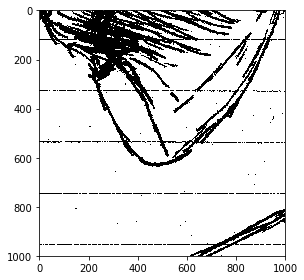

In [19]:
io.imshow(zoom, cmap='gray')

0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6
0.0
-1.6
1.6


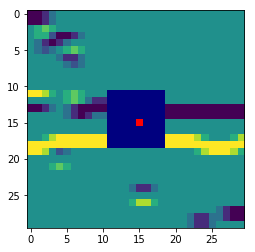

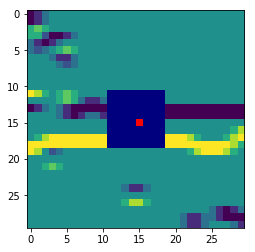

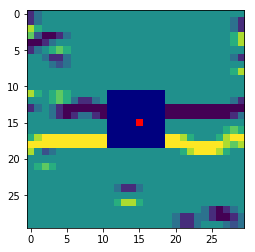

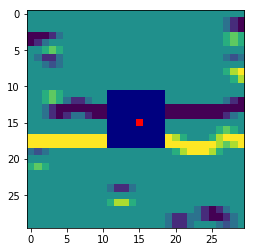

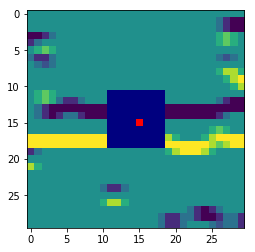

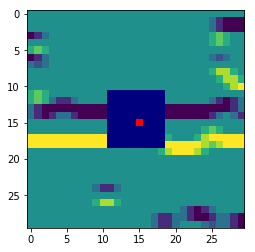

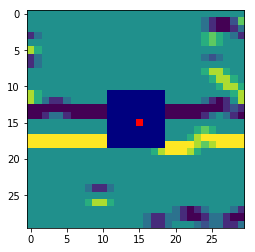

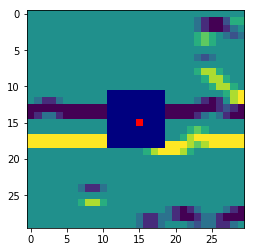

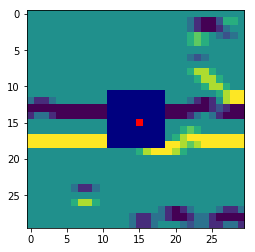

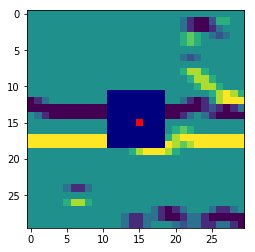

In [20]:

for i in range(10):
    size = 30
    row_index = 103
    col_index = 110 + i
    window = zoom[row_index:row_index+size, col_index:col_index+size]
    window_sobel = ndimage.sobel(window, axis=0)
    window_sobel


    masked_pixel = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel[15,15] = 1
    masked_pixel = np.ma.masked_where(masked_pixel != 1, masked_pixel)

    masked_pixel1 = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel1[11:19, 11:19] = 1
    masked_pixel1 = np.ma.masked_where(masked_pixel1 != 1, masked_pixel1)


    fig, ax = plt.subplots(1, 1)

    ax.imshow(window_sobel)
    ax.imshow(masked_pixel1, cmap='jet')
    ax.imshow(masked_pixel, cmap='prism')

    print(np.mean(window_sobel[10:20, 11:19]))
    print(np.mean(window_sobel[10:15, 11:19]))
    print(np.mean(window_sobel[15:20, 11:19]))




In [ ]:
!pip install opencv-python

In [106]:
import cv2
img = cv2.imread(ruled[0], cv2.IMREAD_COLOR)[1500:2500, 1500:2500]
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 50, 200)
minLineLength = 100
maxLineGap = 10
lines = cv2.HoughLinesP(edges,1,np.pi/180,100,minLineLength,maxLineGap)
for x1,y1,x2,y2 in lines[0]:
    cv2.line(img,(x1,y1),(x2,y2),(0,255,0),2)
cv2.imwrite('houghlines5.jpg',img)

True

Diagonal 1. Above: -0.2, Below: 0.6, Difference: 0.39999999999999997
Diagonal 2. Above: 0.4, Below: 1.0, Difference: 1.4


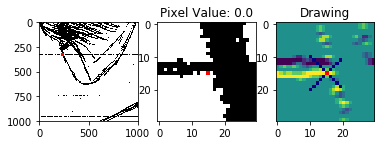

Diagonal 1. Above: -0.4, Below: 0.0, Difference: -0.4
Diagonal 2. Above: 0.2, Below: 1.2, Difference: 1.4


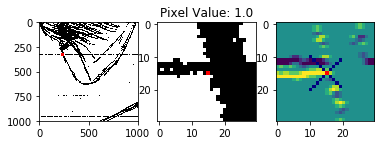

Diagonal 1. Above: -0.6, Below: 0.0, Difference: -0.6
Diagonal 2. Above: 0.0, Below: 0.8, Difference: 0.8


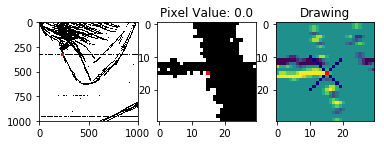

Diagonal 1. Above: -1.2, Below: 0.0, Difference: -1.2
Diagonal 2. Above: 0.0, Below: 0.0, Difference: 0.0


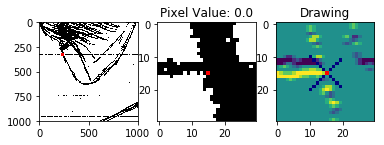

Diagonal 1. Above: -1.2, Below: 0.0, Difference: -1.2
Diagonal 2. Above: 0.0, Below: -0.4, Difference: -0.4


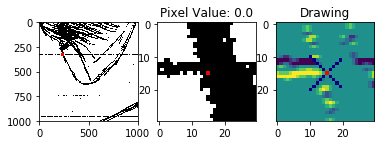

Diagonal 1. Above: -0.4, Below: 0.0, Difference: -0.4
Diagonal 2. Above: 0.0, Below: -0.2, Difference: -0.2


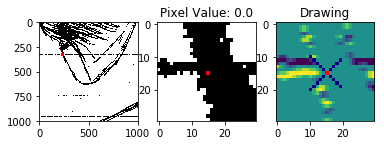

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -0.2, Below: 0.2, Difference: 0.0


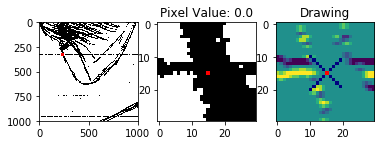

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -0.4, Below: 0.6, Difference: 0.19999999999999996


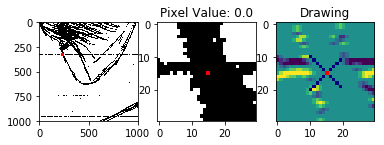

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -0.4, Below: 0.6, Difference: 0.19999999999999996


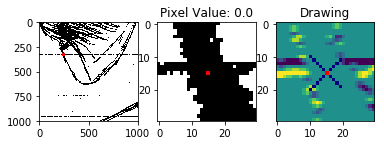

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -0.8, Below: 0.2, Difference: -0.6000000000000001


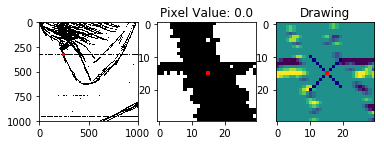

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -1.4, Below: 0.0, Difference: -1.4


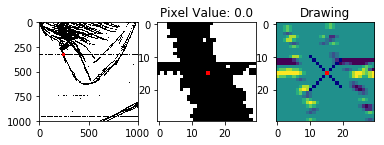

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -1.6, Below: 0.0, Difference: -1.6


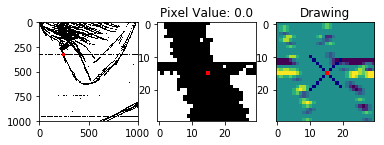

Diagonal 1. Above: 0.0, Below: 0.0, Difference: 0.0
Diagonal 2. Above: -1.4, Below: 0.0, Difference: -1.4


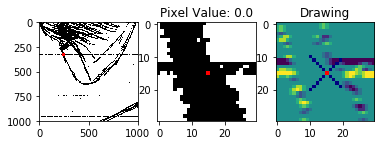

Diagonal 1. Above: 0.0, Below: -0.4, Difference: -0.4
Diagonal 2. Above: -1.2, Below: 0.0, Difference: -1.2


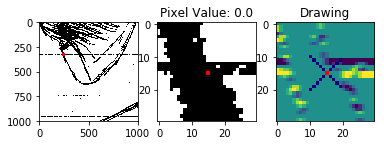

Diagonal 1. Above: 0.0, Below: -1.4, Difference: -1.4
Diagonal 2. Above: -1.6, Below: 0.0, Difference: -1.6


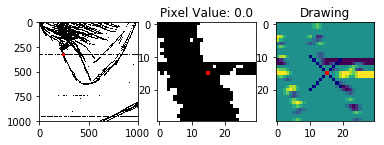

Diagonal 1. Above: -0.2, Below: -2.0, Difference: -2.2
Diagonal 2. Above: -2.0, Below: 0.0, Difference: -2.0


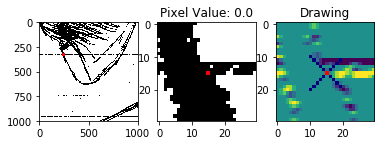

Diagonal 1. Above: -1.0, Below: -1.2, Difference: -2.2
Diagonal 2. Above: -1.8, Below: 0.0, Difference: -1.8


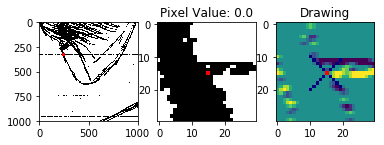

Diagonal 1. Above: -1.6, Below: 0.2, Difference: -1.4000000000000001
Diagonal 2. Above: -1.6, Below: 0.2, Difference: -1.4000000000000001


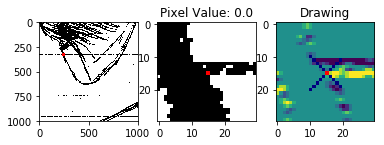

Diagonal 1. Above: -1.0, Below: 0.8, Difference: -0.19999999999999996
Diagonal 2. Above: -1.6, Below: 0.8, Difference: -0.8


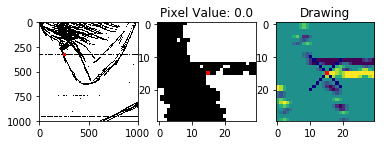

Diagonal 1. Above: -0.4, Below: 0.6, Difference: 0.19999999999999996
Diagonal 2. Above: -1.0, Below: 1.4, Difference: 0.3999999999999999


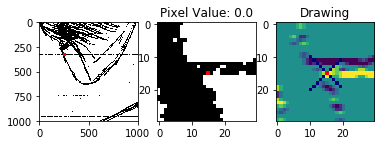

In [64]:
for i in range(220, 240):
    size = 30
    row_index = 314
    col_index = i
    masked_window = np.random.random((zoom.shape[0],zoom.shape[1]))
    masked_window[row_index:row_index+size, col_index:col_index+size] = 1
    masked_window = np.ma.masked_where(masked_window != 1, masked_window)

    masked_pixel = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel[15,15] = 1
    masked_pixel = np.ma.masked_where(masked_pixel != 1, masked_pixel)

    masked_pixel1 = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))

    for i in range(10, 20):
        masked_pixel1[i, i] = 1
        masked_pixel1[30-i, i] = 1
    #     masked_pixel1[13, 13] = 1
    #     masked_pixel1[12, 12] = 1

    masked_pixel1 = np.ma.masked_where(masked_pixel1 != 1, masked_pixel1)

    window = zoom[row_index:row_index+size, col_index:col_index+size]
    pixel_value = window[15, 15]
    window_sobel = ndimage.sobel(window, axis=0)
    above_area = np.mean(window_sobel[9:15, 15])
    below_area = np.mean(window_sobel[15:21, 15])

    above_diagonal_area1 = []
    below_diagonal_area1 = []
    above_diagonal_area2 = []
    below_diagonal_area2 = []
    for i in range(16, 21):
        below_diagonal_area1.append(window_sobel[i, i])
        above_diagonal_area2.append(window_sobel[30-i, i])

    for i in range(11, 16):
        above_diagonal_area1.append(window_sobel[i, i])
        below_diagonal_area2.append(window_sobel[30-i, i])


    above_diagonal1_mean = np.mean(above_diagonal_area1)  
    below_diagonal1_mean = np.mean(below_diagonal_area1)
    diff_diagonal1 = above_diagonal1_mean - -below_diagonal1_mean
    above_diagonal2_mean = np.mean(above_diagonal_area2)
    below_diagonal2_mean = np.mean(below_diagonal_area2)
    diff_diagonal2 = above_diagonal2_mean - -below_diagonal2_mean

    print('Diagonal 1. Above: {}, Below: {}, Difference: {}'.format(above_diagonal1_mean, below_diagonal1_mean, diff_diagonal1))
    print('Diagonal 2. Above: {}, Below: {}, Difference: {}'.format(above_diagonal2_mean, below_diagonal2_mean, diff_diagonal2))

    sobel_value = window_sobel[15, 15]
    # Overlay the two images
    fig, ax = plt.subplots(1, 3)
    ax.ravel()
    ax[0].imshow(zoom, cmap='gray')
    ax[0].imshow(masked_window, cmap='prism', interpolation='none')
    # ax[0].imshow(masked_pixel, cmap=cm.jet, interpolation='none')
    ax[1].imshow(window, cmap='gray')
    ax[1].imshow(masked_pixel, cmap='prism', interpolation='none')
    ax[1].set_title('Pixel Value: {}'.format(pixel_value))
    ax[2].imshow(window_sobel)
    ax[2].imshow(masked_pixel1, cmap='jet')
    ax[2].imshow(masked_pixel, cmap='prism', interpolation='none')
    if pixel_value == 0.0:
    #         print(above_area)
    #         print(below_area)
    #         print(above_area - -below_area)
            if np.abs(above_area) >= 0.8 and np.abs(below_area) >= 0.8:
                if above_area - -below_area < 0.4:
                    ax[2].set_title('Line')
            else:
                if np.abs(above_area) >= 0.1 and np.abs(below_area) >= 0.1: 
                        if np.abs(above_area - -below_area) < 0.1:
                            ax[2].set_title('Line')
                        else:
                            ax[2].set_title('Drawing')
                else:
                    ax[2].set_title('Drawing')
    plt.show()

True

-0.6666666666666666
0.6666666666666666
0.0


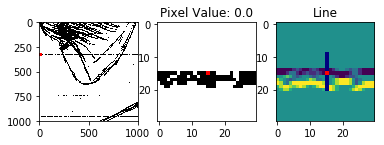

0
-0.6666666666666666
0.6666666666666666
0.0


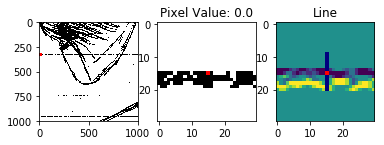

1
-0.5
0.5
0.0


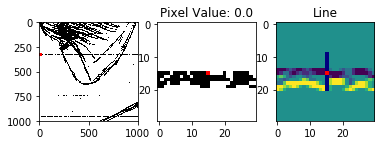

2


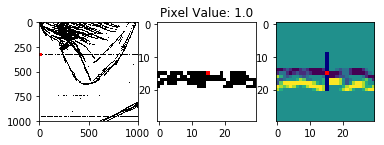

3


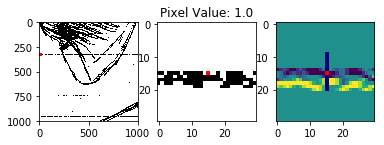

4


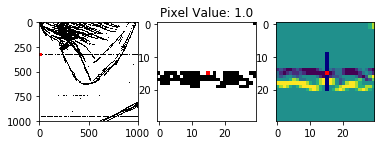

5


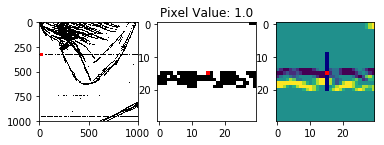

6
-0.3333333333333333
0.3333333333333333
0.0


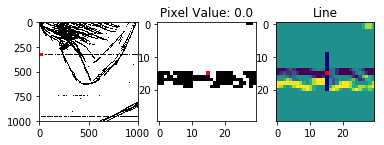

7


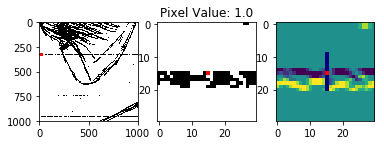

8


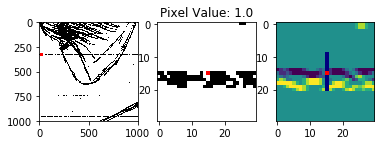

9
-0.5
0.5
0.0


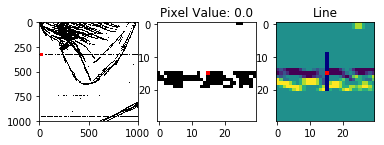

10
-0.6666666666666666
0.6666666666666666
0.0


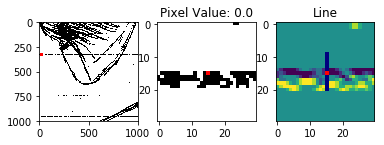

11
-0.6666666666666666
0.6666666666666666
0.0


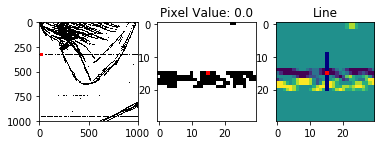

12
-0.6666666666666666
0.6666666666666666
0.0


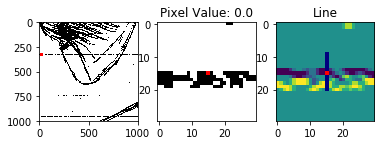

13
-0.5
0.5
0.0


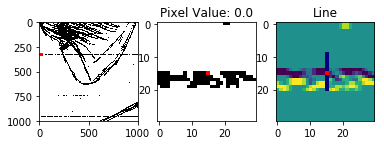

14


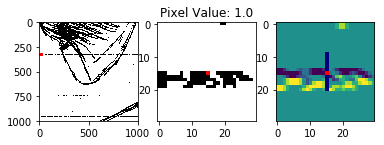

15


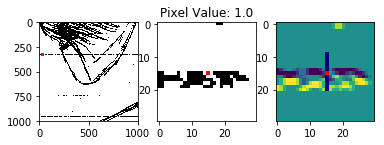

16


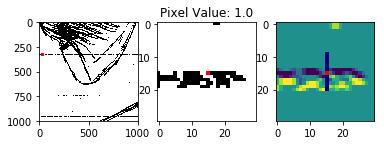

17
-0.5
0.5
0.0


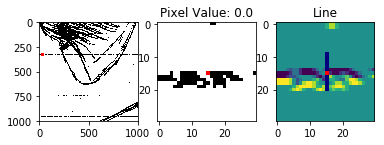

18
-0.6666666666666666
0.6666666666666666
0.0


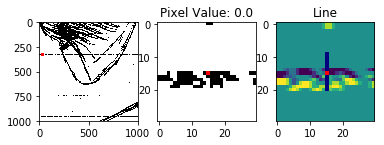

19
-0.6666666666666666
0.6666666666666666
0.0


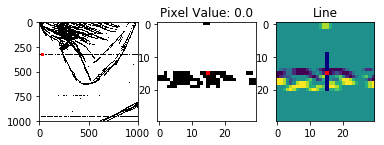

20
-0.6666666666666666
0.6666666666666666
0.0


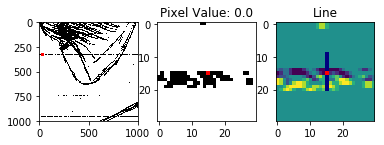

21
-0.6666666666666666
0.6666666666666666
0.0


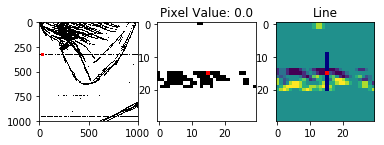

22
-0.6666666666666666
0.6666666666666666
0.0


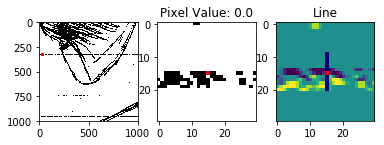

23
-0.6666666666666666
0.6666666666666666
0.0


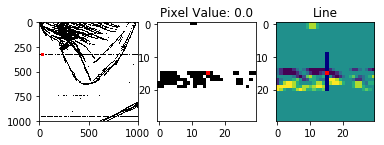

24
-0.5
0.5
0.0


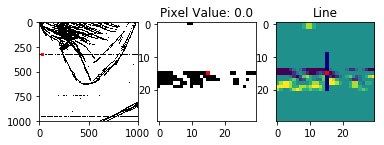

25


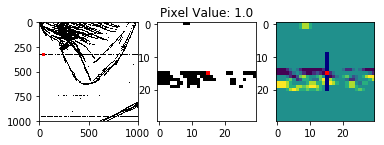

26


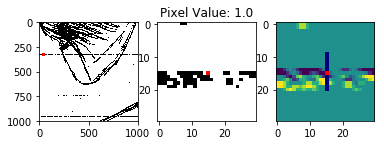

27


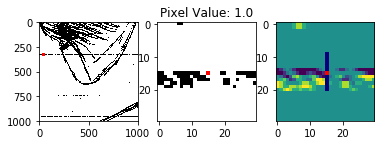

28


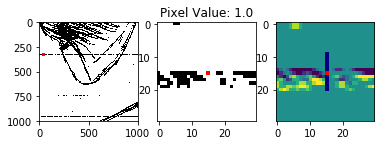

29


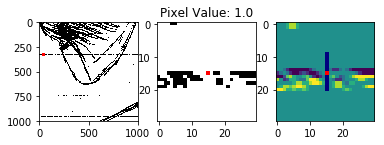

30


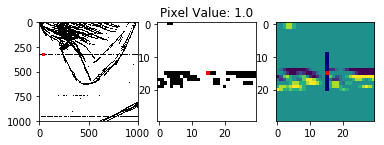

31
-0.5
0.5
0.0


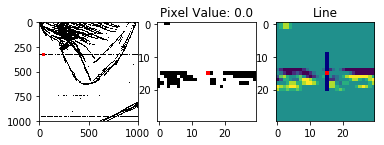

32
-0.5
0.5
0.0


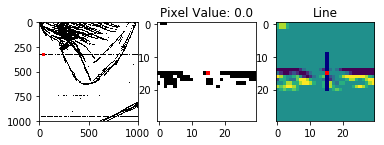

33


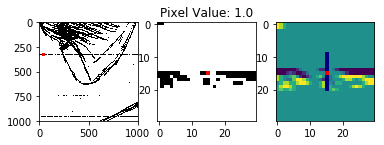

34


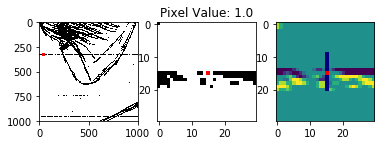

35


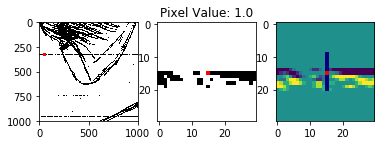

36
-0.5
0.5
0.0


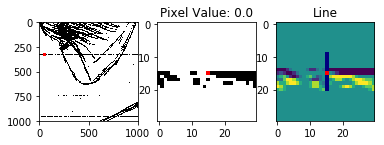

37
-0.6666666666666666
0.6666666666666666
0.0


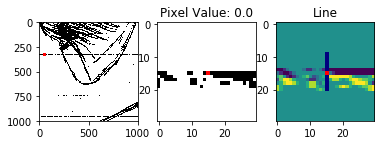

38
-0.6666666666666666
0.6666666666666666
0.0


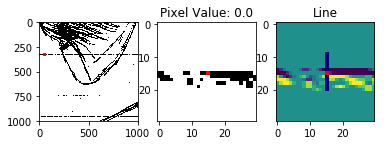

39
-0.6666666666666666
0.6666666666666666
0.0


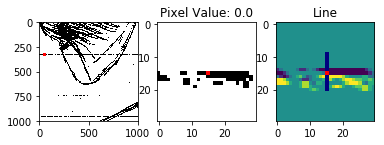

40
-0.6666666666666666
0.6666666666666666
0.0


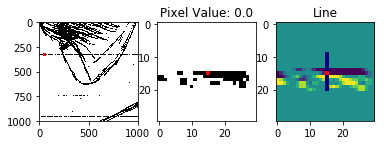

41
-0.6666666666666666
0.6666666666666666
0.0


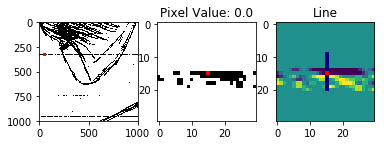

42
-0.6666666666666666
0.6666666666666666
0.0


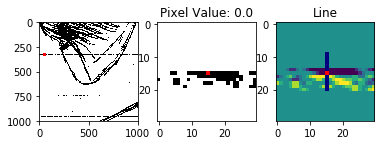

43
-0.6666666666666666
0.6666666666666666
0.0


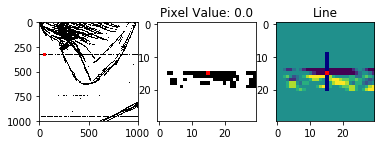

44
-0.6666666666666666
0.6666666666666666
0.0


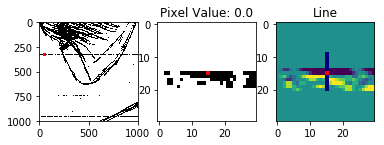

45
-0.6666666666666666
0.6666666666666666
0.0


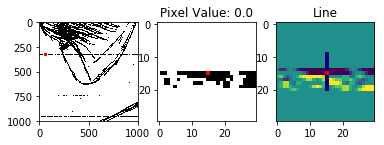

46
-0.6666666666666666
0.6666666666666666
0.0


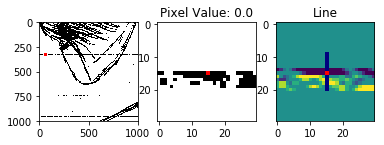

47
-0.6666666666666666
0.6666666666666666
0.0


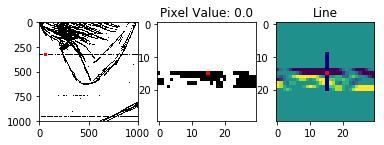

48
-0.6666666666666666
0.6666666666666666
0.0


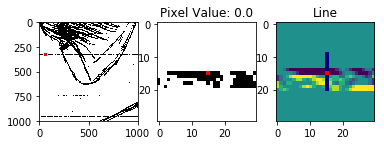

49
-0.6666666666666666
0.6666666666666666
0.0


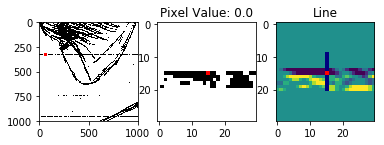

50
-0.6666666666666666
0.6666666666666666
0.0


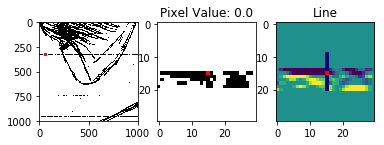

51
-0.5
0.5
0.0


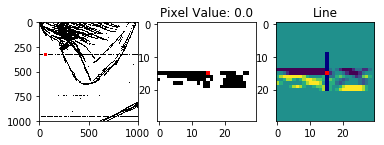

52


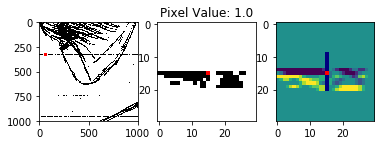

53


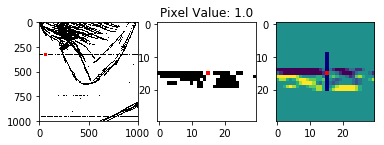

54


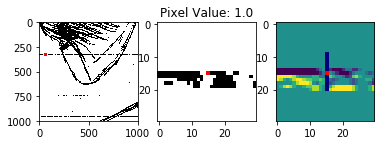

55
-0.5
0.5
0.0


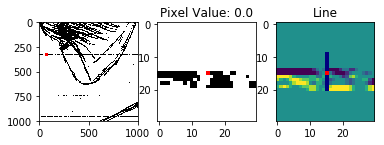

56
-0.6666666666666666
0.6666666666666666
0.0


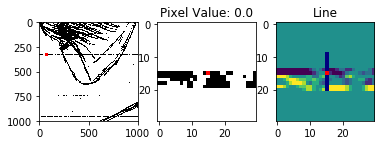

57
-0.6666666666666666
0.6666666666666666
0.0


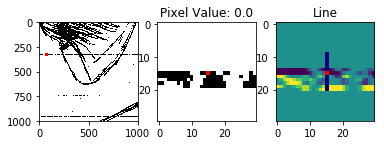

58
-0.6666666666666666
0.6666666666666666
0.0


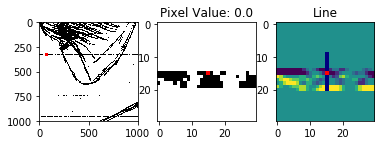

59
-0.5
0.5
0.0


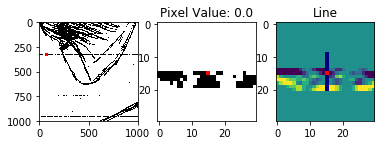

60


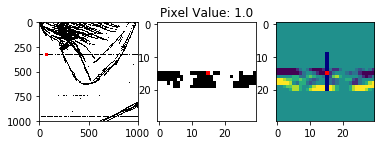

61


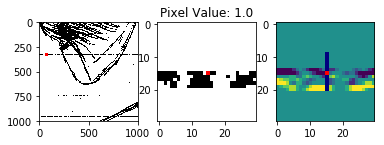

62
-0.5
0.5
0.0


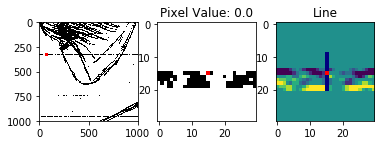

63
-0.5
0.5
0.0


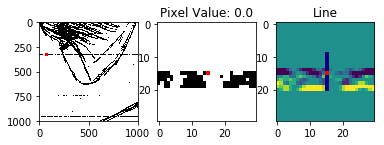

64


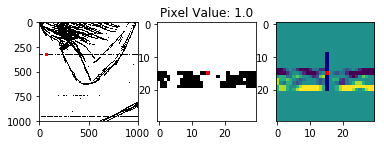

65


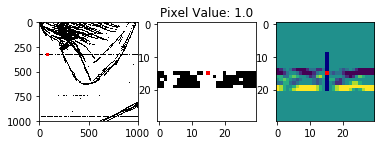

66


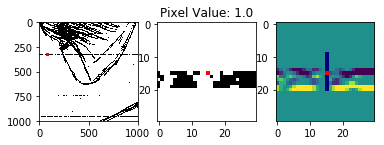

67


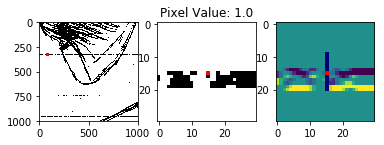

68


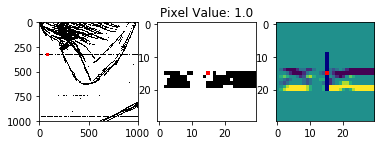

69


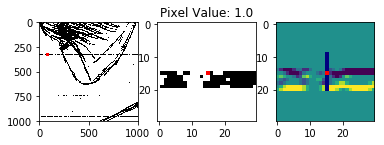

70
-0.3333333333333333
0.3333333333333333
0.0


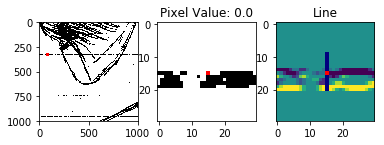

71


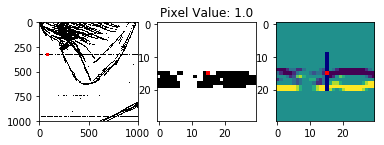

72


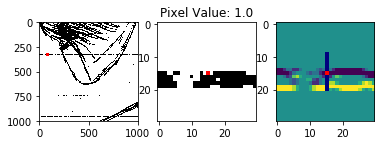

73


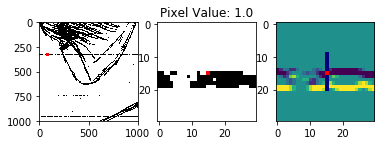

74
-0.5
0.5
0.0


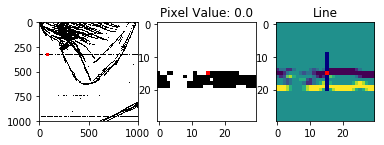

75
-0.6666666666666666
0.6666666666666666
0.0


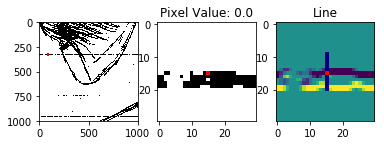

76
-0.6666666666666666
0.6666666666666666
0.0


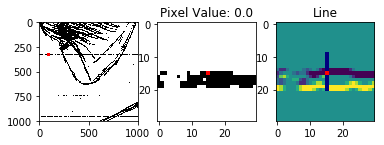

77
-0.6666666666666666
0.6666666666666666
0.0


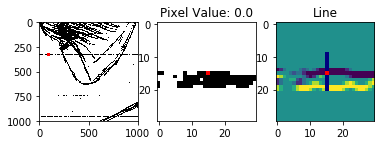

78
-0.6666666666666666
0.6666666666666666
0.0


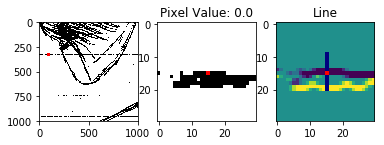

79
-0.6666666666666666
0.6666666666666666
0.0


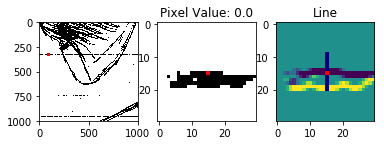

80
-0.6666666666666666
0.6666666666666666
0.0


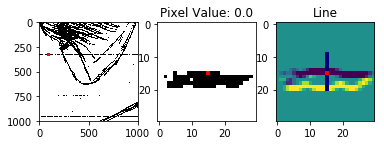

81
-0.6666666666666666
0.6666666666666666
0.0


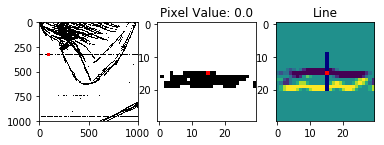

82
-0.6666666666666666
0.6666666666666666
0.0


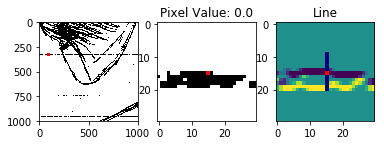

83
-0.5
0.5
0.0


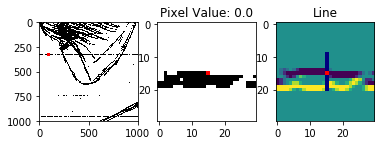

84


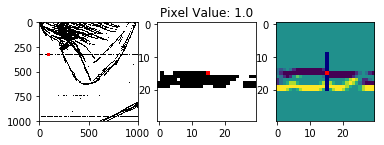

85


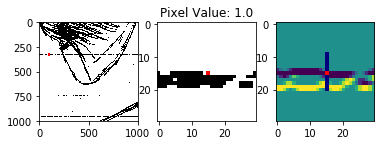

86


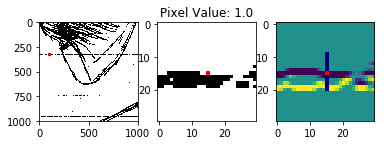

87


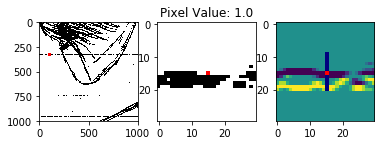

88


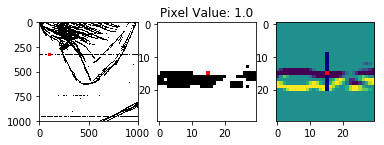

89


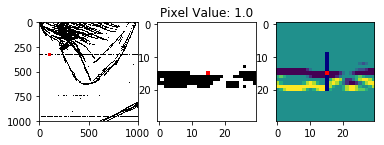

90


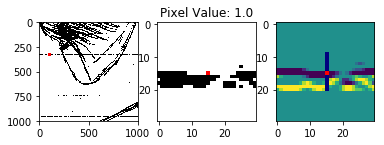

91


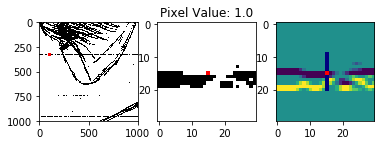

92


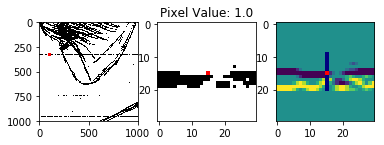

93


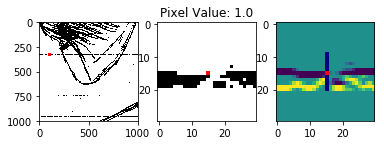

94


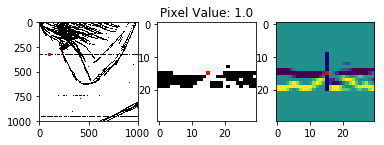

95


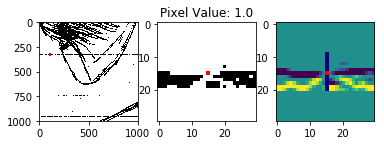

96


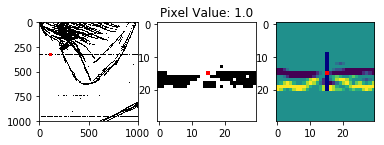

97


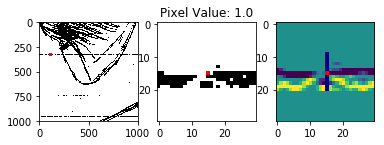

98


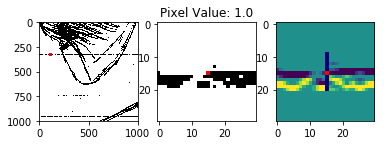

99
-0.5
0.5
0.0


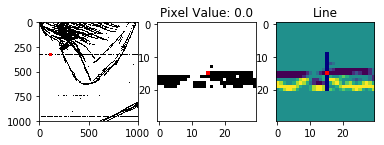

100
-0.6666666666666666
0.6666666666666666
0.0


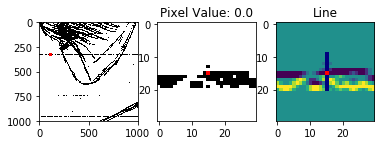

101
-0.6666666666666666
0.6666666666666666
0.0


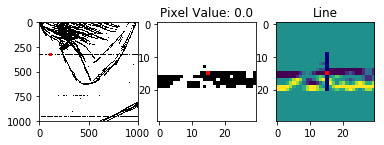

102
-0.6666666666666666
0.6666666666666666
0.0


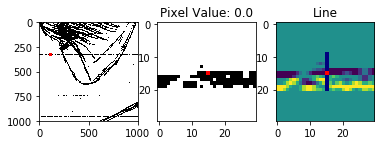

103
-0.6666666666666666
0.6666666666666666
0.0


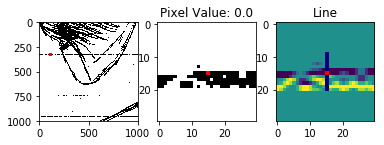

104
-0.6666666666666666
0.6666666666666666
0.0


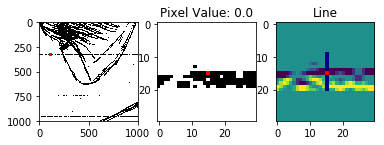

105
-0.6666666666666666
0.6666666666666666
0.0


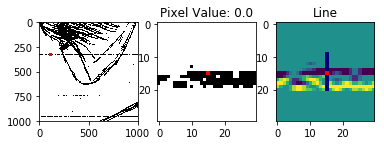

106
-0.6666666666666666
0.6666666666666666
0.0


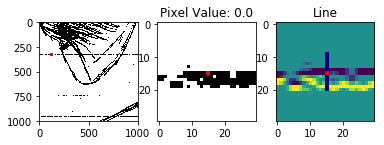

107
-0.6666666666666666
0.6666666666666666
0.0


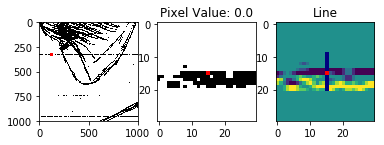

108
-0.6666666666666666
0.6666666666666666
0.0


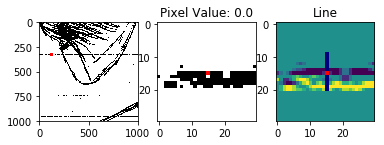

109
-0.6666666666666666
0.6666666666666666
0.0


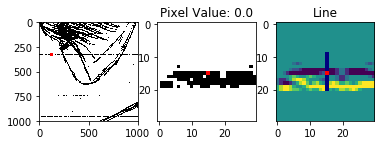

110
-0.6666666666666666
0.6666666666666666
0.0


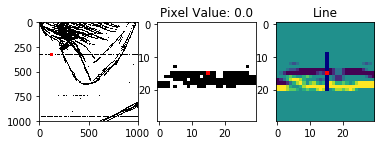

111
-0.6666666666666666
0.6666666666666666
0.0


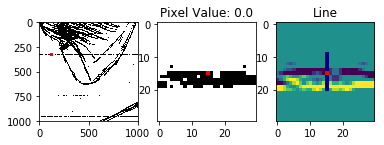

112
-0.5
0.5
0.0


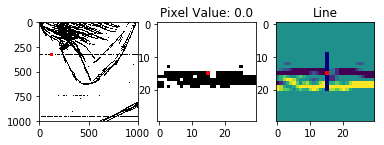

113


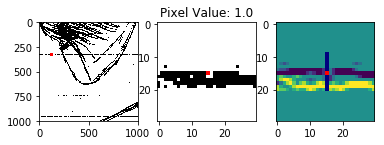

114


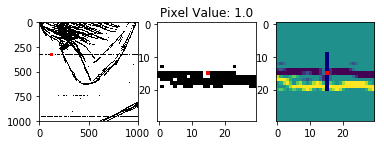

115
-0.5
0.5
0.0


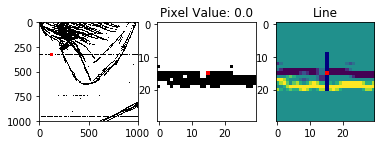

116
-0.6666666666666666
0.6666666666666666
0.0


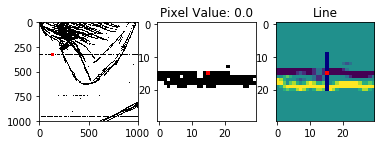

117
-0.6666666666666666
0.6666666666666666
0.0


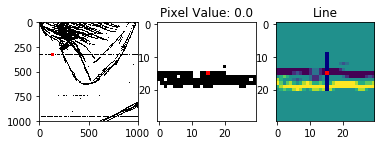

118
-0.6666666666666666
0.6666666666666666
0.0


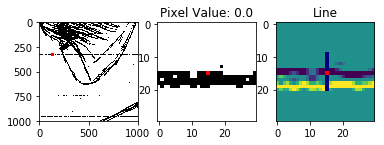

119
-0.6666666666666666
0.6666666666666666
0.0


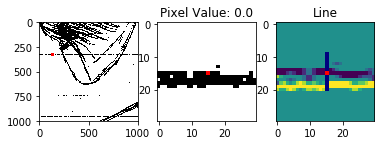

120
-0.6666666666666666
0.6666666666666666
0.0


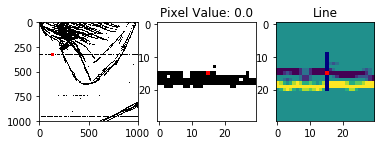

121
-0.6666666666666666
0.6666666666666666
0.0


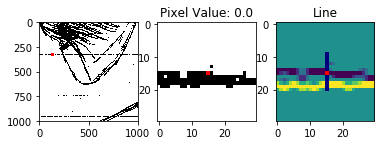

122
-0.5
0.5
0.0


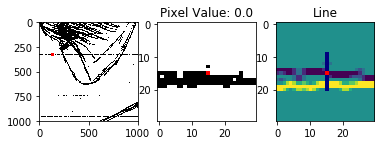

123


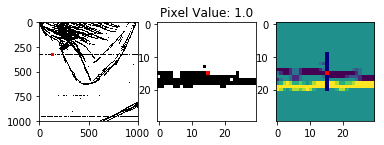

124


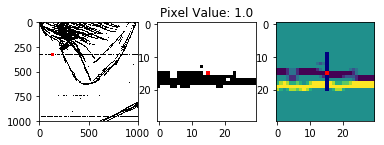

125


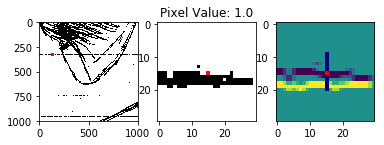

126


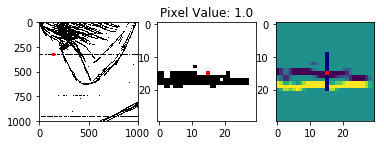

127


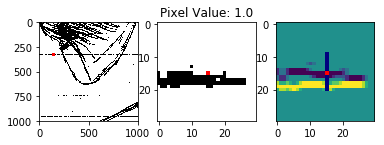

128


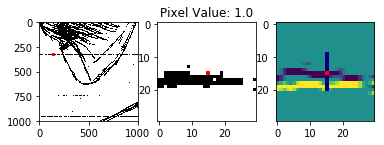

129


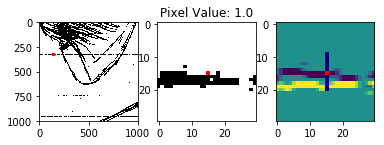

130


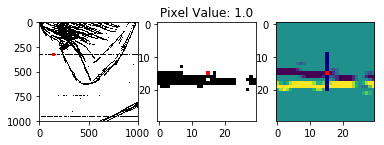

131


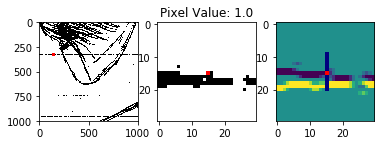

132
-0.3333333333333333
0.3333333333333333
0.0


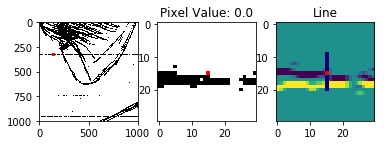

133


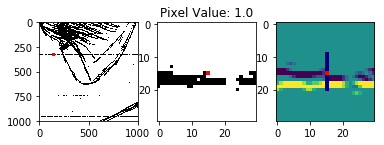

134


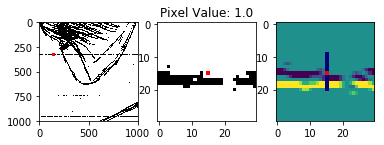

135


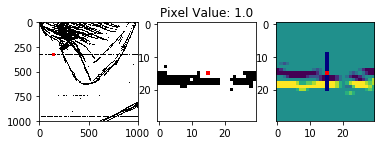

136


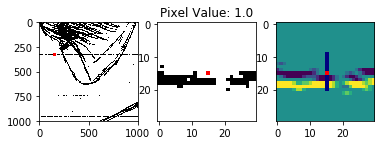

137


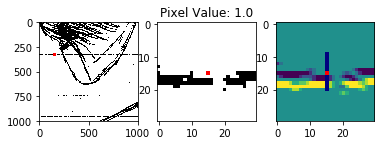

138


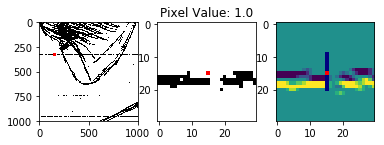

139


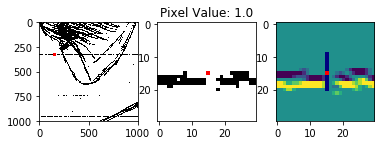

140


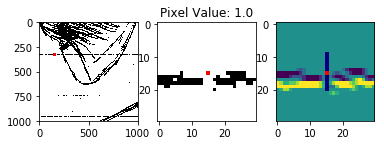

141


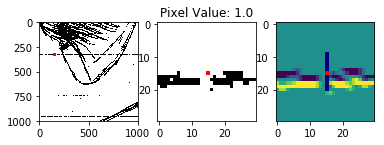

142


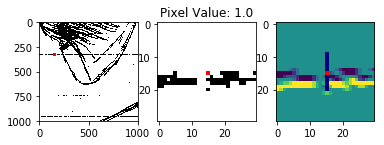

143


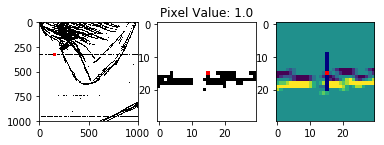

144


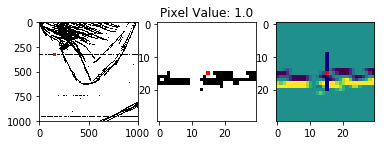

145


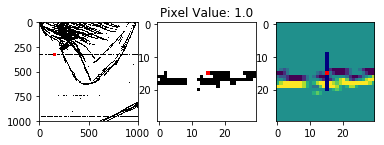

146
-0.5
0.5
0.0


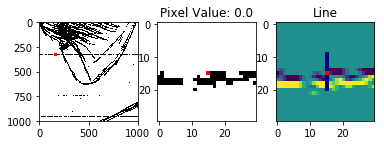

147
-0.6666666666666666
0.6666666666666666
0.0


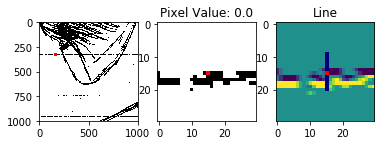

148
-0.6666666666666666
0.6666666666666666
0.0


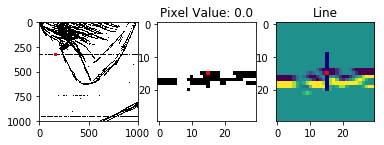

149
-0.6666666666666666
0.6666666666666666
0.0


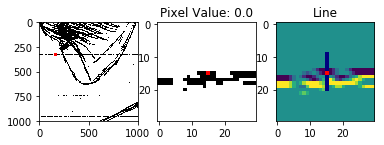

150
-0.6666666666666666
0.6666666666666666
0.0


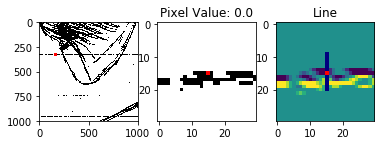

151
-0.5
0.5
0.0


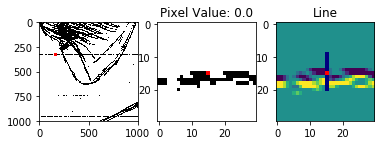

152


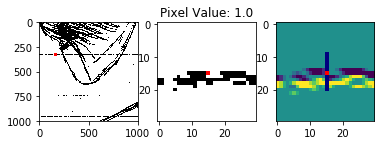

153


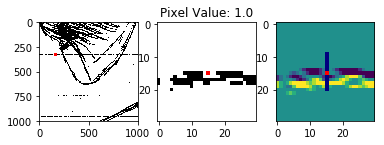

154


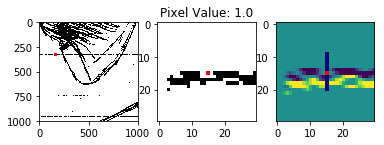

155


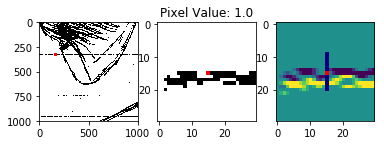

156
-0.5
0.5
0.0


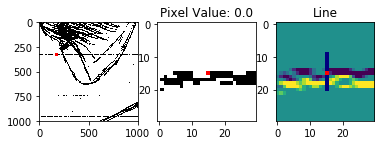

157
-0.6666666666666666
0.6666666666666666
0.0


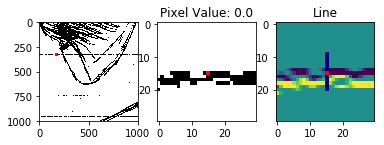

158
-0.6666666666666666
0.6666666666666666
0.0


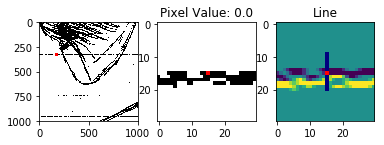

159
-0.6666666666666666
0.6666666666666666
0.0


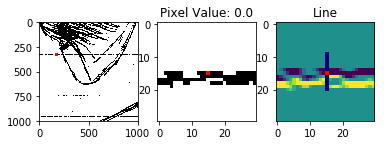

160
-0.6666666666666666
0.6666666666666666
0.0


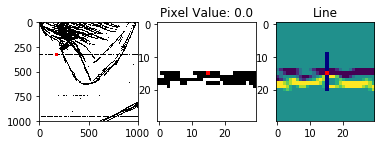

161
-0.6666666666666666
0.6666666666666666
0.0


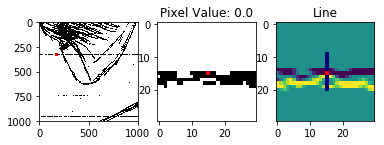

162
-0.6666666666666666
0.6666666666666666
0.0


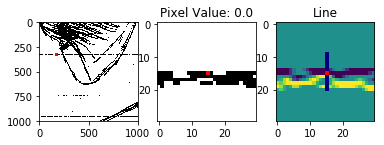

163
-0.5
0.5
0.0


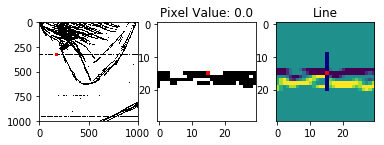

164


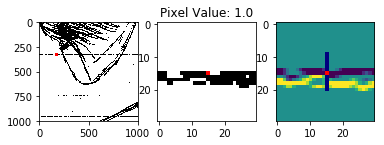

165


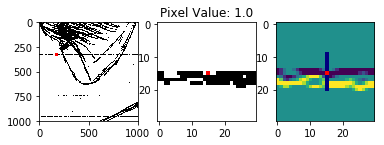

166


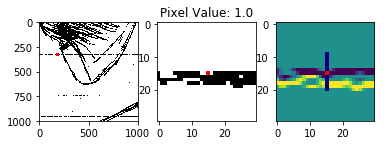

167


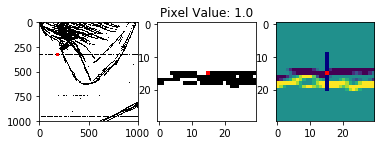

168
-0.5
0.5
0.0


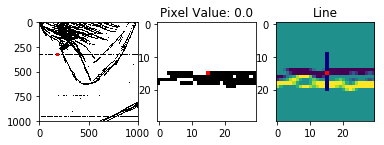

169
-0.6666666666666666
0.6666666666666666
0.0


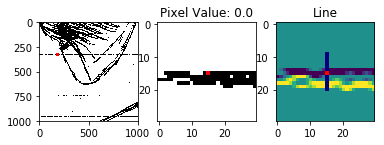

170
-0.6666666666666666
0.6666666666666666
0.0


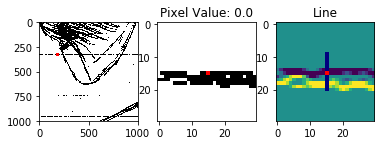

171
-0.6666666666666666
0.6666666666666666
0.0


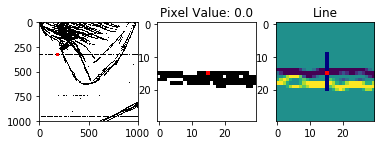

172
-0.6666666666666666
0.6666666666666666
0.0


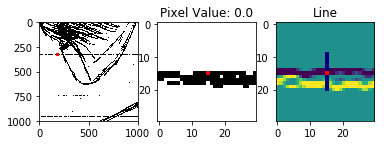

173
-0.6666666666666666
0.6666666666666666
0.0


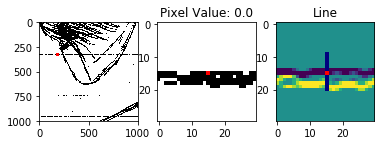

174
-0.6666666666666666
0.6666666666666666
0.0


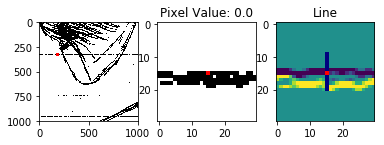

175
-0.6666666666666666
0.6666666666666666
0.0


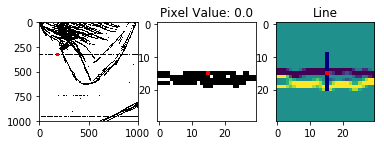

176
-0.6666666666666666
0.6666666666666666
0.0


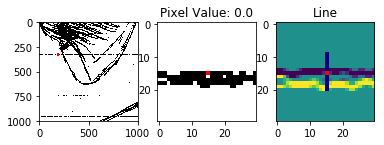

177
-0.6666666666666666
0.6666666666666666
0.0


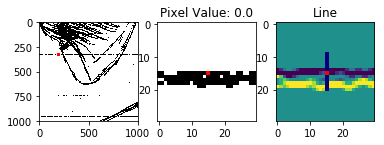

178
-0.6666666666666666
0.6666666666666666
0.0


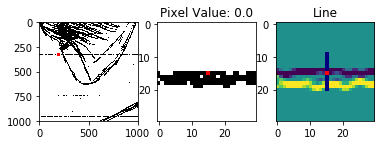

179
-0.6666666666666666
0.6666666666666666
0.0


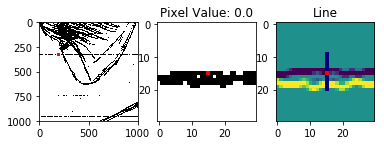

180
-0.6666666666666666
0.6666666666666666
0.0


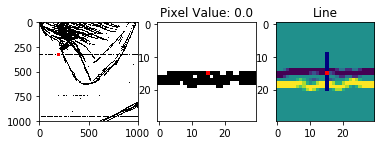

181
-0.6666666666666666
0.6666666666666666
0.0


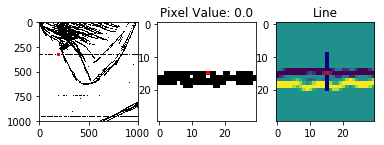

182
-0.6666666666666666
0.6666666666666666
0.0


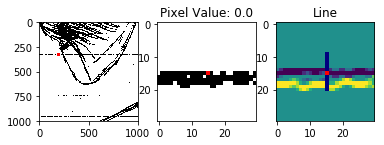

183
-0.5
0.5
0.0


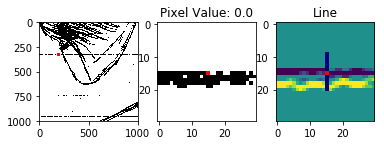

184


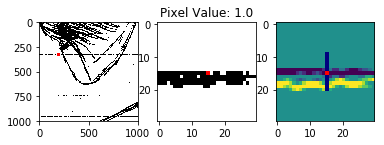

185


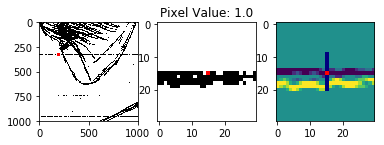

186
-0.5
0.5
0.0


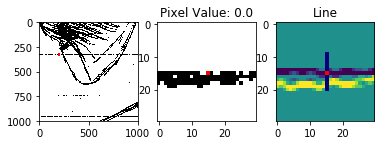

187
-0.5
0.5
0.0


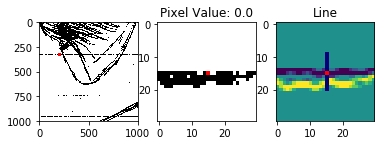

188


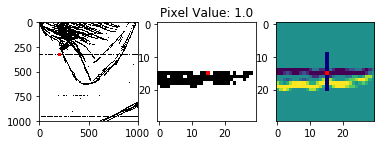

189


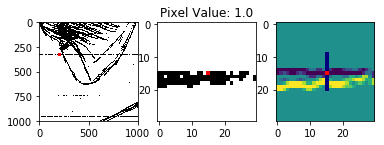

190
-0.5
0.5
0.0


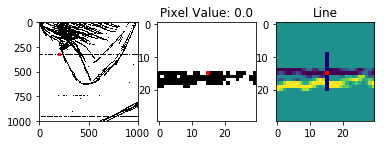

191
-0.6666666666666666
0.6666666666666666
0.0


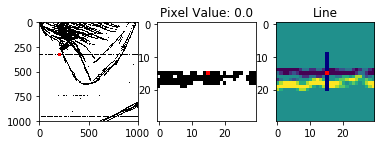

192
-0.6666666666666666
0.6666666666666666
0.0


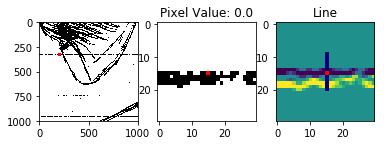

193
-0.6666666666666666
0.6666666666666666
0.0


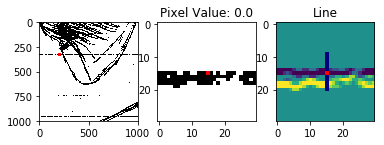

194
-0.5
0.5
0.0


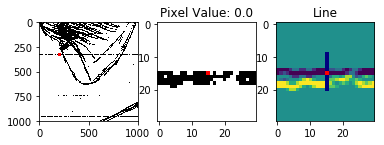

195


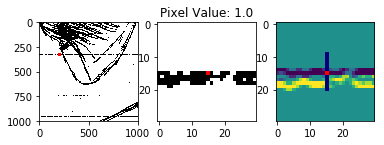

196
-0.3333333333333333
0.3333333333333333
0.0


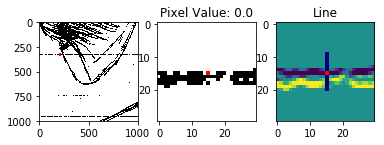

197


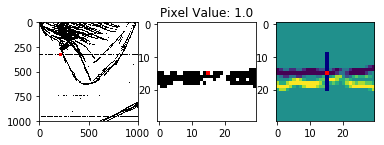

198


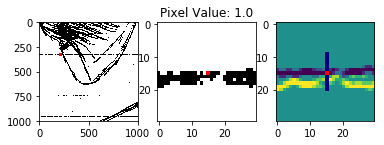

199
-0.5
0.5
0.0


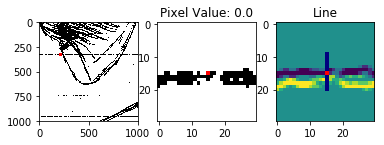

200
-0.6666666666666666
0.6666666666666666
0.0


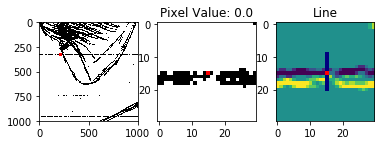

201
-0.5
0.5
0.0


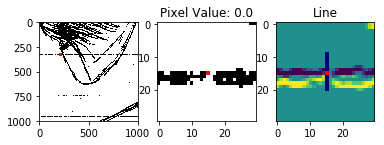

202


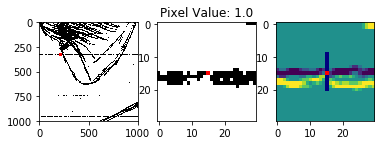

203


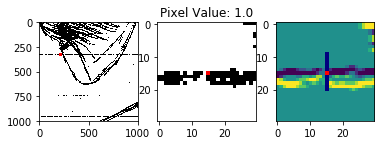

204
-0.5
0.5
0.0


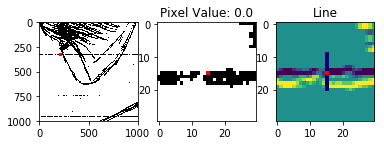

205
-0.6666666666666666
0.6666666666666666
0.0


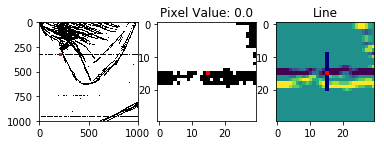

206
-0.6666666666666666
0.6666666666666666
0.0


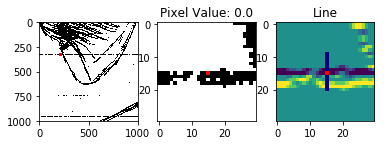

207
-0.6666666666666666
0.6666666666666666
0.0


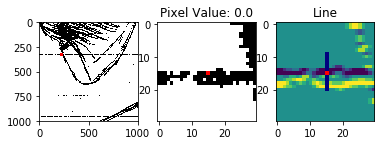

208
-0.6666666666666666
0.6666666666666666
0.0


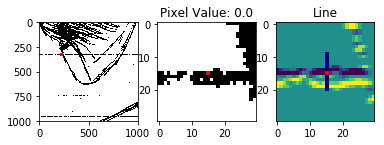

209
-0.8333333333333334
0.8333333333333334
0.0


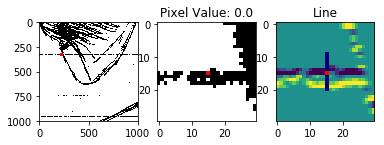

210
-1.1666666666666667
1.1666666666666667
0.0


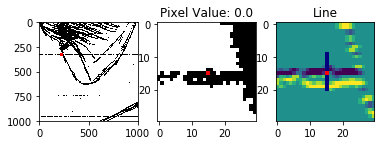

211
-1.1666666666666667
1.1666666666666667
0.0


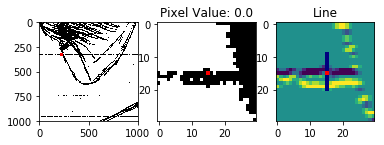

212
-0.6666666666666666
0.6666666666666666
0.0


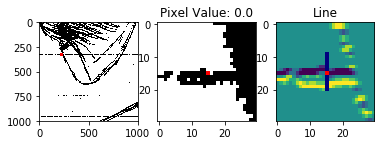

213


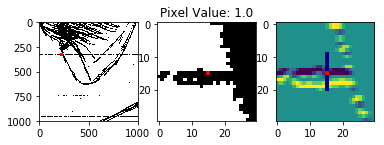

214
-0.5
0.5
0.0


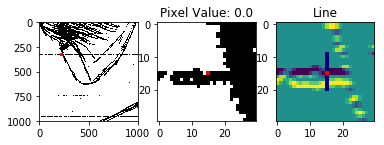

215
-0.6666666666666666
0.6666666666666666
0.0


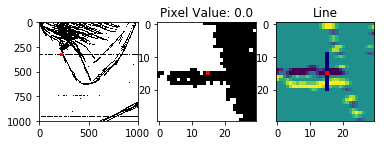

216
-0.6666666666666666
0.6666666666666666
0.0


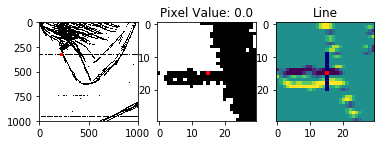

217
-0.6666666666666666
0.6666666666666666
0.0


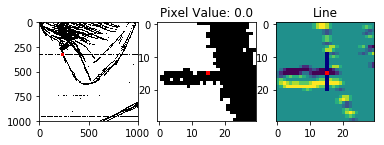

218
-0.5
0.6666666666666666
0.16666666666666663


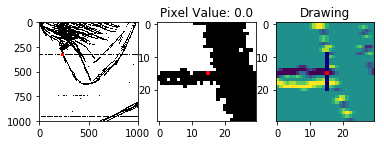

219
0.0
0.6666666666666666
0.6666666666666666


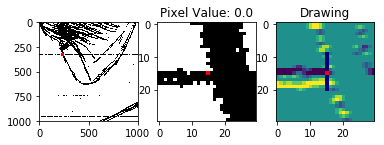

220
0.3333333333333333
0.5
0.8333333333333333


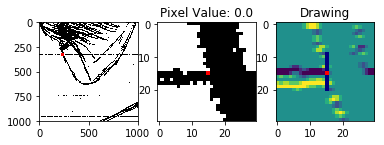

221
0.16666666666666666
0.16666666666666666
0.3333333333333333


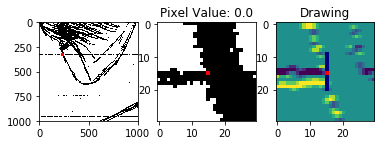

222
0.0
0.0
0.0


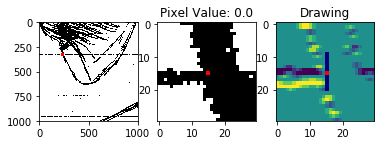

223
0.0
0.0
0.0


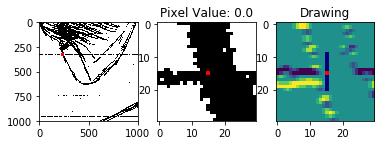

224
0.0
0.0
0.0


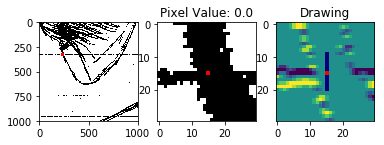

225
0.0
0.0
0.0


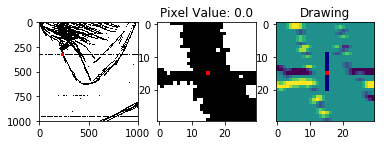

226
0.0
0.0
0.0


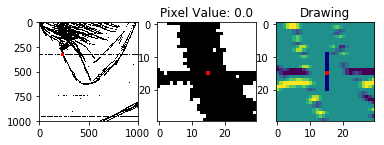

227
-0.16666666666666666
0.0
-0.16666666666666666


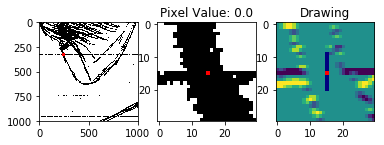

228
-0.3333333333333333
0.0
-0.3333333333333333


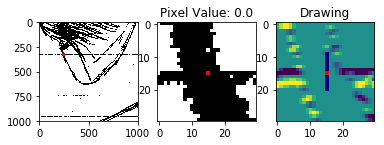

229
-0.16666666666666666
0.0
-0.16666666666666666


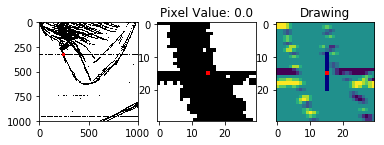

230
-0.16666666666666666
0.0
-0.16666666666666666


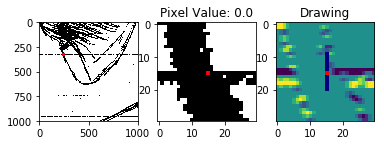

231
-0.5
-0.16666666666666666
-0.6666666666666666


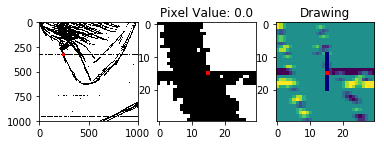

232
-0.6666666666666666
-0.5
-1.1666666666666665


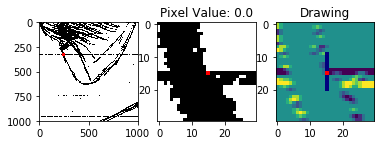

233
-0.6666666666666666
-0.6666666666666666
-1.3333333333333333


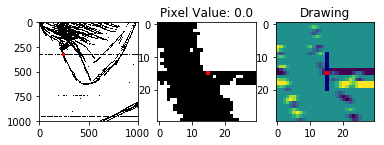

234
-0.6666666666666666
-0.6666666666666666
-1.3333333333333333


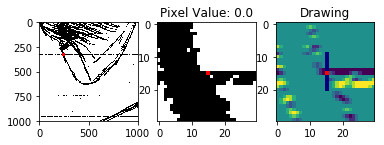

235
-0.6666666666666666
-0.6666666666666666
-1.3333333333333333


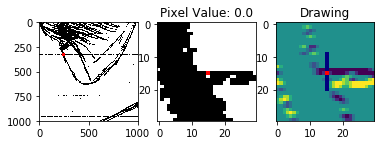

236
-0.6666666666666666
-0.3333333333333333
-1.0


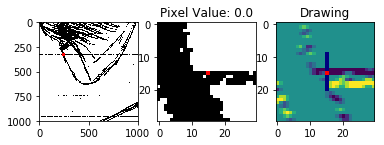

237
-0.6666666666666666
0.3333333333333333
-0.3333333333333333


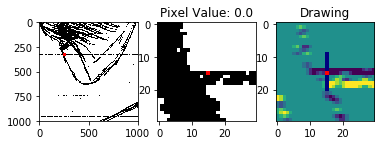

238
-0.6666666666666666
0.6666666666666666
0.0


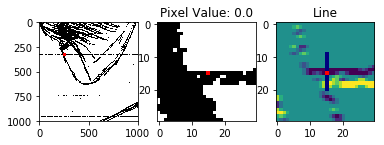

239
-0.6666666666666666
0.6666666666666666
0.0


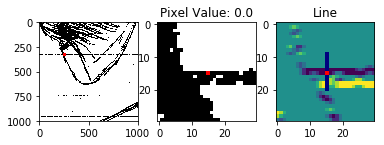

240
-0.6666666666666666
0.6666666666666666
0.0


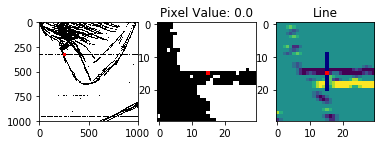

241
-0.6666666666666666
0.6666666666666666
0.0


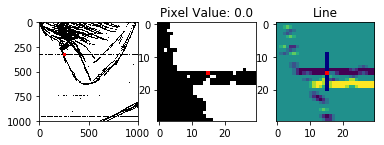

242
-0.6666666666666666
0.6666666666666666
0.0


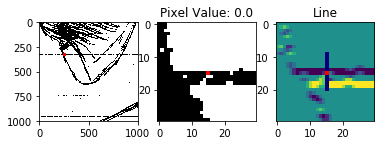

243
-0.6666666666666666
0.6666666666666666
0.0


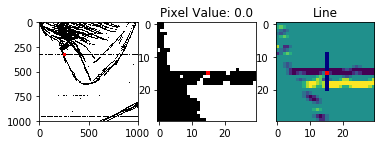

244
-0.6666666666666666
0.6666666666666666
0.0


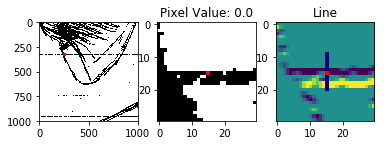

245
-0.6666666666666666
0.6666666666666666
0.0


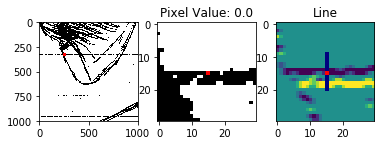

246
-0.6666666666666666
0.6666666666666666
0.0


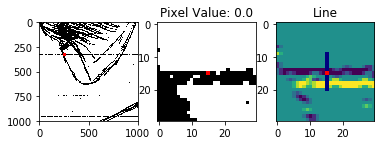

247
-0.6666666666666666
0.6666666666666666
0.0


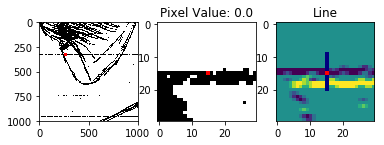

248
-0.5
0.5
0.0


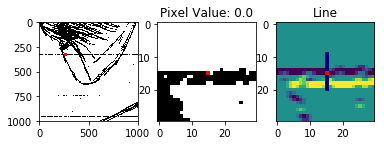

249


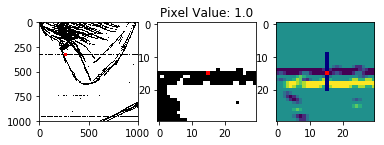

250
-0.5
0.5
0.0


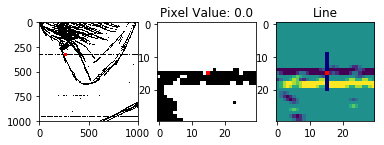

251
-0.8333333333333334
0.8333333333333334
0.0


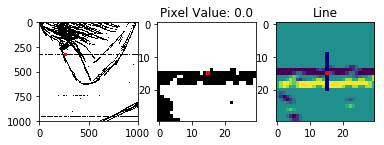

252
-1.0
1.0
0.0


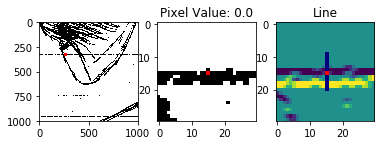

253
-0.8333333333333334
0.8333333333333334
0.0


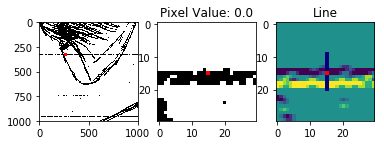

254
-0.6666666666666666
0.6666666666666666
0.0


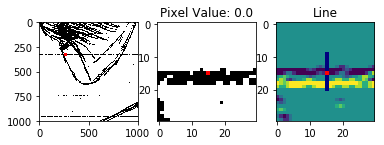

255
-0.6666666666666666
0.6666666666666666
0.0


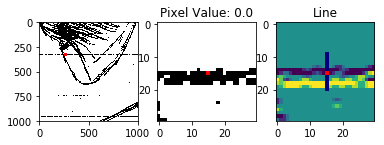

256
-0.6666666666666666
0.6666666666666666
0.0


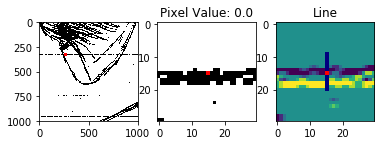

257
-0.8333333333333334
0.8333333333333334
0.0


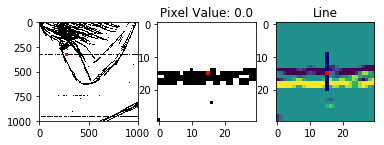

258
-1.1666666666666667
1.1666666666666667
0.0


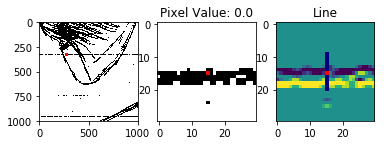

259
-1.0
1.0
0.0


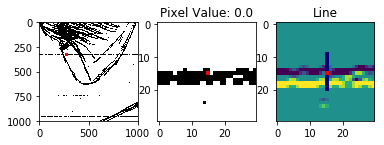

260


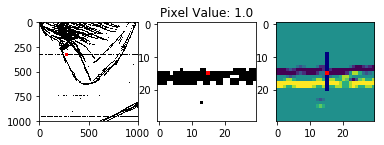

261
-0.5
0.5
0.0


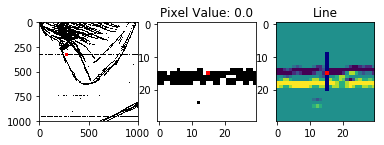

262
-0.6666666666666666
0.6666666666666666
0.0


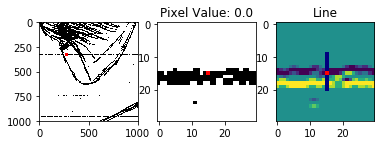

263
-0.6666666666666666
0.6666666666666666
0.0


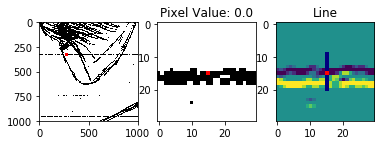

264
-0.6666666666666666
0.6666666666666666
0.0


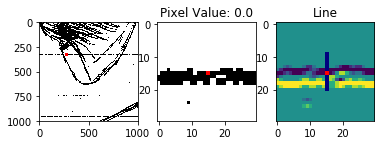

265
-0.6666666666666666
0.6666666666666666
0.0


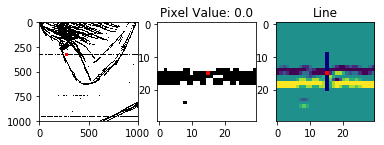

266
-0.6666666666666666
0.6666666666666666
0.0


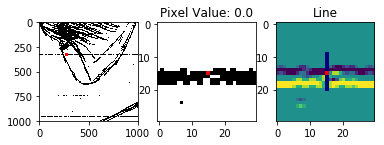

267
-0.8333333333333334
0.8333333333333334
0.0


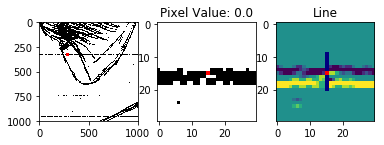

268
-1.1666666666666667
1.1666666666666667
0.0


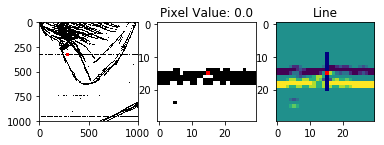

269
-1.3333333333333333
1.3333333333333333
0.0


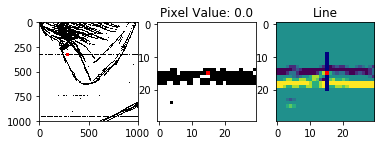

270
-1.3333333333333333
1.3333333333333333
0.0


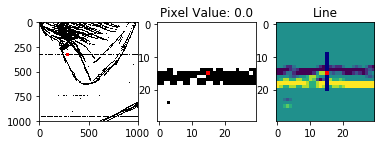

271
-1.1666666666666667
1.1666666666666667
0.0


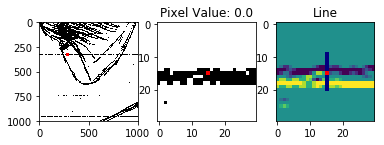

272
-1.0
1.0
0.0


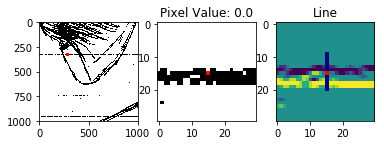

273
-1.1666666666666667
1.1666666666666667
0.0


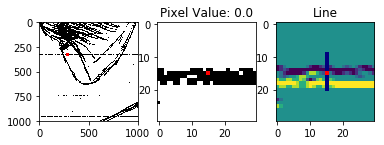

274
-1.1666666666666667
1.1666666666666667
0.0


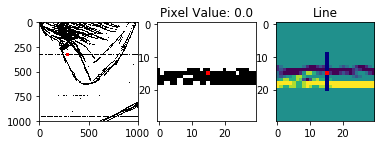

275
-0.8333333333333334
0.8333333333333334
0.0


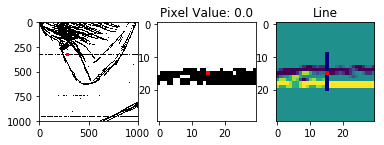

276
-0.6666666666666666
0.6666666666666666
0.0


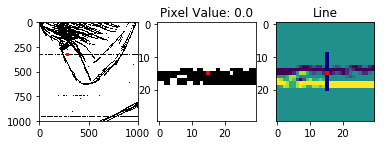

277
-0.6666666666666666
0.6666666666666666
0.0


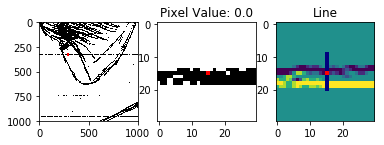

278
-0.8333333333333334
0.8333333333333334
0.0


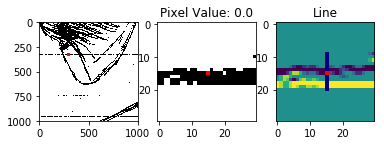

279
-1.0
1.0
0.0


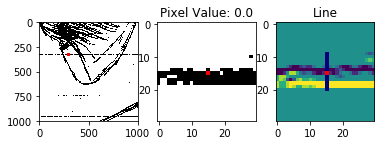

280
-0.8333333333333334
0.8333333333333334
0.0


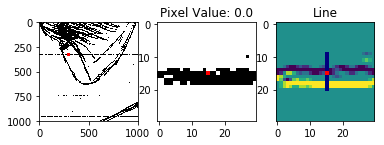

281
-0.6666666666666666
0.6666666666666666
0.0


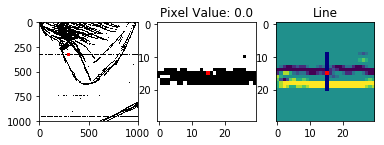

282
-0.6666666666666666
0.6666666666666666
0.0


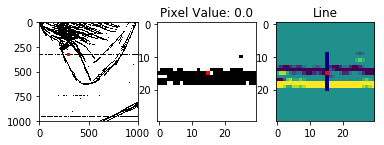

283


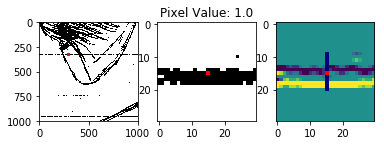

284
-1.1666666666666667
1.1666666666666667
0.0


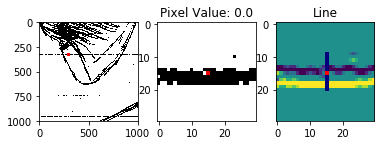

285
-1.3333333333333333
1.3333333333333333
0.0


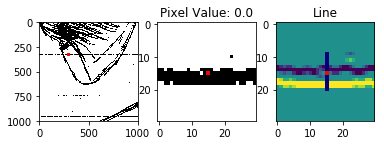

286
-1.1666666666666667
1.1666666666666667
0.0


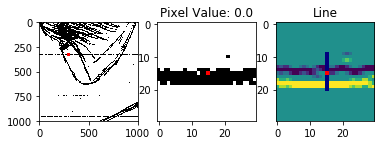

287
-0.8333333333333334
0.8333333333333334
0.0


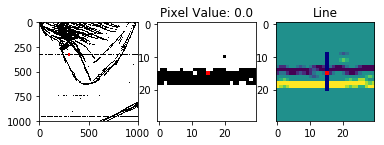

288
-0.8333333333333334
0.8333333333333334
0.0


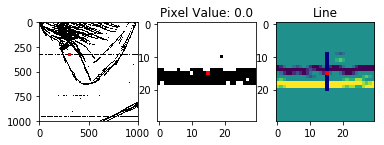

289
-1.1666666666666667
1.1666666666666667
0.0


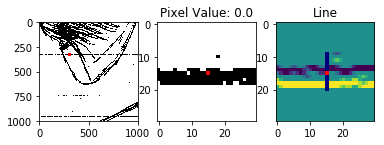

290
-1.3333333333333333
1.3333333333333333
0.0


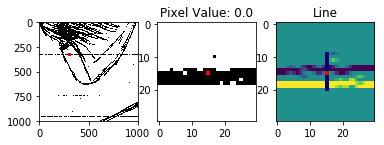

291
-1.3333333333333333
1.3333333333333333
0.0


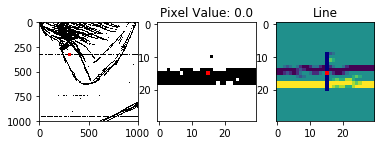

292
-1.1666666666666667
1.1666666666666667
0.0


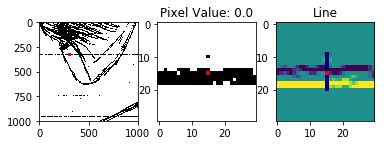

293
-0.8333333333333334
0.8333333333333334
0.0


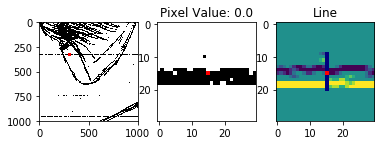

294
-0.6666666666666666
0.6666666666666666
0.0


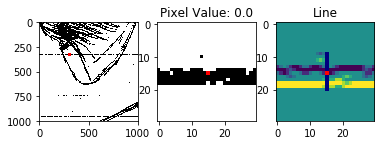

295
-0.6666666666666666
0.6666666666666666
0.0


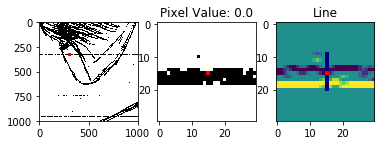

296
-0.8333333333333334
0.8333333333333334
0.0


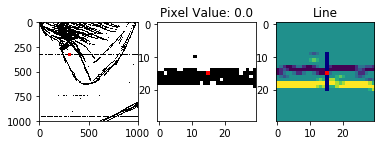

297
-1.1666666666666667
1.1666666666666667
0.0


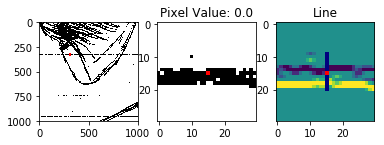

298
-1.3333333333333333
1.3333333333333333
0.0


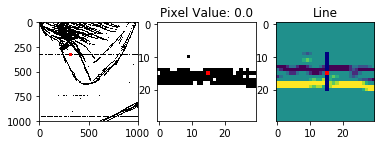

299
-1.3333333333333333
1.3333333333333333
0.0


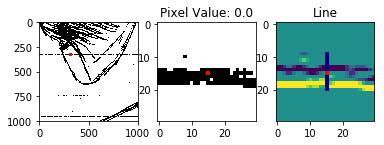

300
-1.3333333333333333
1.3333333333333333
0.0


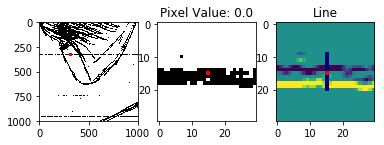

301
-1.3333333333333333
1.3333333333333333
0.0


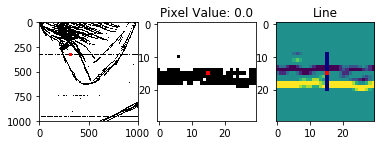

302
-1.3333333333333333
1.3333333333333333
0.0


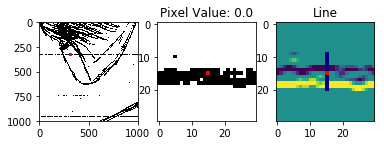

303
-1.3333333333333333
1.3333333333333333
0.0


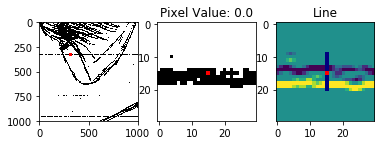

304
-1.3333333333333333
1.3333333333333333
0.0


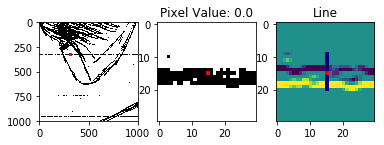

305
-1.0
1.0
0.0


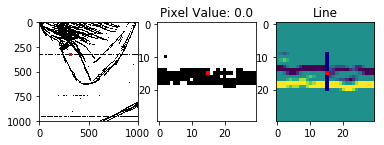

306


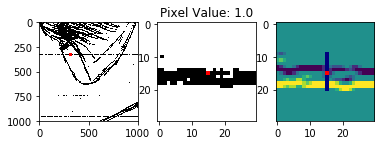

307
-0.6666666666666666
0.6666666666666666
0.0


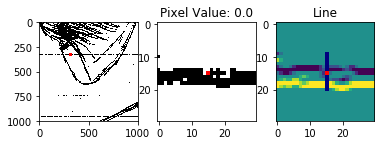

308
-1.0
1.0
0.0


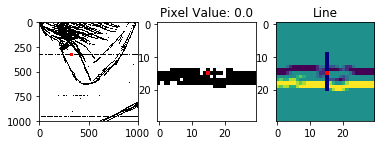

309
-1.0
1.0
0.0


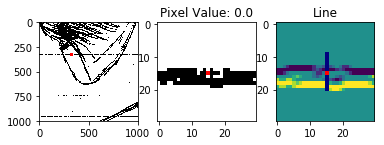

310
-1.0
1.0
0.0


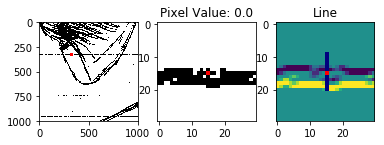

311
-0.8333333333333334
0.8333333333333334
0.0


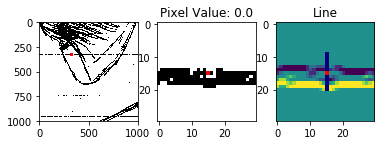

312
-0.5
0.5
0.0


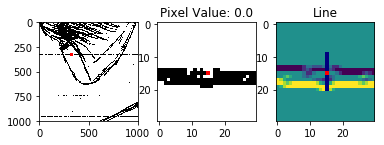

313


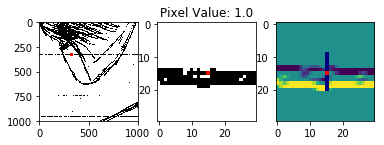

314
-1.0
1.0
0.0


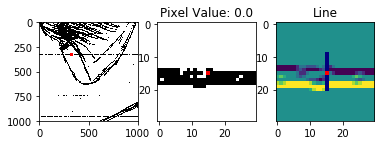

315
-1.1666666666666667
1.1666666666666667
0.0


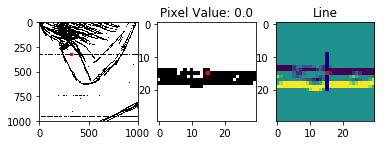

316
-0.8333333333333334
0.8333333333333334
0.0


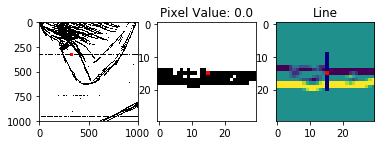

317
-0.6666666666666666
0.6666666666666666
0.0


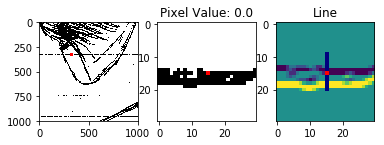

318
-0.6666666666666666
0.6666666666666666
0.0


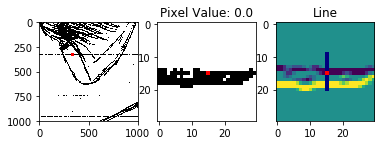

319
-0.6666666666666666
0.6666666666666666
0.0


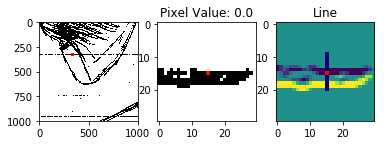

320
-0.6666666666666666
0.6666666666666666
0.0


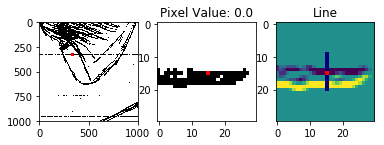

321
-0.6666666666666666
0.6666666666666666
0.0


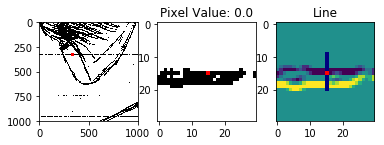

322
-0.6666666666666666
0.6666666666666666
0.0


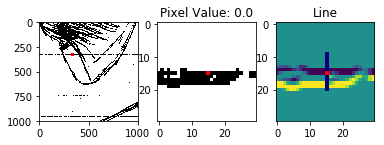

323
-0.6666666666666666
0.6666666666666666
0.0


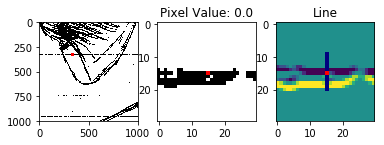

324
-0.6666666666666666
0.6666666666666666
0.0


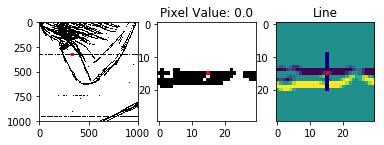

325
-0.6666666666666666
0.6666666666666666
0.0


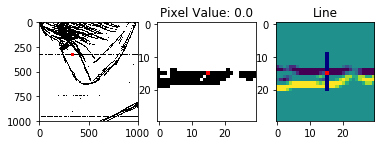

326
-0.6666666666666666
0.6666666666666666
0.0


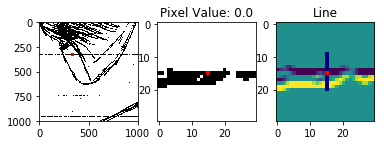

327
-0.6666666666666666
0.6666666666666666
0.0


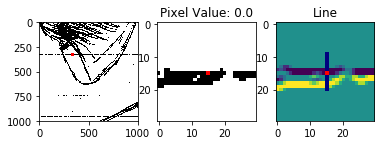

328
-0.6666666666666666
0.6666666666666666
0.0


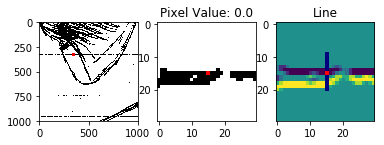

329
-0.6666666666666666
0.6666666666666666
0.0


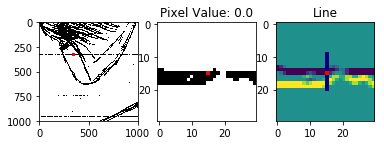

330
-0.8333333333333334
0.8333333333333334
0.0


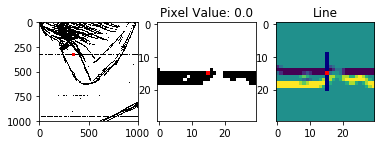

331
-1.0
1.0
0.0


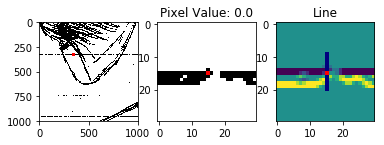

332
-0.6666666666666666
0.6666666666666666
0.0


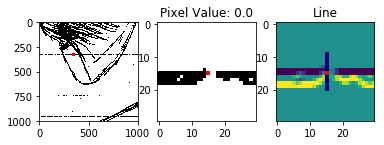

333


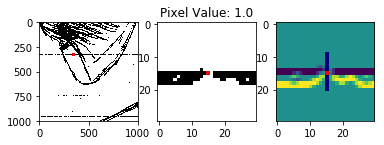

334


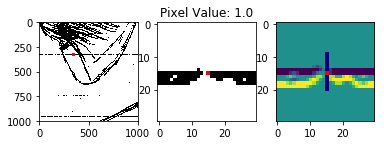

335
-0.5
0.5
0.0


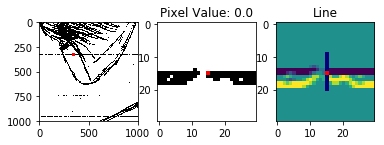

336
-0.6666666666666666
0.6666666666666666
0.0


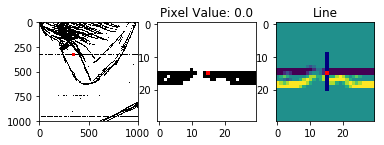

337
-0.6666666666666666
0.6666666666666666
0.0


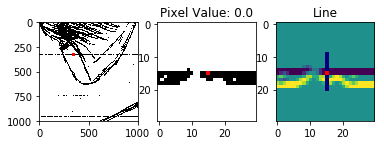

338
-0.6666666666666666
0.6666666666666666
0.0


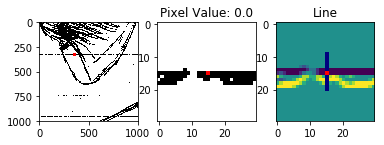

339
-0.6666666666666666
0.6666666666666666
0.0


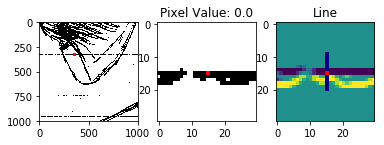

340
-0.6666666666666666
0.6666666666666666
0.0


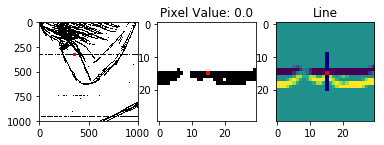

341
-0.6666666666666666
0.6666666666666666
0.0


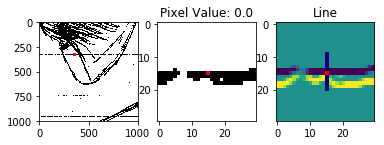

342
-0.6666666666666666
0.6666666666666666
0.0


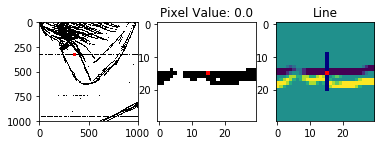

343
-0.6666666666666666
0.6666666666666666
0.0


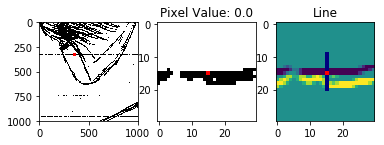

344
-0.6666666666666666
0.6666666666666666
0.0


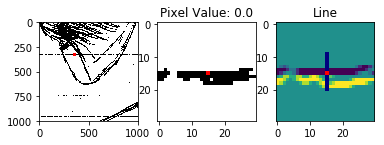

345
-0.6666666666666666
0.6666666666666666
0.0


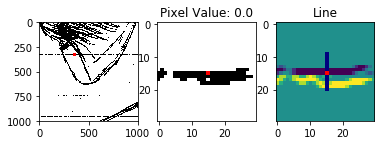

346
-0.6666666666666666
0.6666666666666666
0.0


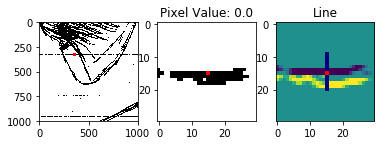

347
-0.6666666666666666
0.6666666666666666
0.0


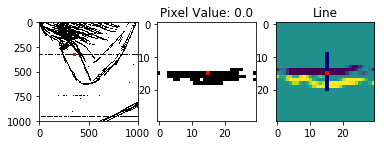

348
-0.6666666666666666
0.6666666666666666
0.0


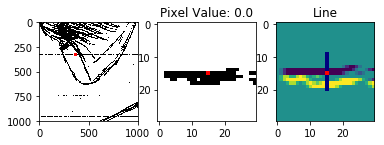

349
-0.6666666666666666
0.6666666666666666
0.0


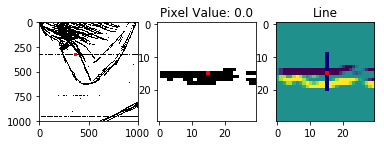

350
-0.6666666666666666
0.6666666666666666
0.0


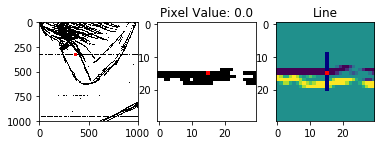

351
-0.6666666666666666
0.6666666666666666
0.0


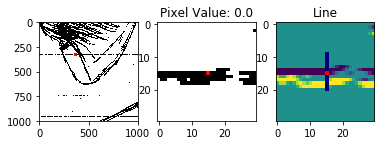

352
-0.6666666666666666
0.6666666666666666
0.0


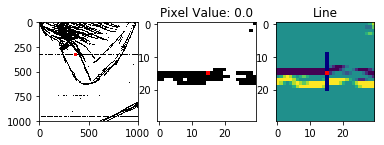

353
-0.8333333333333334
0.8333333333333334
0.0


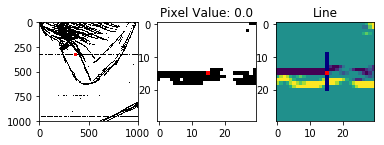

354
-1.1666666666666667
1.1666666666666667
0.0


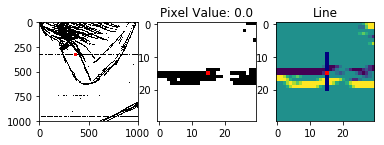

355
-1.3333333333333333
1.3333333333333333
0.0


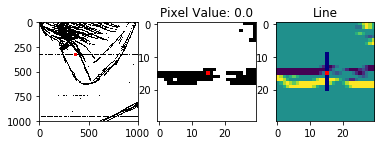

356
-1.1666666666666667
1.1666666666666667
0.0


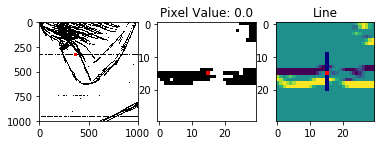

357


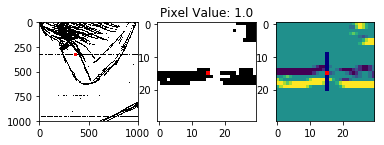

358


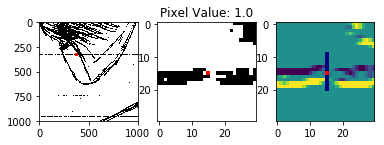

359


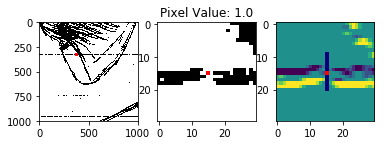

360


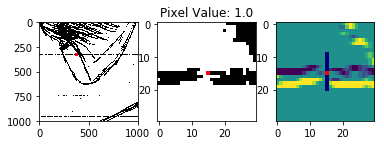

361
-0.5
0.5
0.0


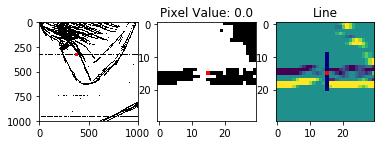

362
-0.6666666666666666
0.6666666666666666
0.0


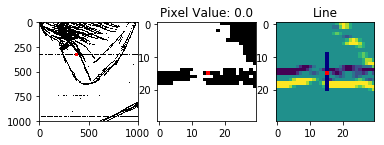

363
-0.6666666666666666
0.6666666666666666
0.0


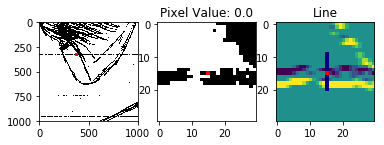

364
-0.6666666666666666
0.6666666666666666
0.0


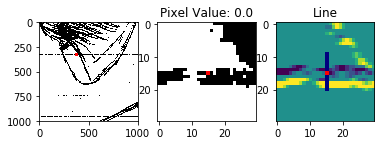

365
-0.5
0.5
0.0


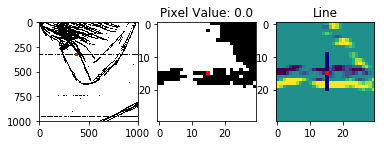

366


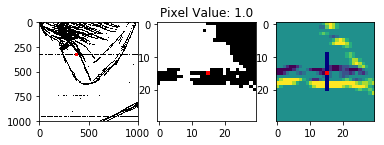

367
-1.0
1.0
0.0


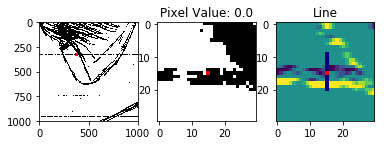

368
-1.3333333333333333
1.3333333333333333
0.0


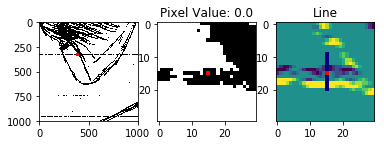

369
-1.3333333333333333
1.3333333333333333
0.0


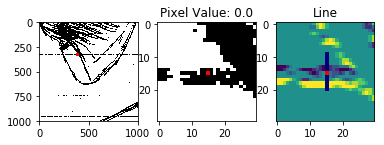

370
-1.0
1.0
0.0


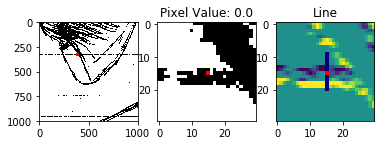

371


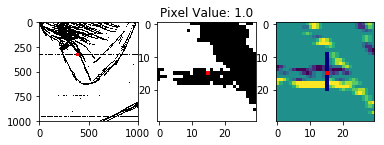

372
-0.5
0.8333333333333334
0.33333333333333337


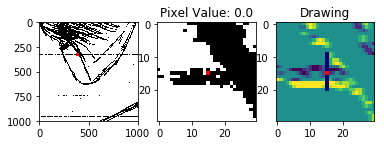

373
0.16666666666666666
0.8333333333333334
1.0


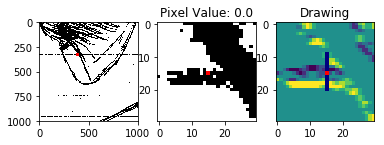

374
0.5
0.8333333333333334
1.3333333333333335


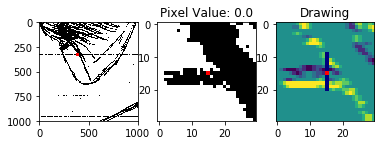

375
0.3333333333333333
1.0
1.3333333333333333


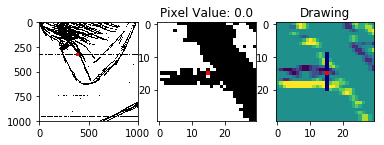

376
0.5
0.8333333333333334
1.3333333333333335


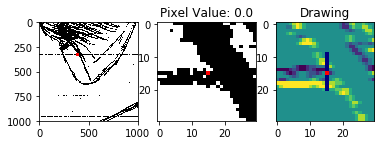

377
0.5
0.8333333333333334
1.3333333333333335


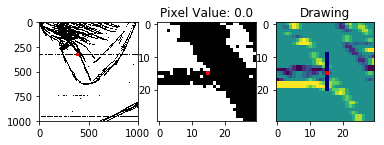

378
0.16666666666666666
1.1666666666666667
1.3333333333333335


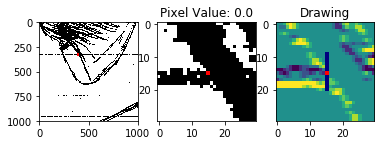

379
0.0
1.1666666666666667
1.1666666666666667


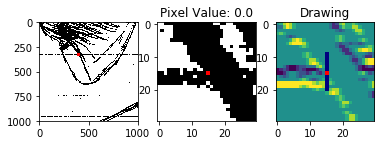

380
0.0
0.8333333333333334
0.8333333333333334


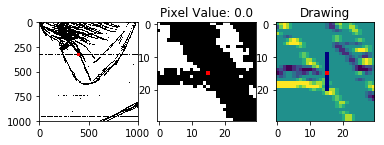

381
0.0
0.6666666666666666
0.6666666666666666


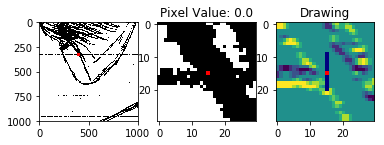

382
0.0
0.5
0.5


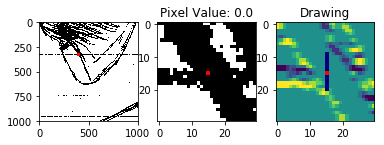

383
0.0
0.16666666666666666
0.16666666666666666


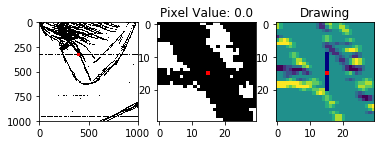

384
-0.16666666666666666
0.0
-0.16666666666666666


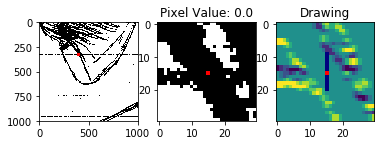

385
-0.5
0.0
-0.5


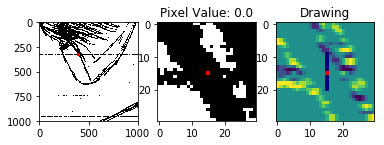

386
-0.8333333333333334
0.0
-0.8333333333333334


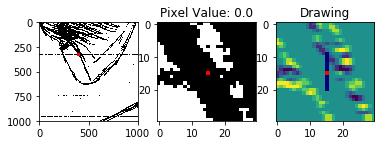

387
-1.1666666666666667
0.0
-1.1666666666666667


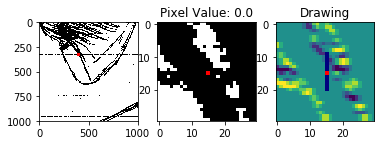

388
-1.3333333333333333
0.0
-1.3333333333333333


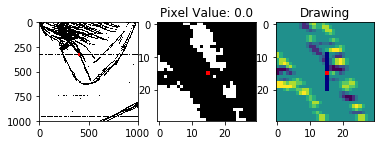

389
-1.3333333333333333
0.0
-1.3333333333333333


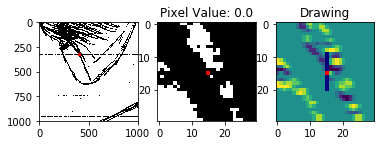

390
-1.1666666666666667
0.0
-1.1666666666666667


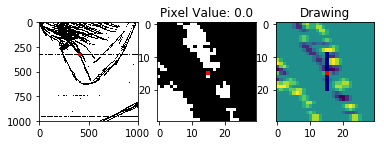

391
-0.8333333333333334
-0.16666666666666666
-1.0


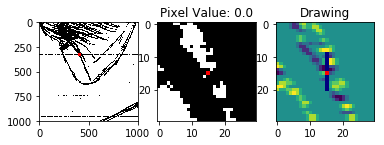

392
-0.5
0.0
-0.5


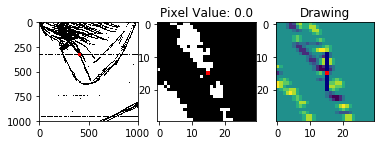

393
-0.16666666666666666
0.8333333333333334
0.6666666666666667


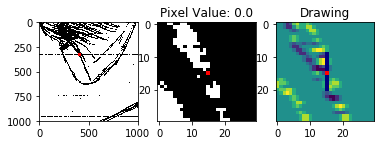

394
0.0
1.3333333333333333
1.3333333333333333


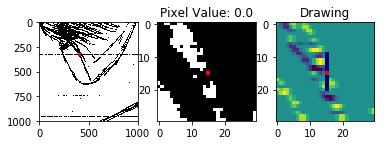

395
0.0
1.3333333333333333
1.3333333333333333


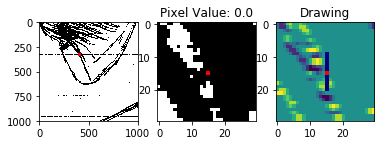

396
0.0
1.0
1.0


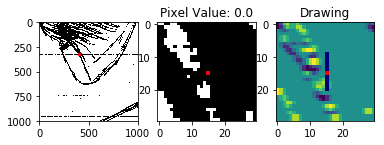

397
0.0
0.3333333333333333
0.3333333333333333


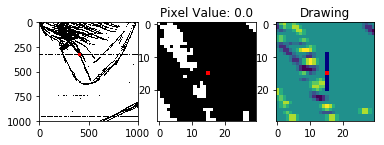

398
0.0
0.0
0.0


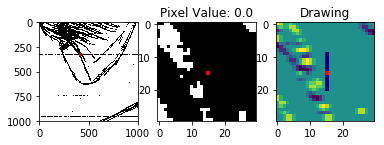

399
0.0
0.0
0.0


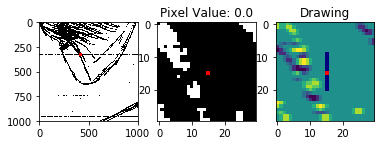

400
0.0
0.0
0.0


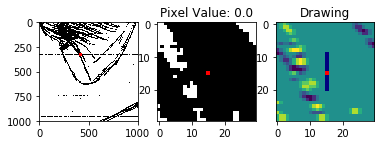

401
0.0
0.0
0.0


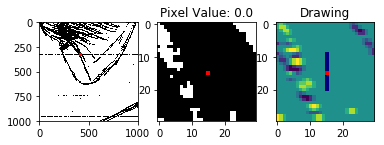

402
0.0
0.0
0.0


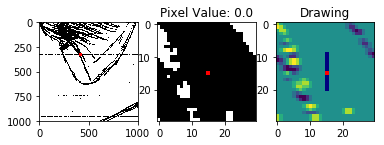

403
0.0
0.0
0.0


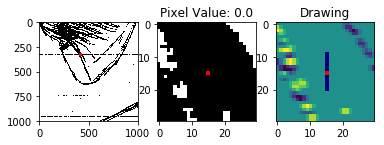

404
0.0
0.0
0.0


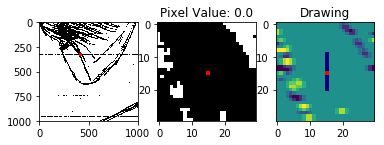

405
0.0
0.0
0.0


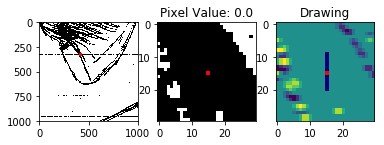

406
0.0
0.0
0.0


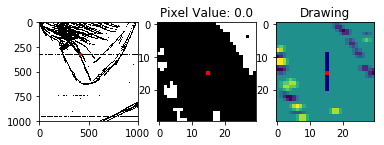

407
0.0
0.0
0.0


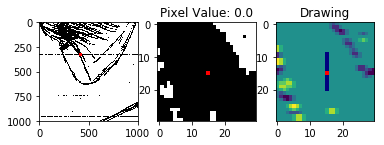

408
0.0
0.0
0.0


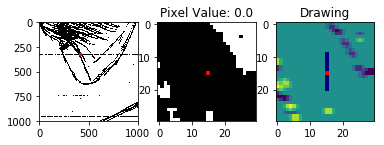

409
0.0
0.0
0.0


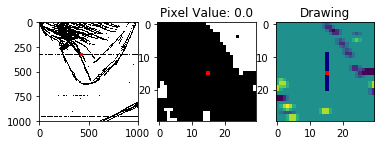

410
0.0
0.0
0.0


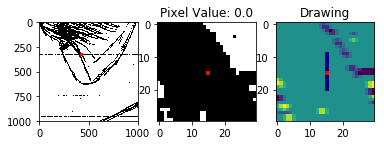

411
0.0
0.0
0.0


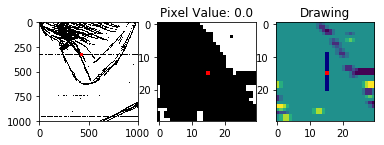

412
0.0
0.0
0.0


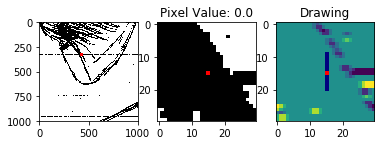

413
0.0
0.0
0.0


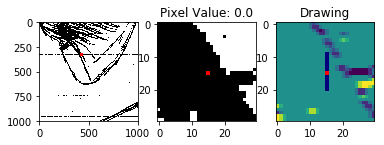

414
-0.16666666666666666
0.0
-0.16666666666666666


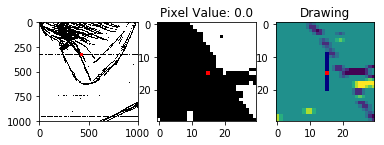

415
-0.6666666666666666
0.0
-0.6666666666666666


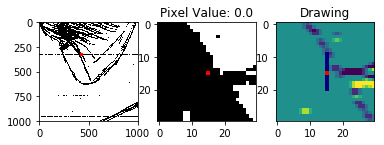

416
-1.1666666666666667
0.0
-1.1666666666666667


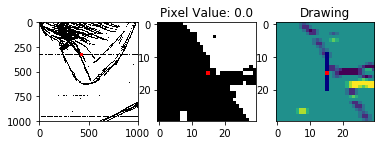

417
-1.3333333333333333
0.0
-1.3333333333333333


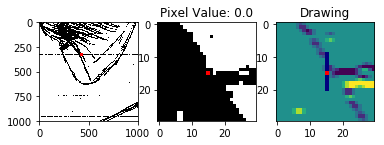

418
-1.0
-0.3333333333333333
-1.3333333333333333


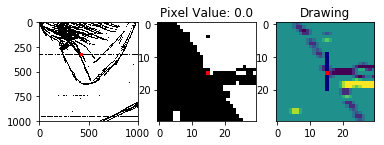

419


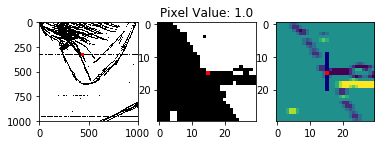

420
-0.5
-0.8333333333333334
-1.3333333333333335


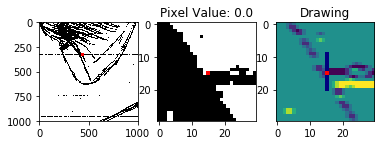

421
-0.6666666666666666
-0.6666666666666666
-1.3333333333333333


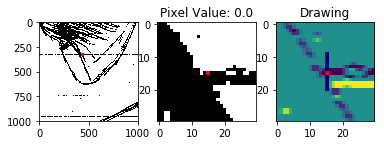

422
-0.6666666666666666
-0.5
-1.1666666666666665


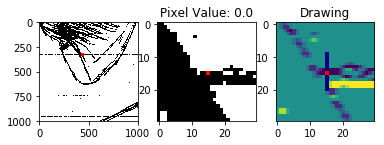

423
-0.6666666666666666
-0.16666666666666666
-0.8333333333333333


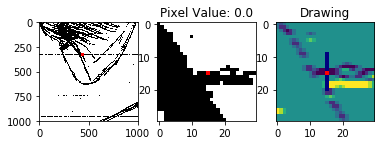

424
-0.6666666666666666
0.16666666666666666
-0.5


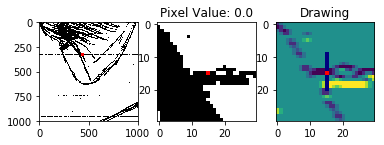

425
-0.6666666666666666
0.5
-0.16666666666666663


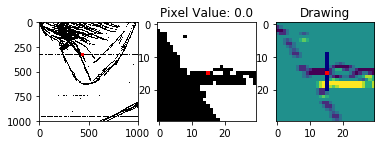

426
-0.6666666666666666
0.6666666666666666
0.0


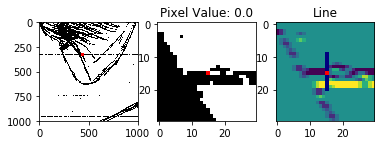

427


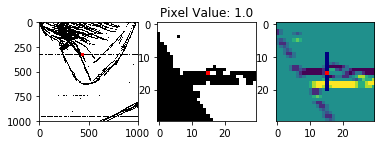

428


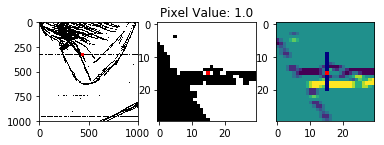

429


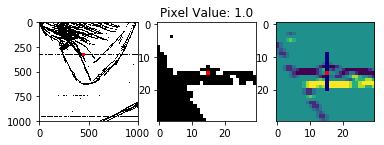

430
-1.1666666666666667
1.1666666666666667
0.0


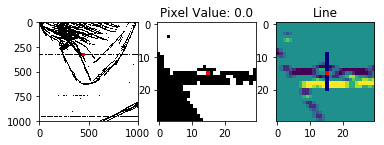

431
-1.1666666666666667
1.1666666666666667
0.0


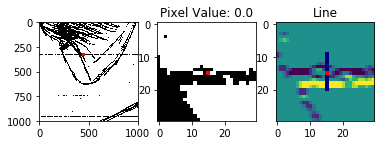

432


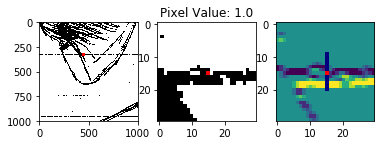

433


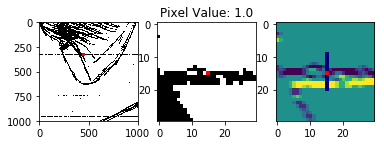

434
-0.5
0.5
0.0


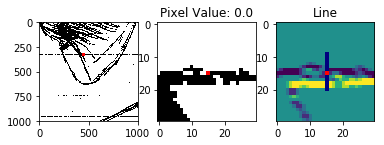

435
-0.6666666666666666
0.6666666666666666
0.0


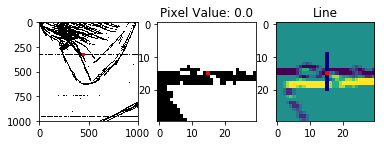

436
-0.6666666666666666
0.6666666666666666
0.0


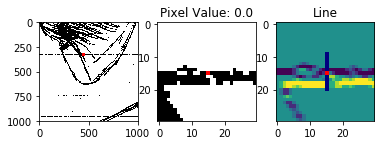

437
-0.6666666666666666
0.6666666666666666
0.0


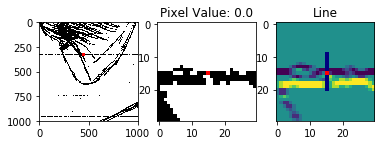

438
-0.6666666666666666
0.6666666666666666
0.0


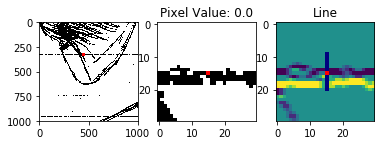

439
-0.6666666666666666
0.6666666666666666
0.0


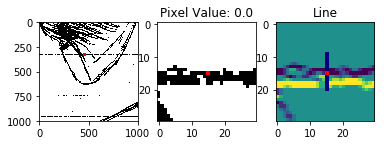

440
-0.6666666666666666
0.6666666666666666
0.0


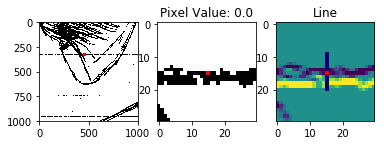

441
-0.6666666666666666
0.6666666666666666
0.0


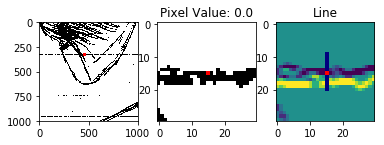

442
-0.5
0.5
0.0


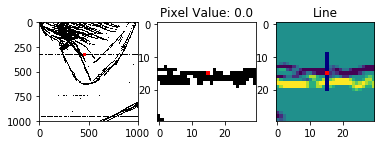

443


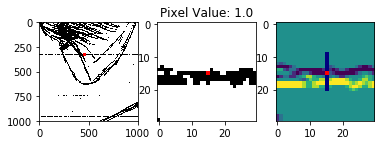

444
-0.8333333333333334
0.8333333333333334
0.0


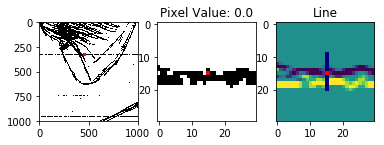

445
-0.8333333333333334
0.8333333333333334
0.0


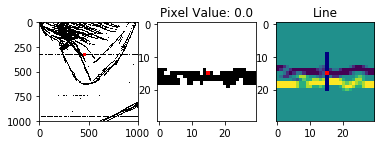

446
-0.5
0.5
0.0


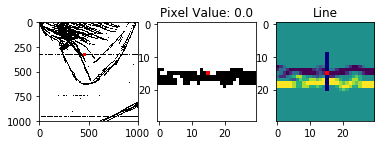

447


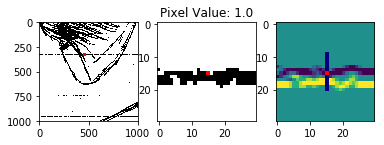

448


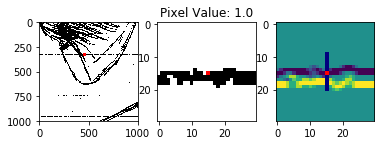

449
-0.5
0.5
0.0


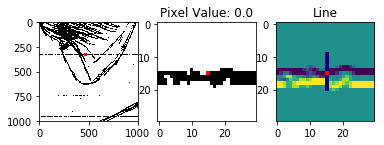

450
-0.6666666666666666
0.6666666666666666
0.0


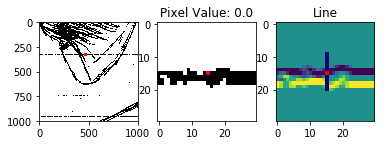

451
-0.6666666666666666
0.6666666666666666
0.0


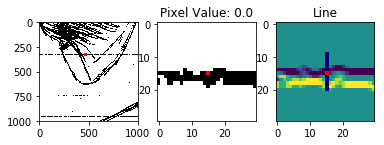

452
-0.8333333333333334
0.8333333333333334
0.0


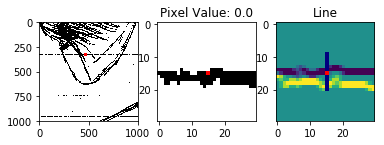

453
-1.1666666666666667
1.1666666666666667
0.0


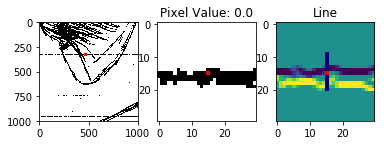

454
-1.3333333333333333
1.3333333333333333
0.0


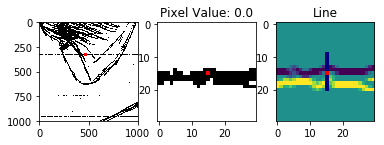

455
-1.3333333333333333
1.3333333333333333
0.0


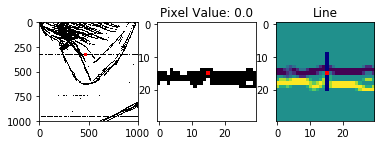

456
-1.1666666666666667
1.1666666666666667
0.0


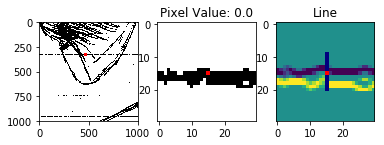

457
-0.8333333333333334
0.8333333333333334
0.0


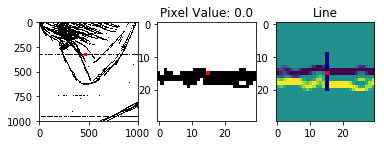

458
-0.6666666666666666
0.6666666666666666
0.0


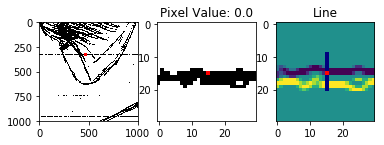

459
-0.6666666666666666
0.6666666666666666
0.0


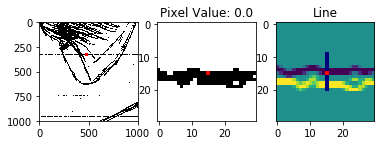

460
-0.6666666666666666
0.6666666666666666
0.0


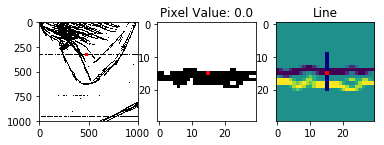

461
-0.6666666666666666
0.6666666666666666
0.0


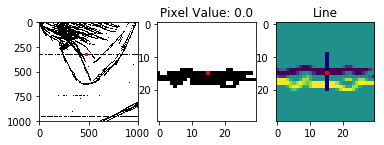

462
-0.6666666666666666
0.6666666666666666
0.0


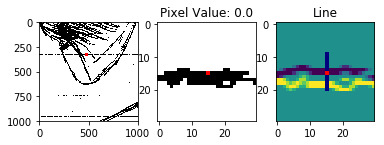

463
-0.6666666666666666
0.6666666666666666
0.0


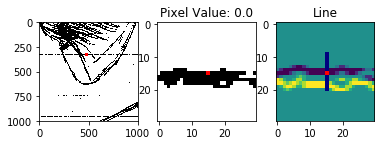

464
-0.6666666666666666
0.6666666666666666
0.0


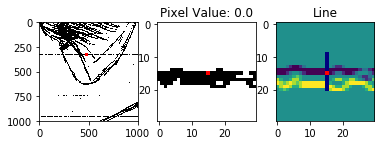

465
-0.6666666666666666
0.6666666666666666
0.0


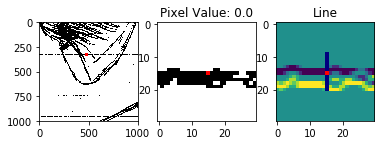

466
-0.8333333333333334
0.8333333333333334
0.0


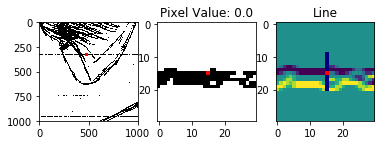

467
-1.1666666666666667
1.1666666666666667
0.0


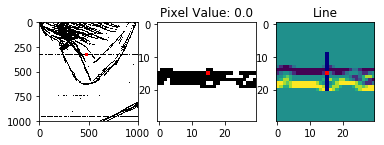

468
-1.1666666666666667
1.1666666666666667
0.0


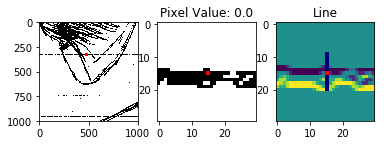

469
-0.8333333333333334
0.8333333333333334
0.0


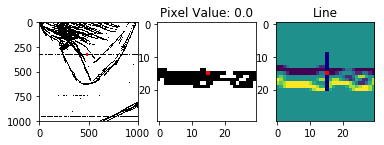

470
-0.6666666666666666
0.6666666666666666
0.0


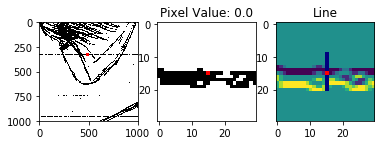

471
-0.6666666666666666
0.6666666666666666
0.0


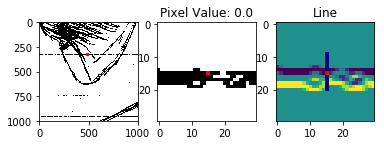

472
-0.6666666666666666
0.6666666666666666
0.0


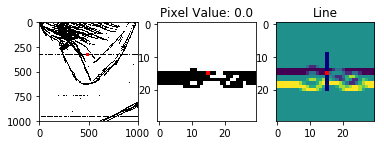

473
-0.6666666666666666
0.6666666666666666
0.0


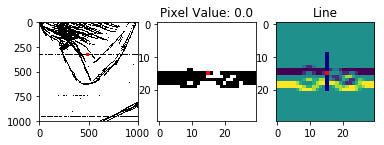

474
-0.5
0.5
0.0


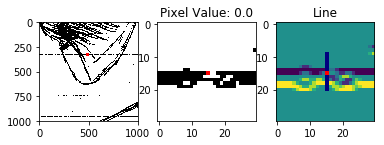

475


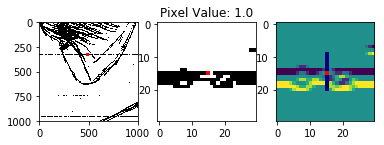

476


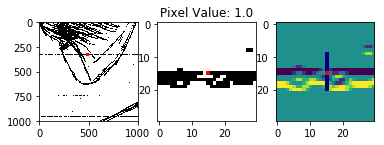

477
-0.5
0.5
0.0


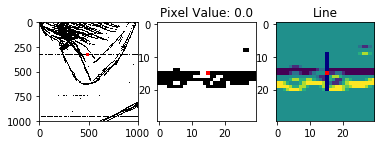

478
-0.6666666666666666
0.6666666666666666
0.0


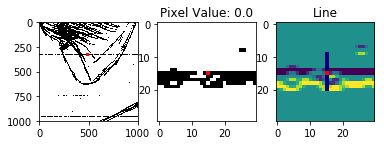

479
-0.6666666666666666
0.6666666666666666
0.0


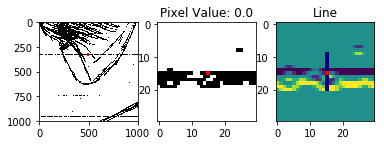

480
-0.6666666666666666
0.6666666666666666
0.0


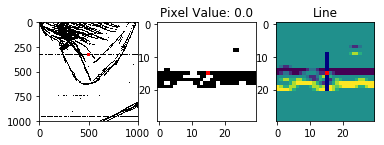

481
-0.6666666666666666
0.6666666666666666
0.0


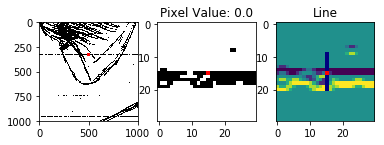

482
-0.6666666666666666
0.6666666666666666
0.0


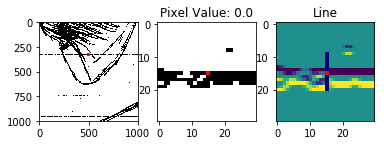

483
-0.6666666666666666
0.6666666666666666
0.0


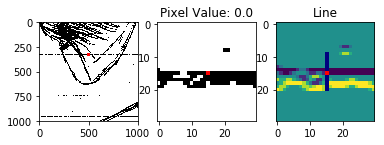

484
-0.6666666666666666
0.6666666666666666
0.0


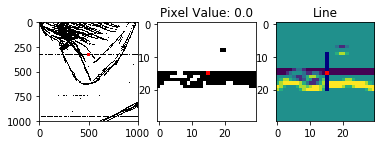

485
-0.6666666666666666
0.6666666666666666
0.0


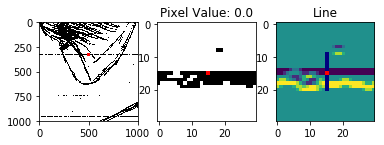

486
-0.6666666666666666
0.6666666666666666
0.0


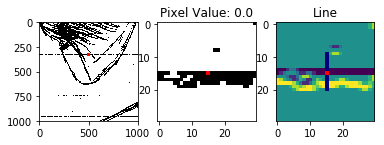

487
-0.5
0.6666666666666666
0.16666666666666663


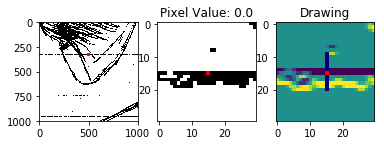

488
-0.16666666666666666
0.6666666666666666
0.5


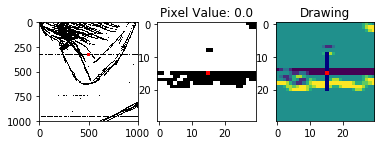

489
-0.16666666666666666
0.6666666666666666
0.5


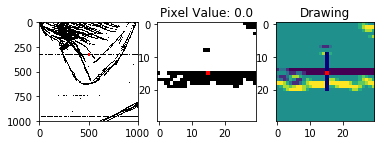

490
-0.5
0.6666666666666666
0.16666666666666663


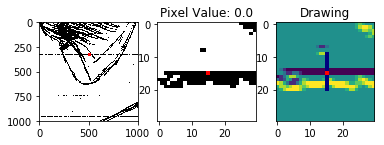

491
-0.6666666666666666
0.6666666666666666
0.0


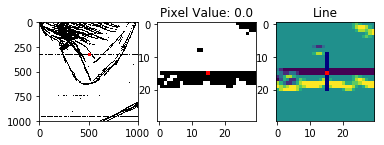

492
-0.6666666666666666
0.6666666666666666
0.0


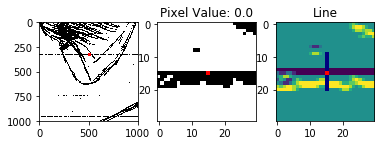

493
-0.6666666666666666
0.6666666666666666
0.0


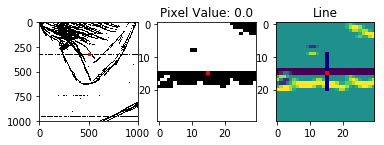

494
-0.6666666666666666
0.6666666666666666
0.0


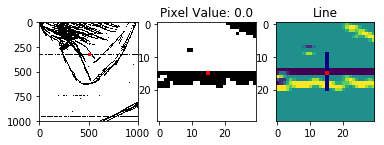

495
-0.6666666666666666
0.6666666666666666
0.0


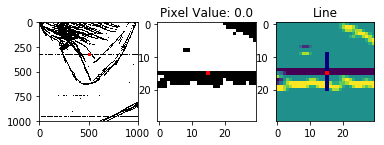

496
-0.6666666666666666
0.6666666666666666
0.0


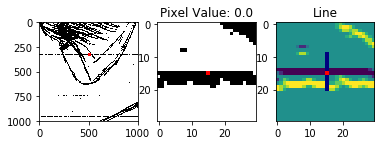

497
-0.6666666666666666
0.6666666666666666
0.0


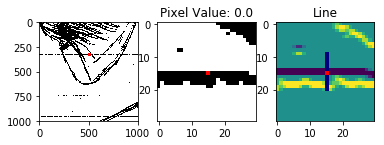

498
-0.6666666666666666
0.6666666666666666
0.0


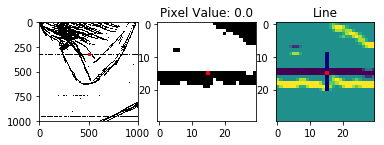

499
-0.6666666666666666
0.6666666666666666
0.0


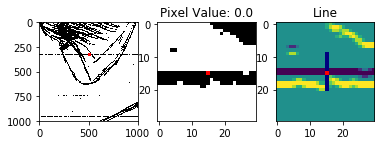

500
-0.6666666666666666
0.6666666666666666
0.0


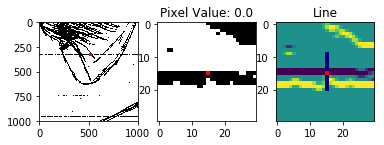

501
-0.6666666666666666
0.6666666666666666
0.0


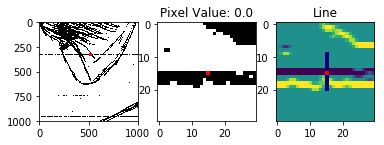

502
-0.6666666666666666
0.6666666666666666
0.0


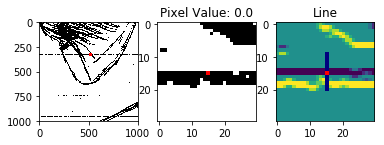

503
-0.6666666666666666
0.6666666666666666
0.0


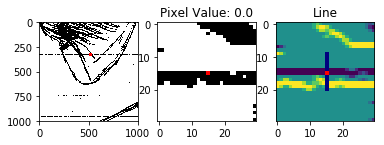

504
-0.6666666666666666
0.6666666666666666
0.0


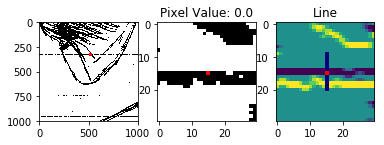

505
-0.6666666666666666
0.6666666666666666
0.0


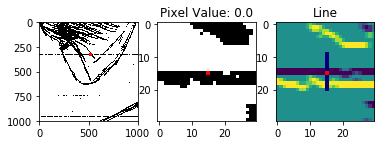

506
-0.6666666666666666
0.6666666666666666
0.0


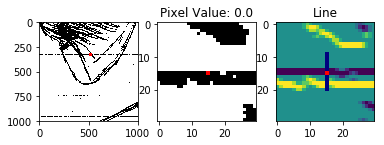

507
-0.6666666666666666
0.6666666666666666
0.0


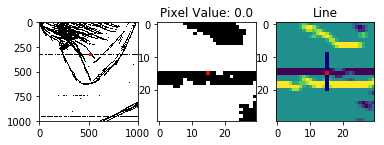

508
-0.6666666666666666
0.6666666666666666
0.0


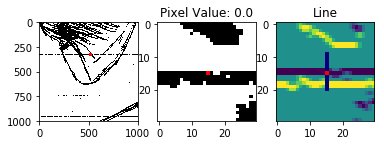

509
-0.5
0.5
0.0


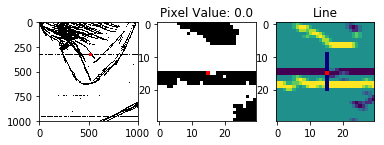

510


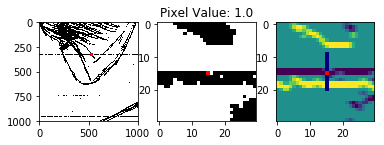

511


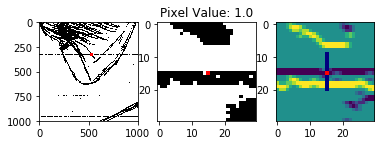

512
-0.5
0.5
0.0


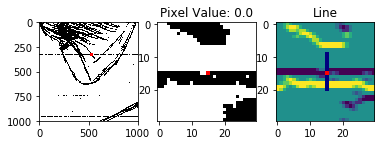

513
-0.6666666666666666
0.6666666666666666
0.0


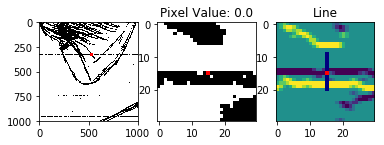

514
-0.6666666666666666
0.6666666666666666
0.0


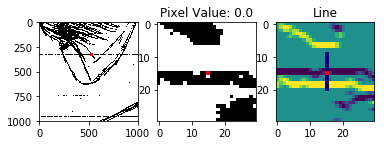

515
-0.6666666666666666
0.6666666666666666
0.0


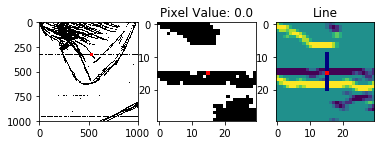

516
-0.6666666666666666
0.6666666666666666
0.0


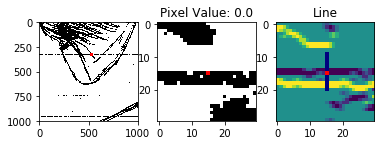

517
-0.6666666666666666
0.6666666666666666
0.0


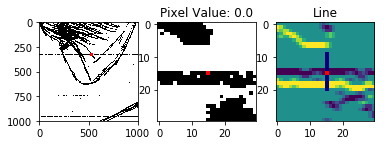

518
-0.6666666666666666
0.6666666666666666
0.0


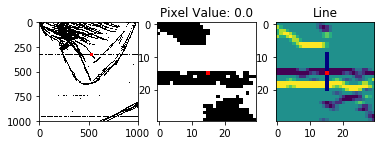

519
-0.6666666666666666
0.6666666666666666
0.0


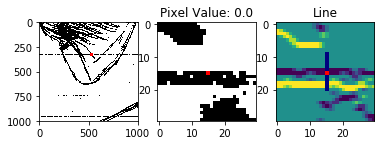

520
-0.6666666666666666
0.6666666666666666
0.0


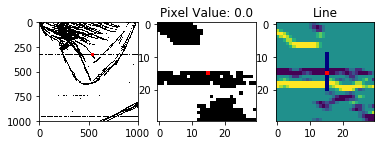

521
-0.6666666666666666
0.6666666666666666
0.0


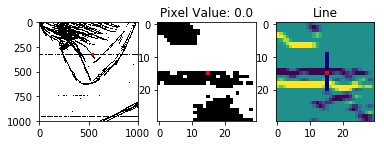

522
-0.6666666666666666
0.6666666666666666
0.0


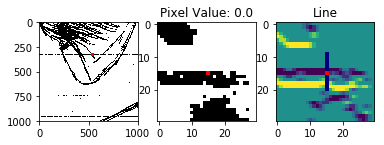

523
-0.6666666666666666
0.6666666666666666
0.0


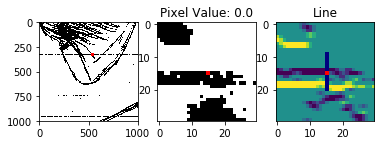

524
-0.6666666666666666
0.6666666666666666
0.0


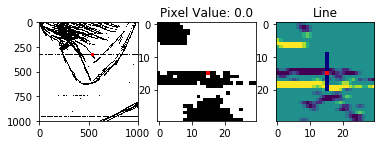

525
-0.6666666666666666
0.6666666666666666
0.0


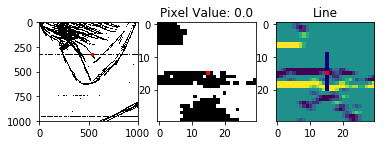

526
-0.5
0.5
0.0


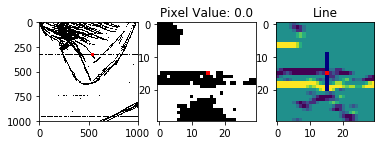

527


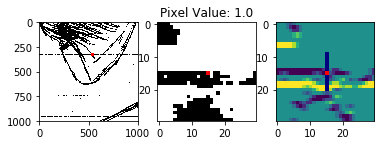

528


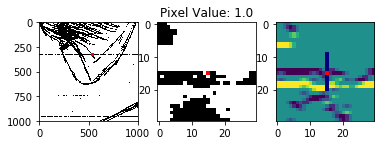

529
-0.5
0.3333333333333333
-0.16666666666666669


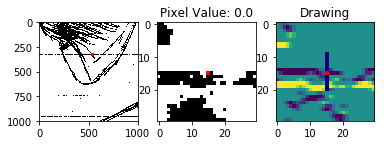

530
-0.5
0.16666666666666666
-0.33333333333333337


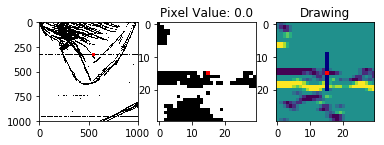

531


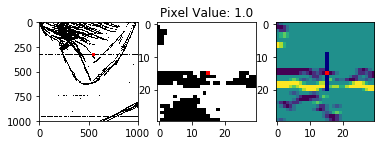

532


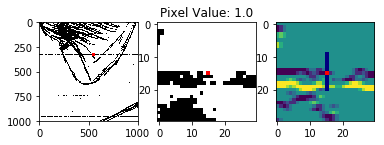

533


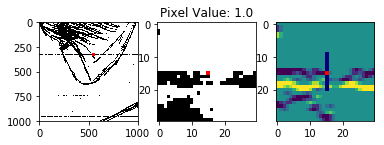

534


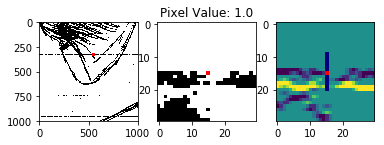

535


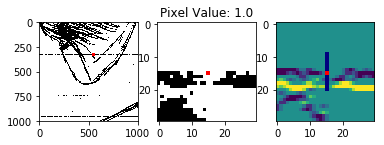

536


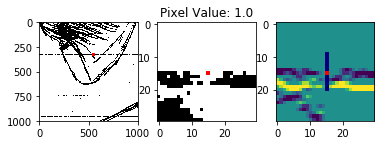

537


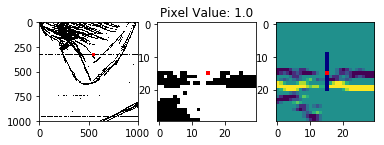

538


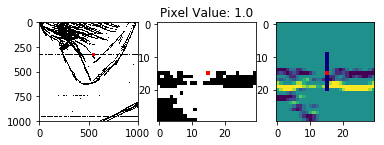

539


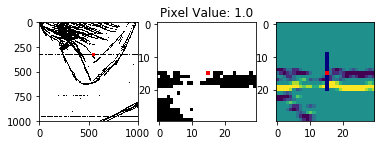

540


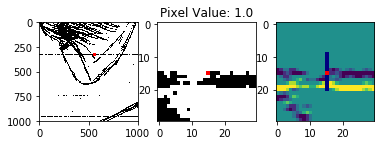

541
-0.5
0.5
0.0


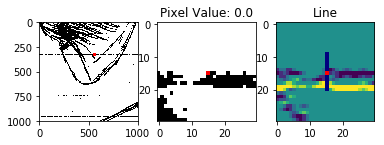

542
-0.6666666666666666
0.6666666666666666
0.0


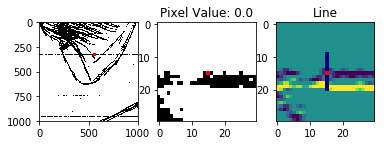

543
-0.5
0.5
0.0


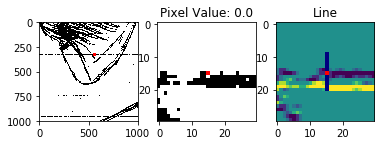

544


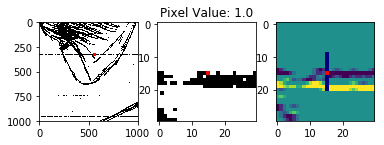

545


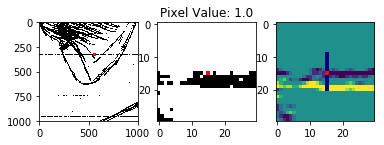

546


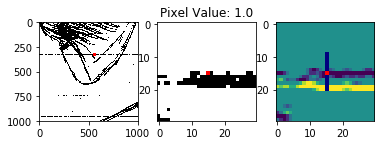

547
-0.3333333333333333
0.3333333333333333
0.0


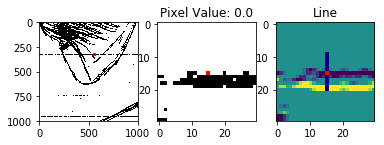

548


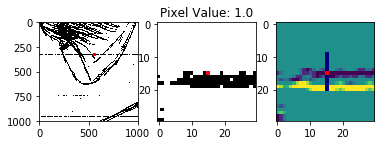

549


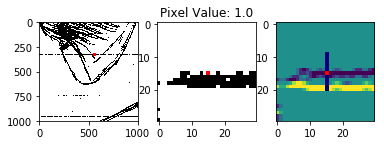

550


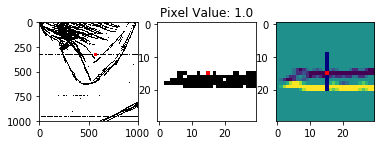

551


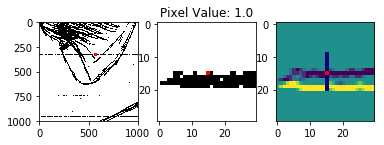

552
-0.3333333333333333
0.3333333333333333
0.0


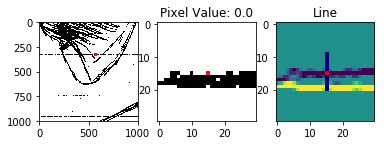

553


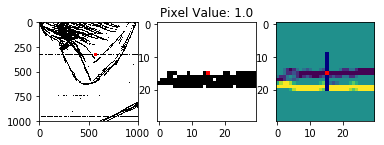

554


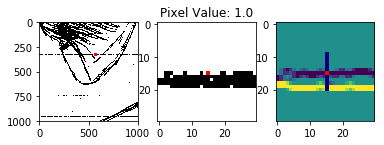

555


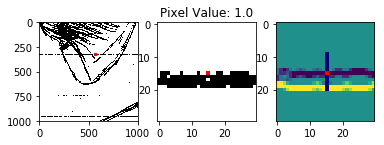

556


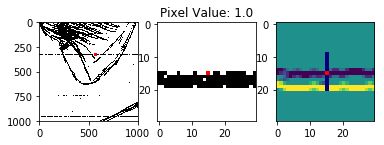

557


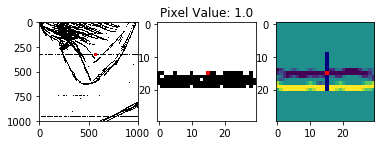

558
-0.5
0.5
0.0


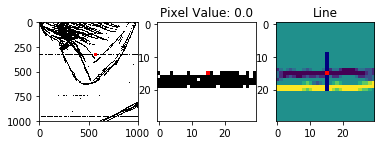

559
-0.5
0.5
0.0


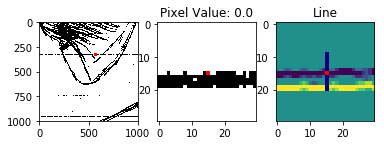

560


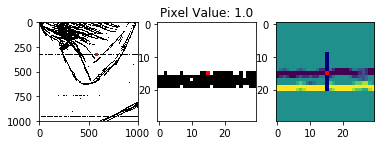

561


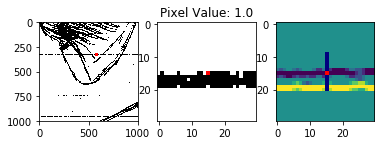

562
-0.5
0.5
0.0


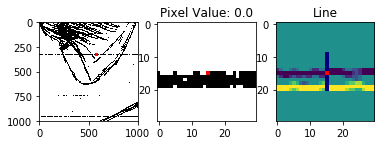

563
-0.6666666666666666
0.6666666666666666
0.0


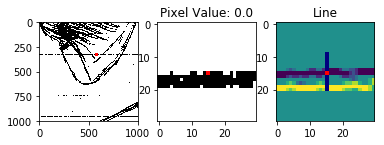

564
-0.6666666666666666
0.6666666666666666
0.0


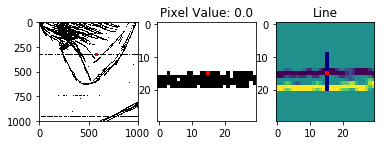

565
-0.6666666666666666
0.6666666666666666
0.0


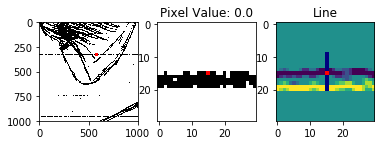

566
-0.6666666666666666
0.6666666666666666
0.0


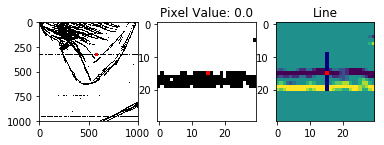

567
-0.5
0.5
0.0


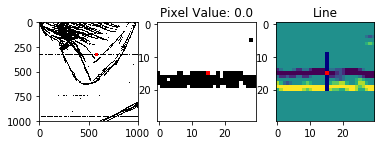

568


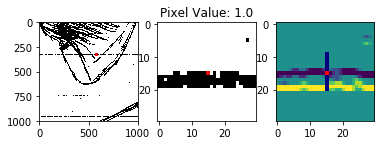

569


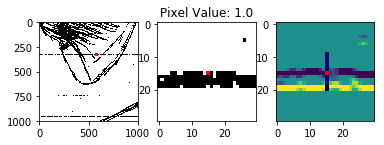

570
-0.3333333333333333
0.3333333333333333
0.0


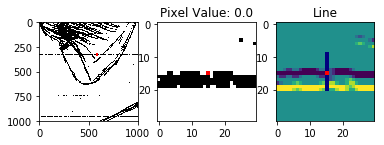

571


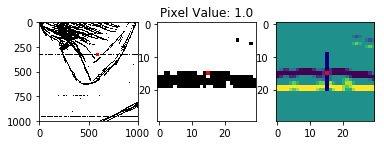

572
-0.5
0.5
0.0


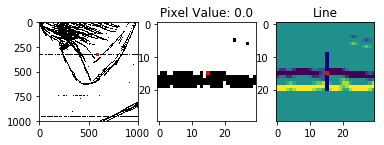

573
-0.6666666666666666
0.6666666666666666
0.0


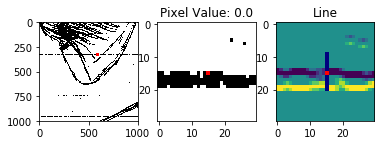

574
-0.6666666666666666
0.6666666666666666
0.0


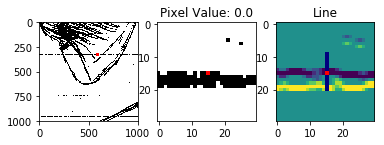

575
-0.6666666666666666
0.6666666666666666
0.0


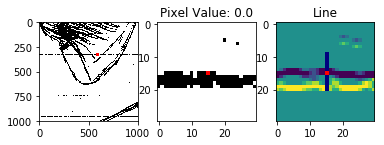

576
-0.6666666666666666
0.6666666666666666
0.0


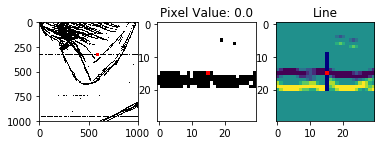

577
-0.5
0.5
0.0


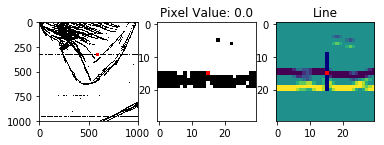

578


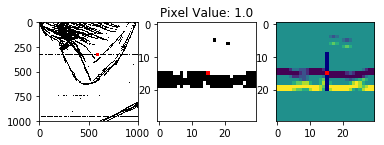

579


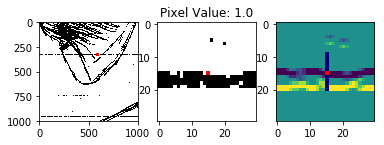

580


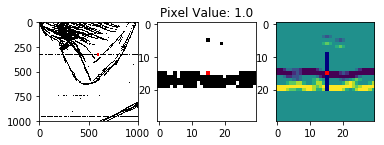

581


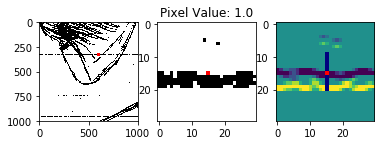

582


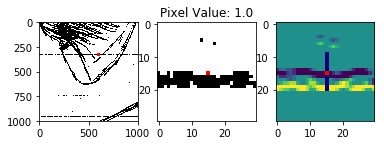

583


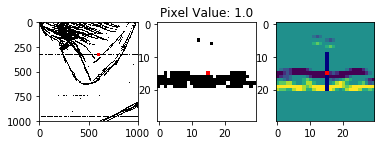

584


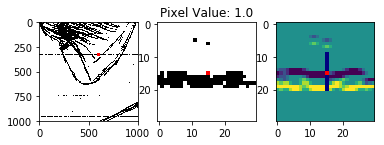

585


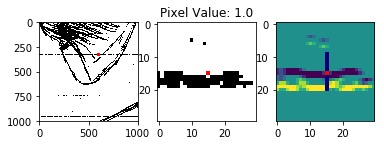

586


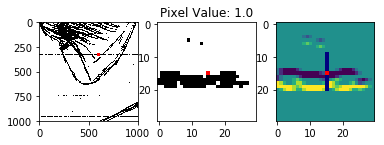

587


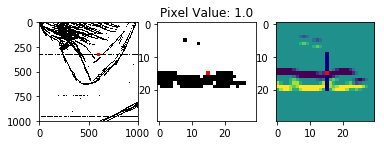

588


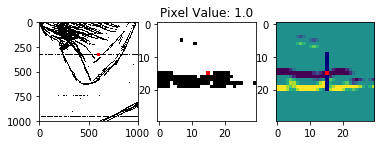

589


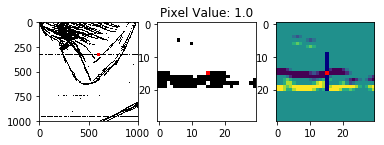

590
-0.5
0.5
0.0


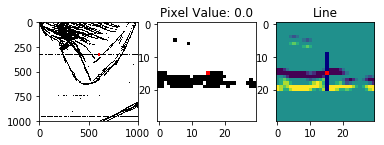

591
-0.6666666666666666
0.6666666666666666
0.0


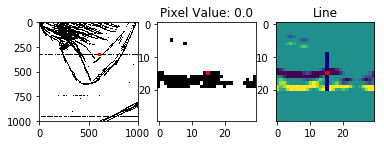

592
-0.6666666666666666
0.6666666666666666
0.0


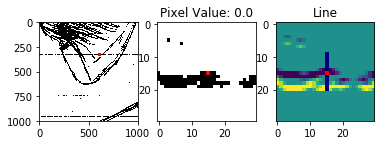

593
-0.6666666666666666
0.6666666666666666
0.0


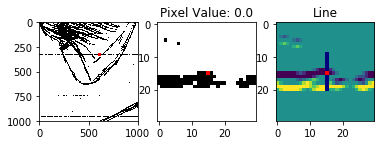

594
-0.5
0.5
0.0


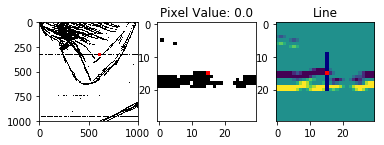

595


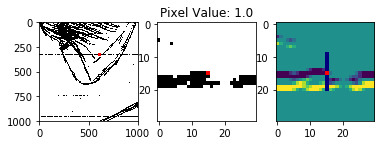

596


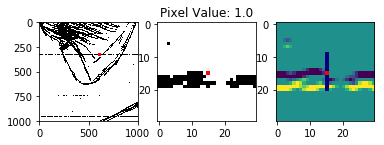

597


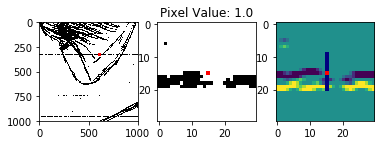

598


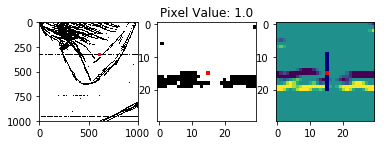

599


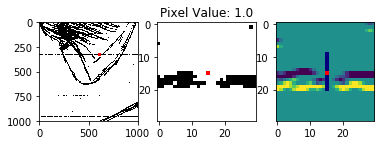

600


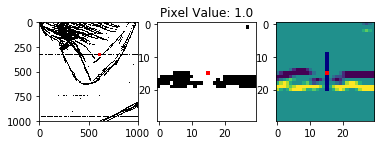

601


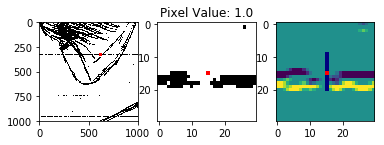

602


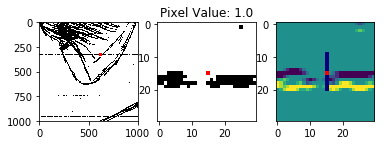

603


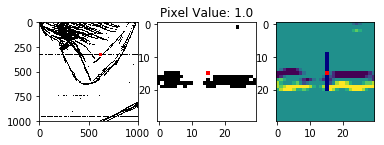

604


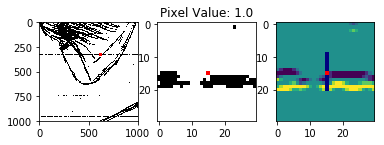

605


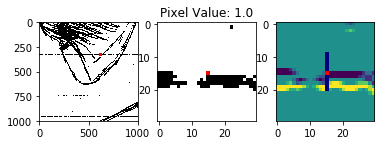

606


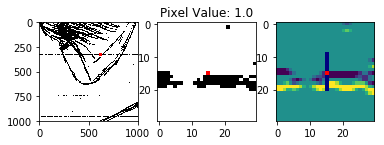

607


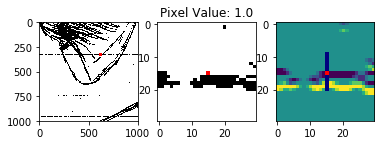

608


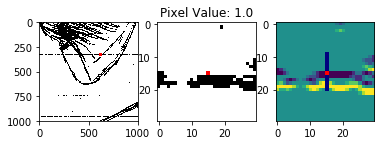

609


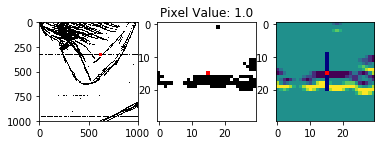

610


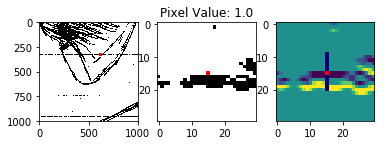

611


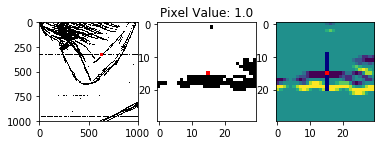

612


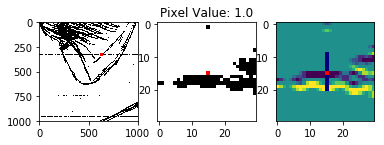

613


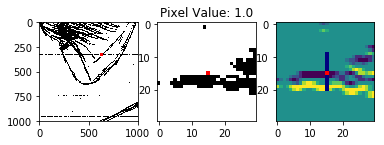

614


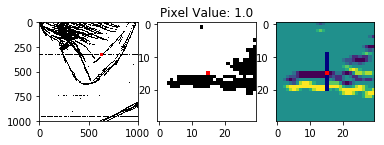

615


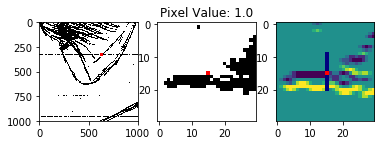

616


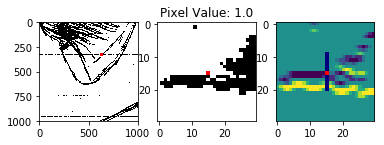

617


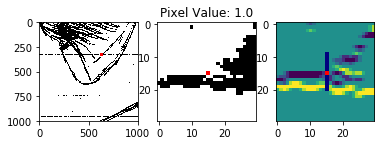

618


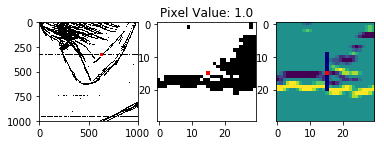

619


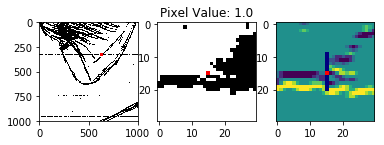

620


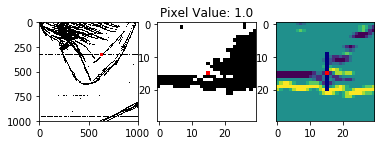

621


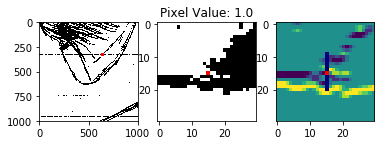

622


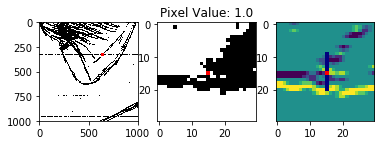

623


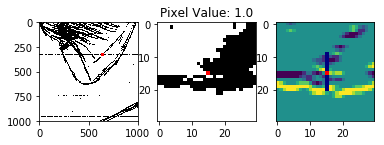

624
-1.1666666666666667
1.1666666666666667
0.0


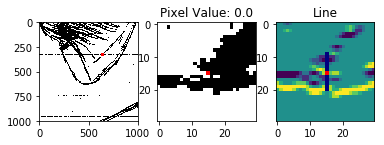

625
-1.1666666666666667
1.0
-0.16666666666666674


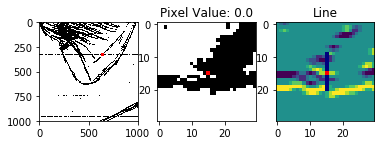

626
-0.6666666666666666
0.3333333333333333
-0.3333333333333333


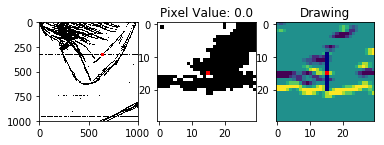

627
-0.16666666666666666
0.16666666666666666
0.0


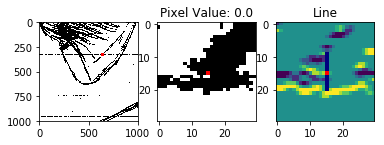

628
0.0
0.5
0.5


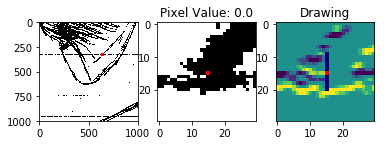

629
0.0
0.6666666666666666
0.6666666666666666


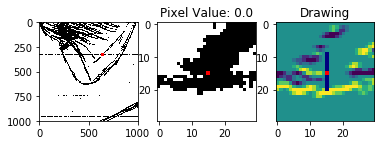

630
0.0
0.6666666666666666
0.6666666666666666


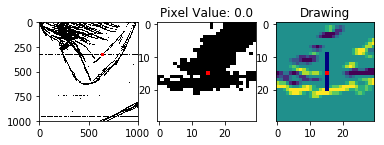

631
0.0
0.8333333333333334
0.8333333333333334


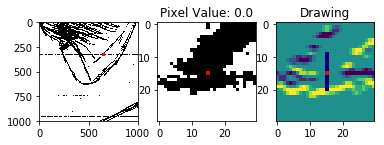

632
0.0
1.0
1.0


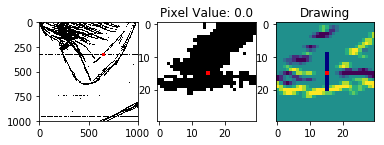

633
0.0
1.0
1.0


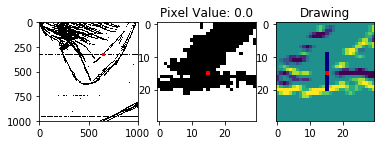

634
0.0
1.1666666666666667
1.1666666666666667


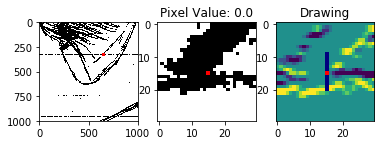

635
0.16666666666666666
1.1666666666666667
1.3333333333333335


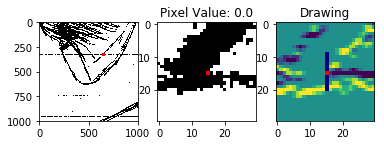

636
0.6666666666666666
0.6666666666666666
1.3333333333333333


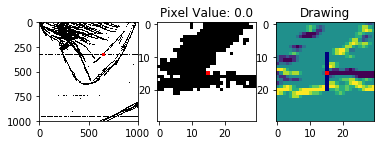

637


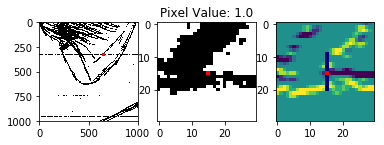

638
0.6666666666666666
0.5
1.1666666666666665


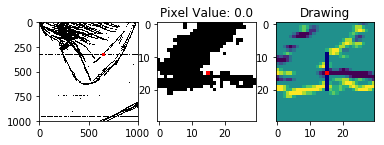

639
0.3333333333333333
0.3333333333333333
0.6666666666666666


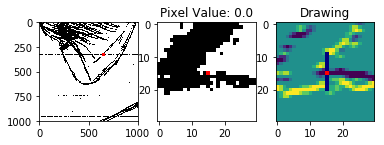

640


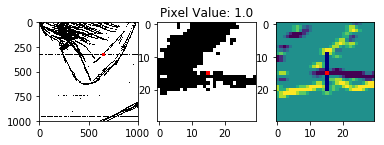

641


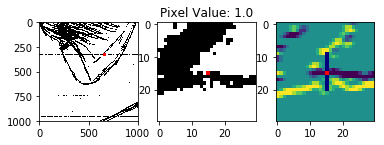

642
-0.16666666666666666
0.5
0.33333333333333337


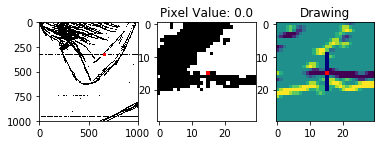

643
-0.3333333333333333
0.6666666666666666
0.3333333333333333


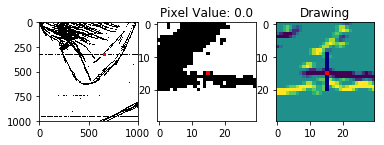

644
-0.3333333333333333
0.5
0.16666666666666669


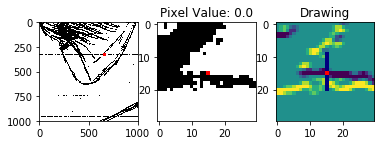

645


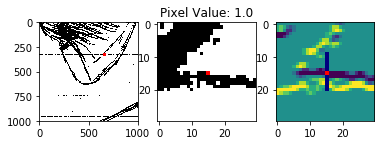

646


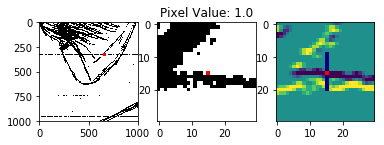

647


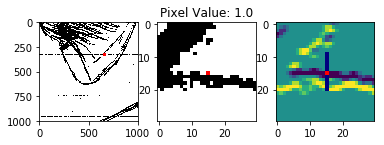

648


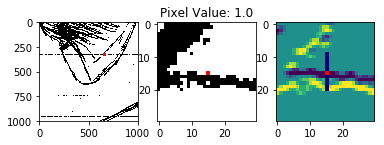

649


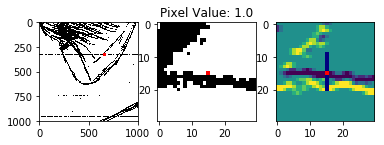

650


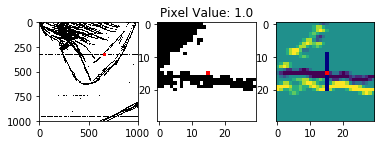

651


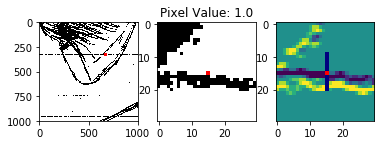

652


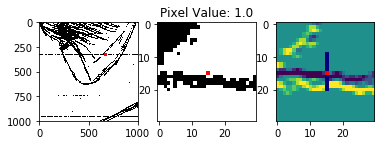

653


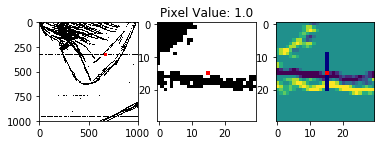

654


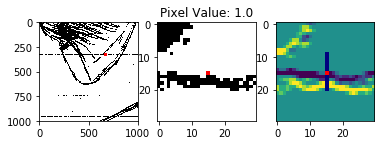

655


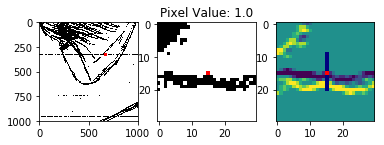

656


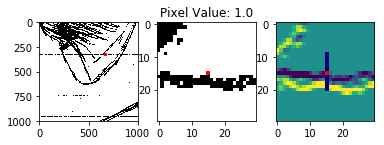

657


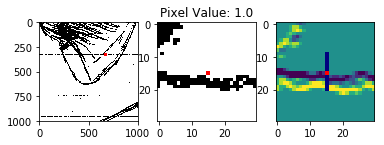

658


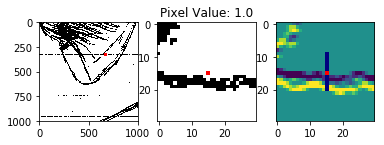

659


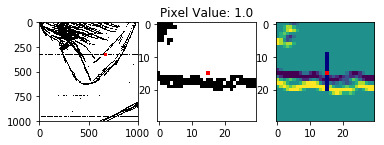

660


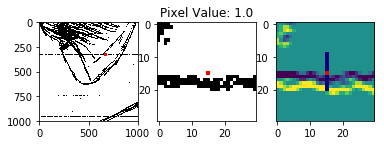

661


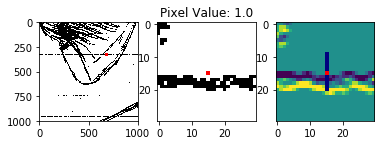

662


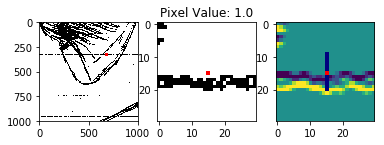

663


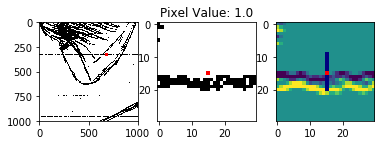

664


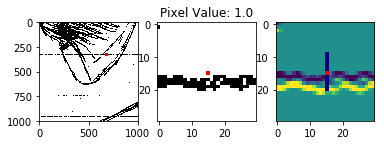

665


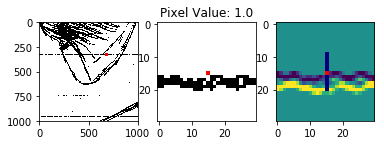

666


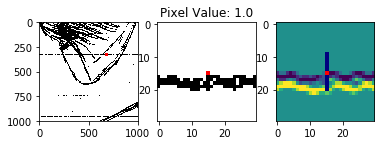

667


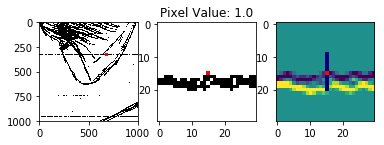

668


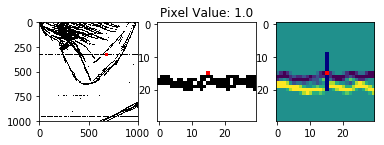

669


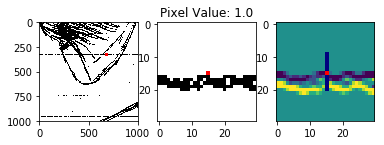

670


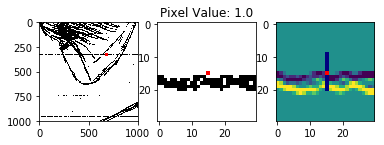

671


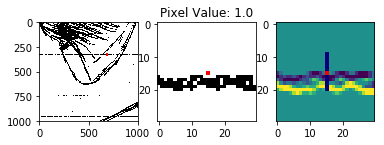

672


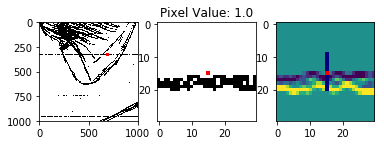

673


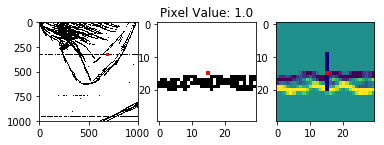

674


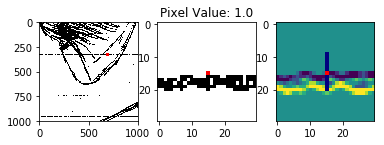

675


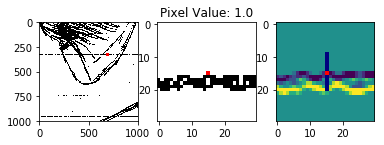

676


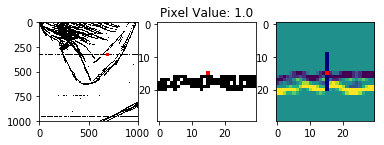

677


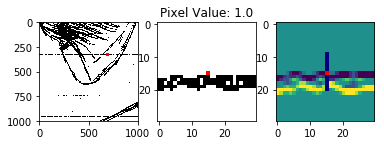

678


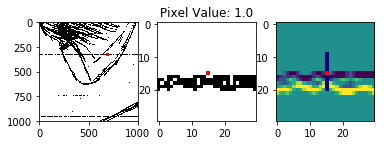

679


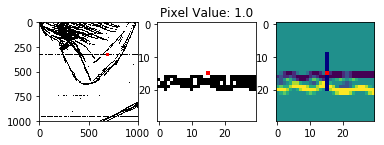

680


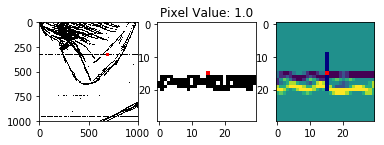

681


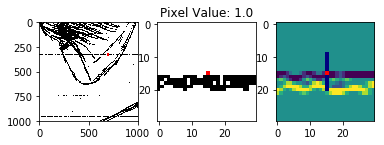

682


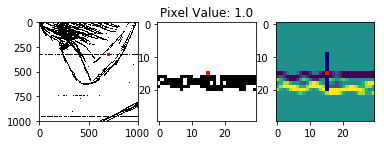

683


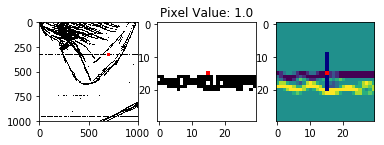

684


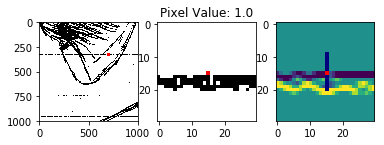

685


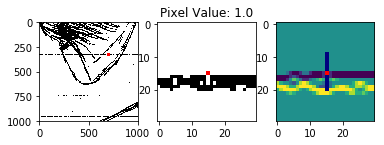

686


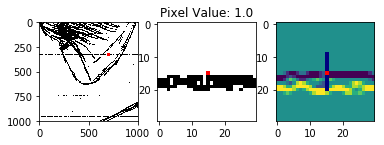

687


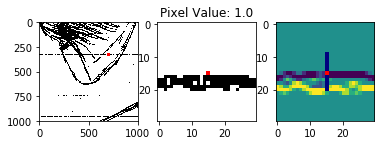

688


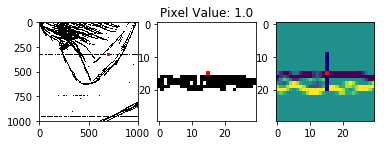

689


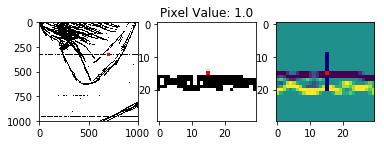

690


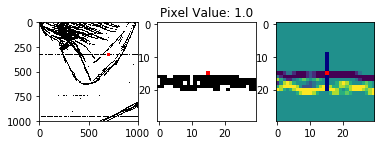

691


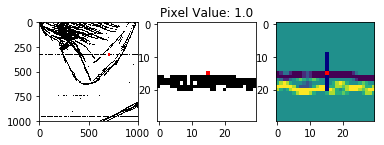

692


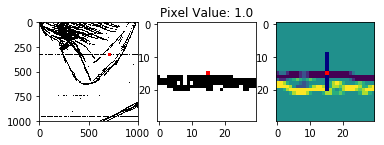

693


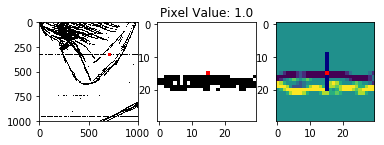

694


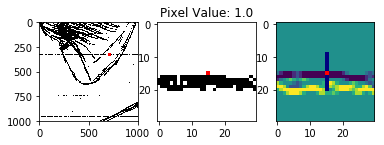

695


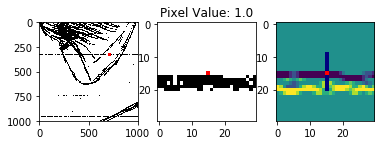

696


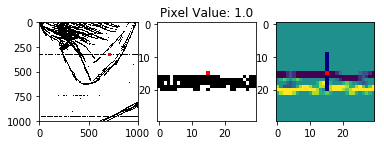

697


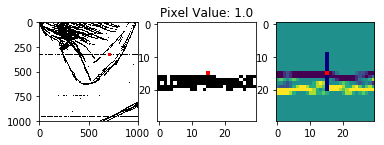

698


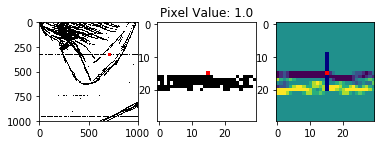

699


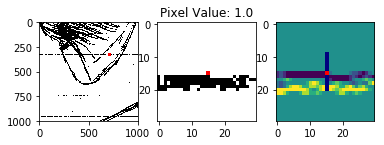

700


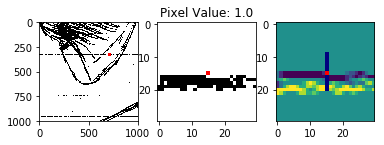

701


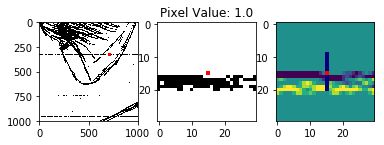

702


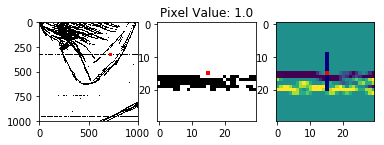

703


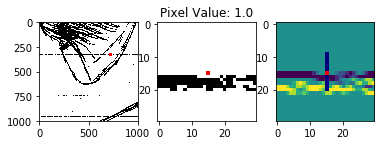

704


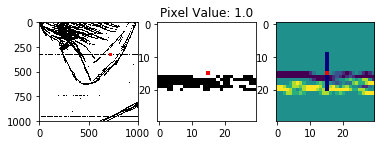

705


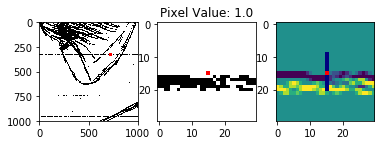

706


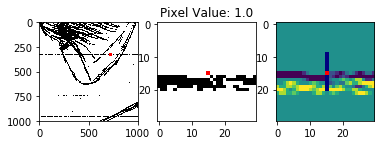

707


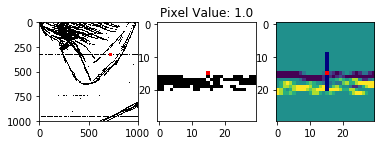

708


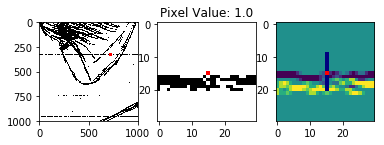

709


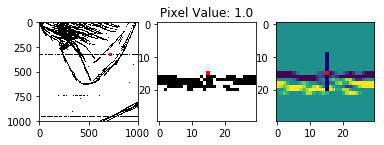

710


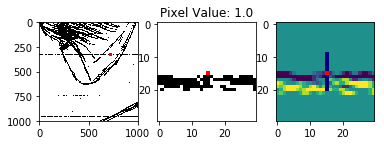

711


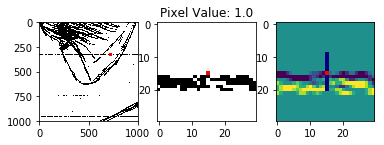

712


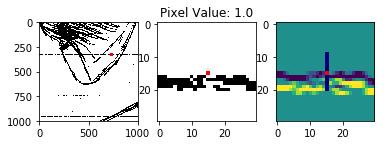

713


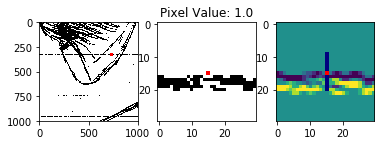

714


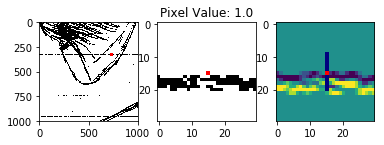

715


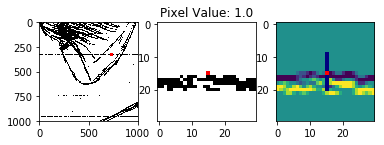

716


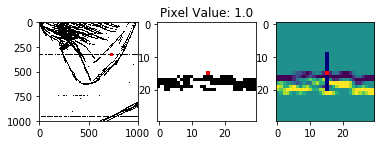

717


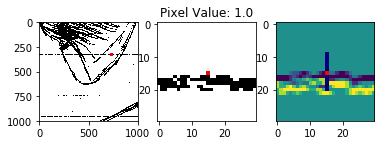

718


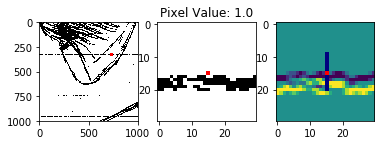

719


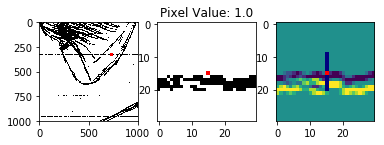

720


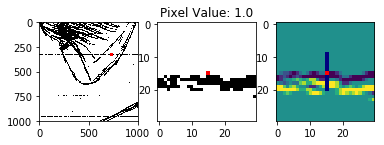

721


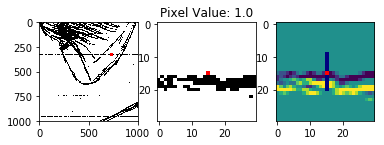

722


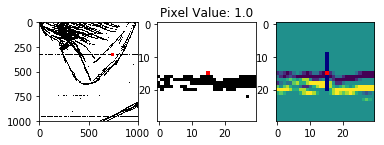

723


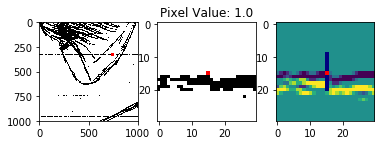

724


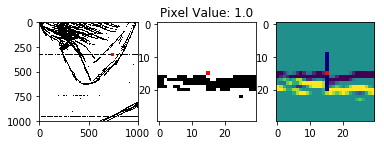

725


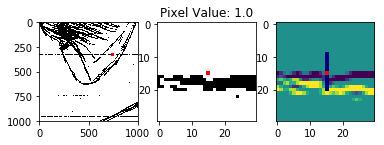

726


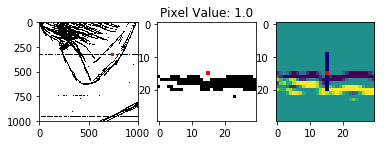

727


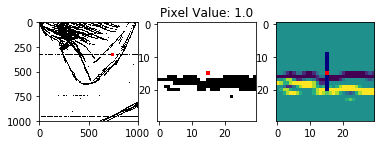

728


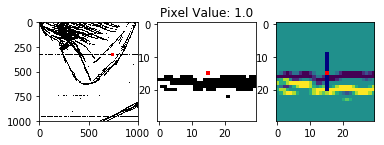

729


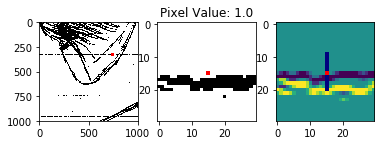

730


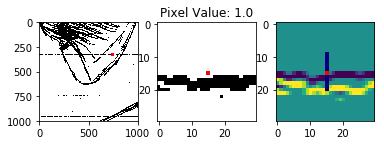

731


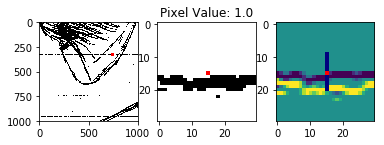

732


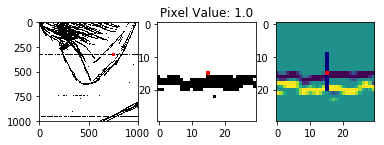

733


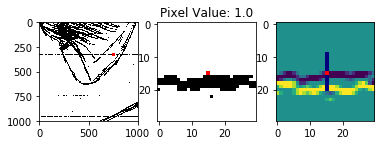

734


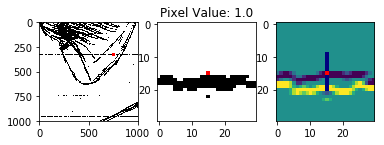

735


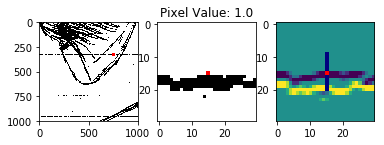

736


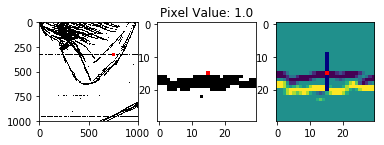

737


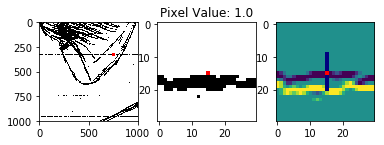

738


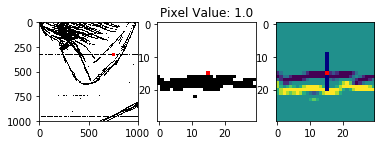

739


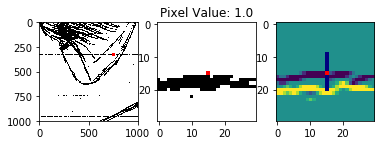

740


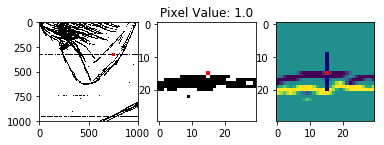

741


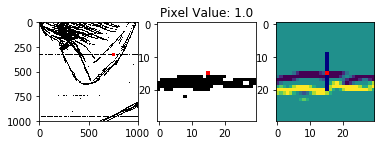

742


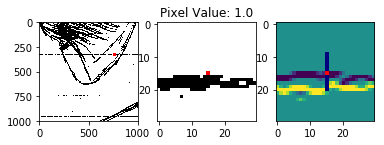

743


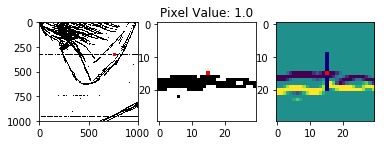

744


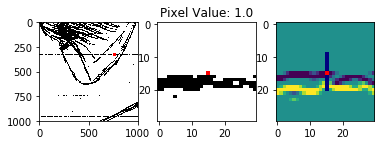

745


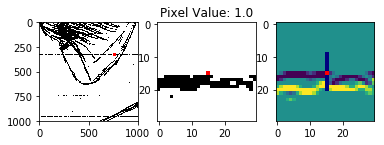

746


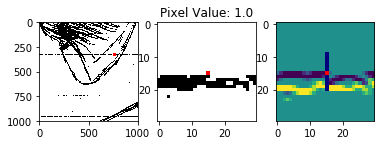

747


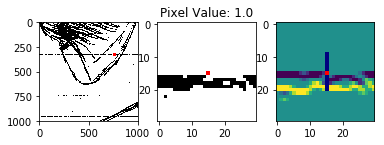

748


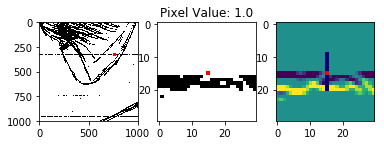

749


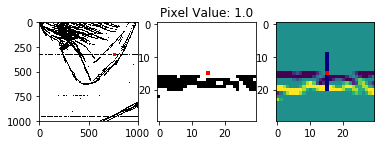

750


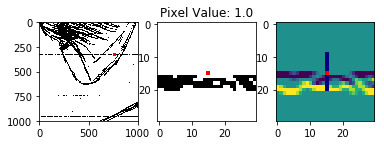

751


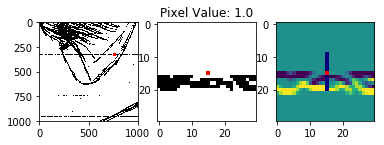

752


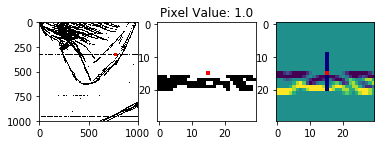

753


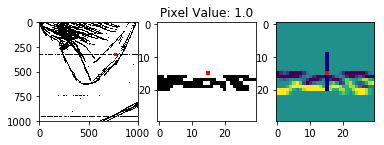

754


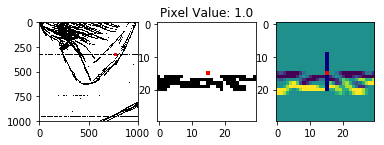

755


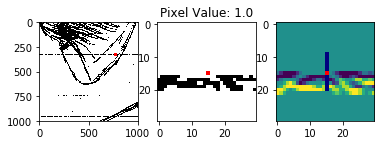

756


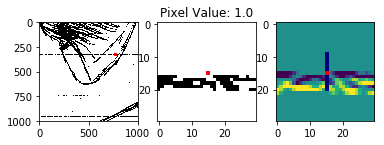

757


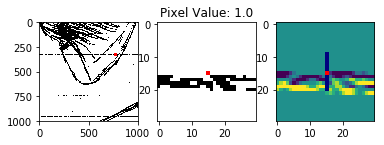

758


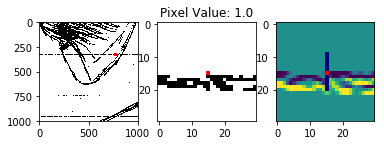

759


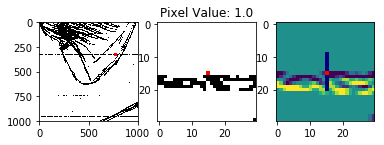

760


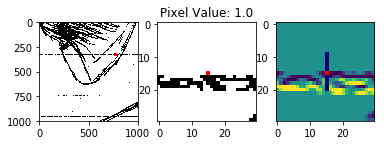

761


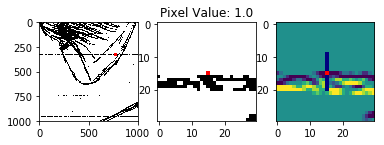

762


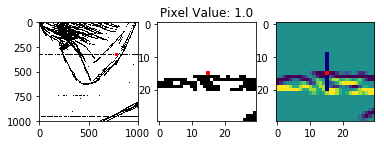

763


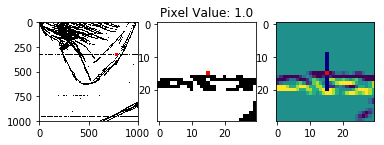

764


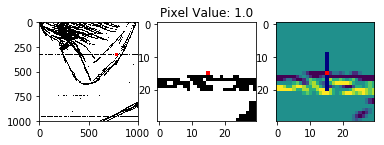

765


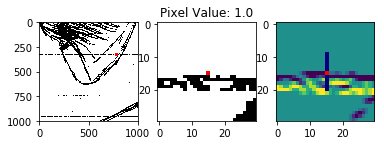

766


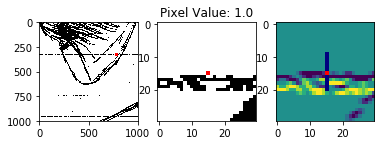

767


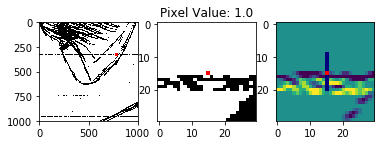

768


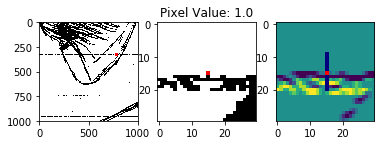

769


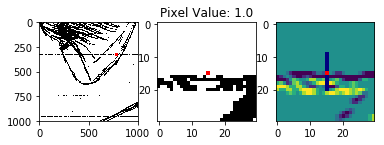

770


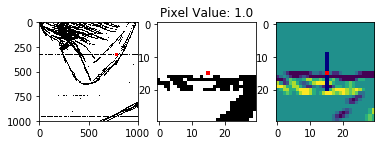

771


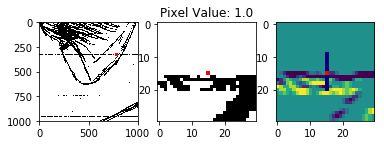

772


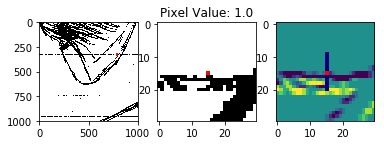

773


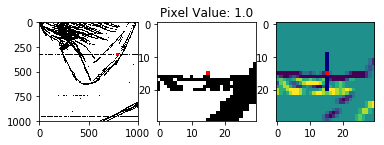

774


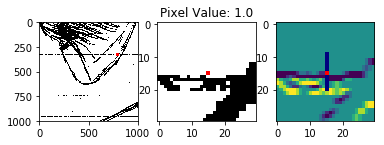

775


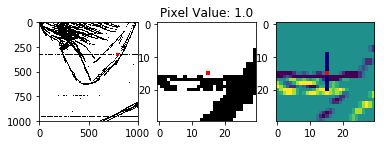

776


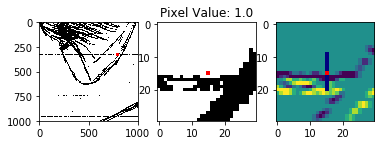

777


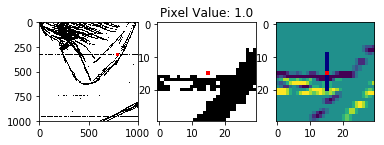

778


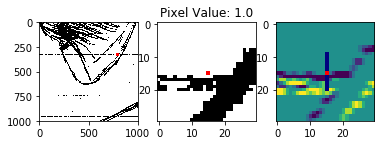

779


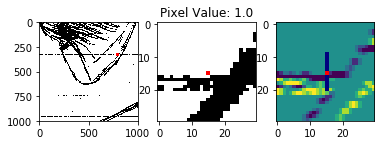

780


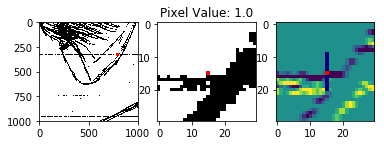

781


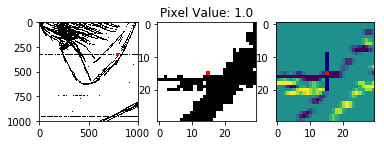

782


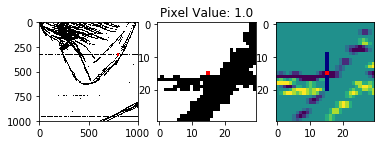

783


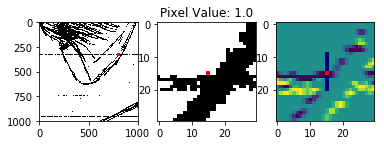

784


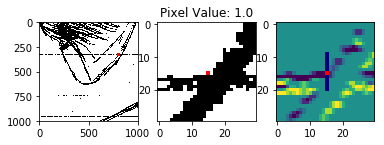

785


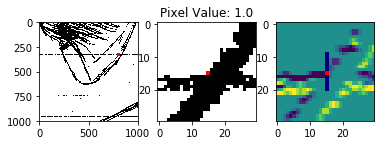

786
-1.0
-0.3333333333333333
-1.3333333333333333


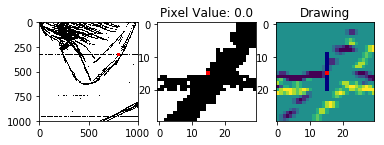

787
-1.3333333333333333
0.0
-1.3333333333333333


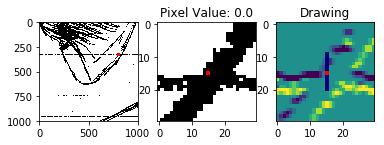

788
-1.0
0.0
-1.0


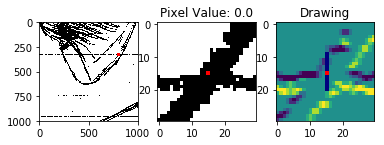

789
-0.5
0.16666666666666666
-0.33333333333333337


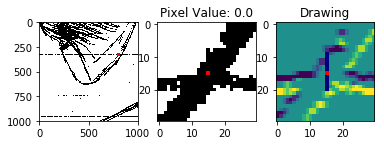

790
-0.3333333333333333
0.5
0.16666666666666669


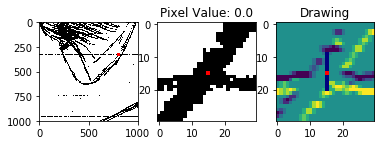

791
-0.16666666666666666
0.8333333333333334
0.6666666666666667


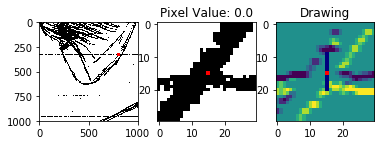

792
0.0
1.1666666666666667
1.1666666666666667


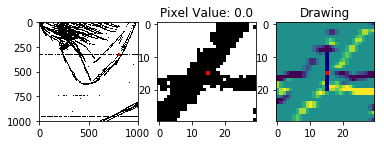

793
0.0
1.3333333333333333
1.3333333333333333


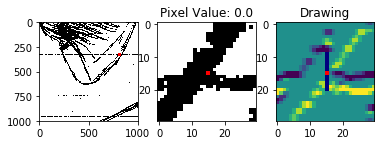

794
0.16666666666666666
1.1666666666666667
1.3333333333333335


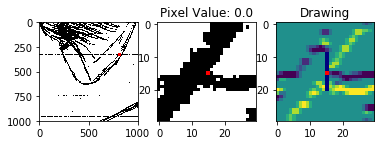

795
0.6666666666666666
0.5
1.1666666666666665


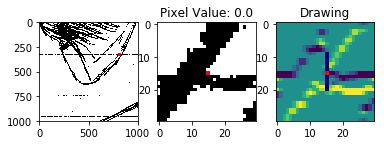

796


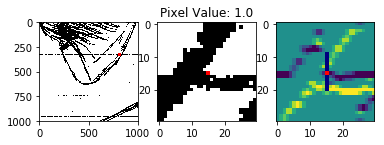

797


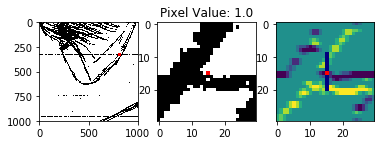

798


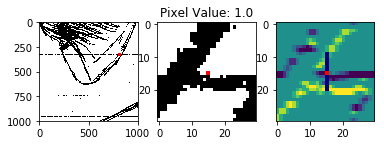

799


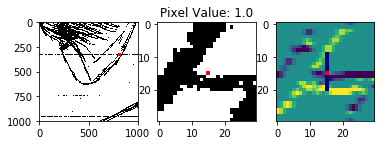

800


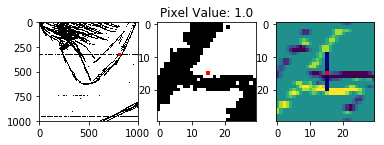

801


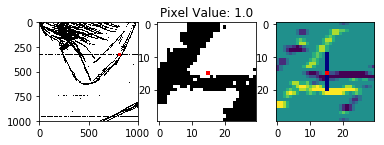

802


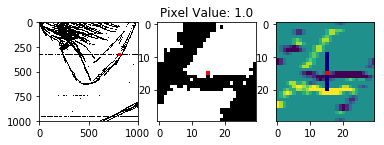

803


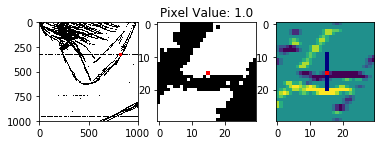

804


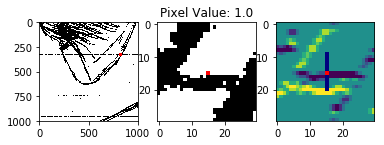

805


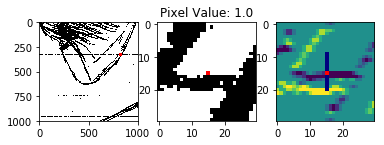

806


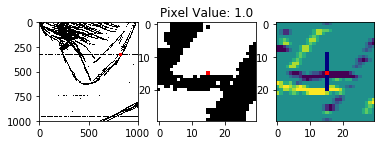

807


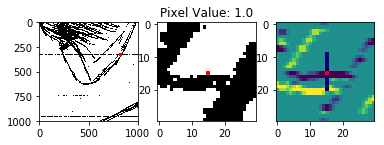

808


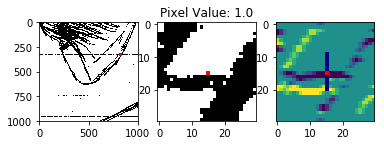

809


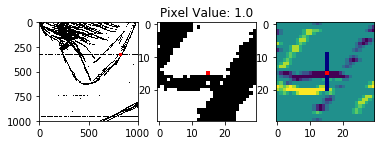

810


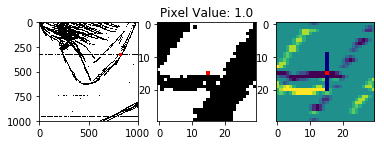

811


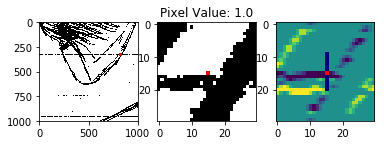

812


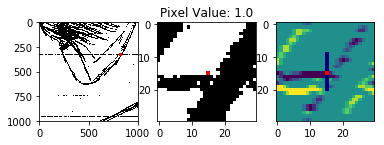

813


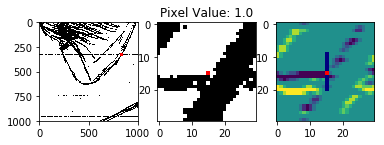

814


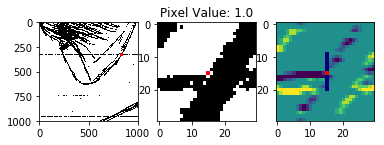

815


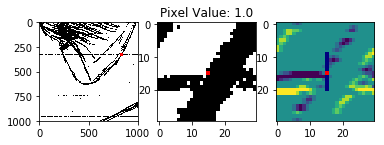

816
-1.1666666666666667
-0.16666666666666666
-1.3333333333333335


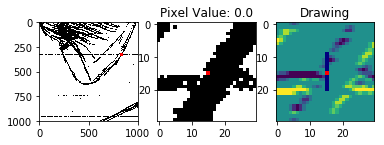

817
-1.1666666666666667
0.0
-1.1666666666666667


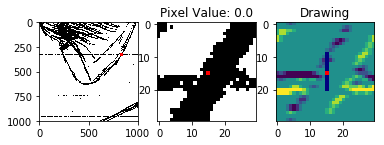

818
-0.6666666666666666
0.0
-0.6666666666666666


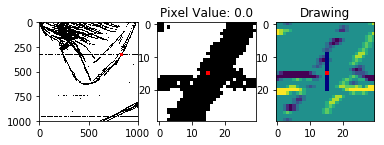

819
-0.16666666666666666
0.0
-0.16666666666666666


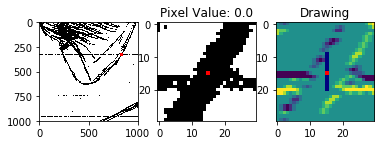

820
0.0
0.0
0.0


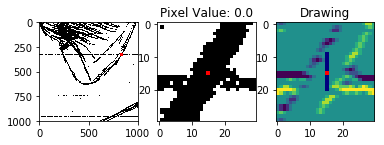

821
0.0
0.16666666666666666
0.16666666666666666


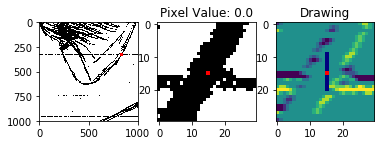

822
0.0
0.6666666666666666
0.6666666666666666


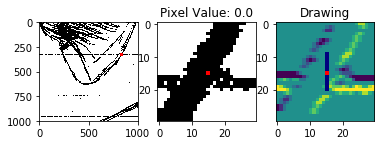

823
0.0
1.1666666666666667
1.1666666666666667


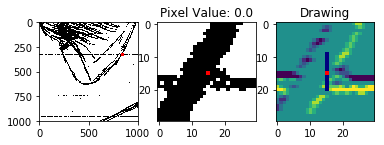

824
0.0
1.3333333333333333
1.3333333333333333


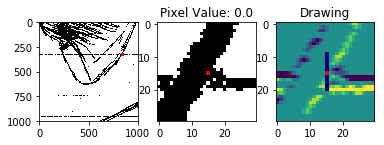

825
0.0
1.1666666666666667
1.1666666666666667


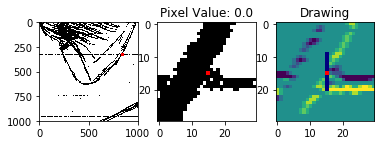

826
0.16666666666666666
0.8333333333333334
1.0


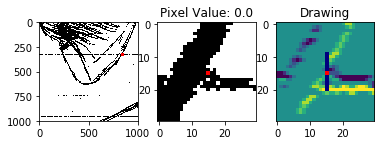

827
0.3333333333333333
0.8333333333333334
1.1666666666666667


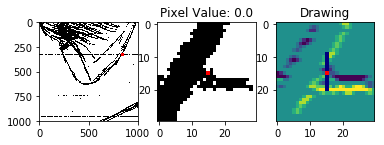

828
0.3333333333333333
0.6666666666666666
1.0


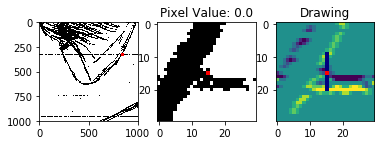

829


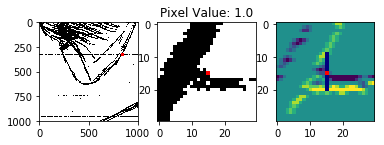

830


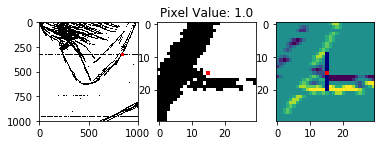

831


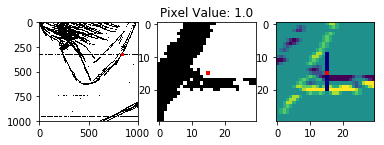

832


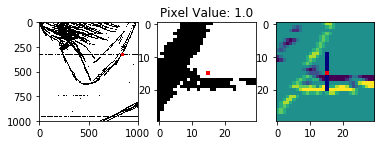

833


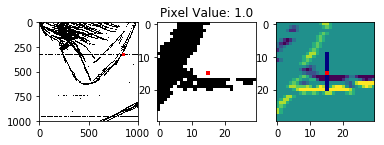

834


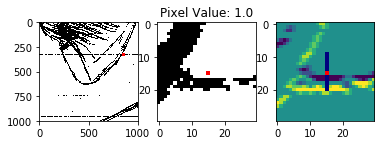

835


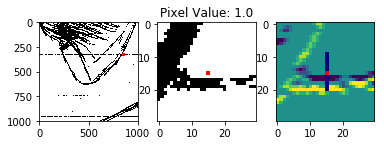

836


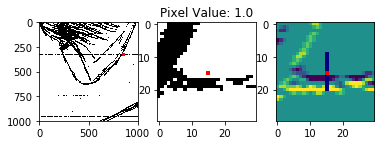

837


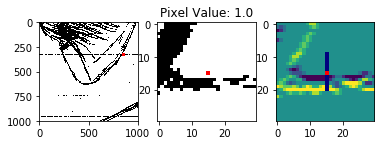

838


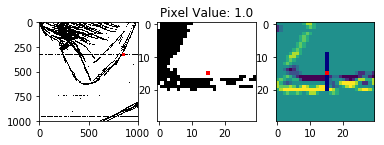

839


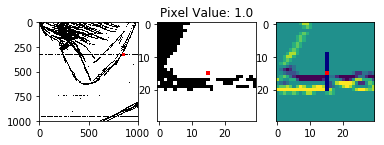

840


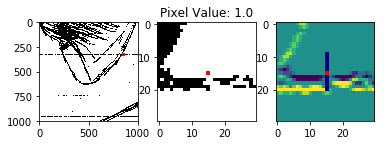

841


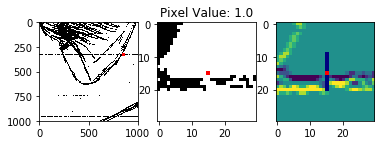

842


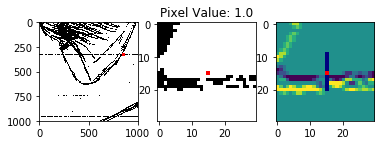

843


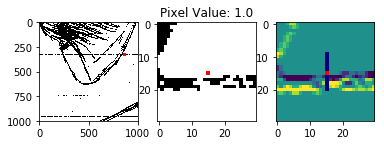

844


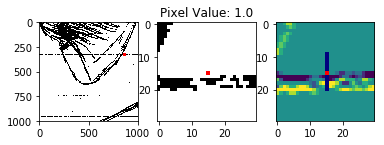

845


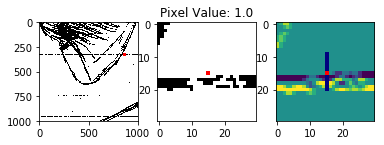

846


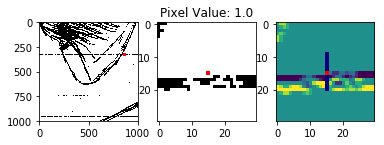

847


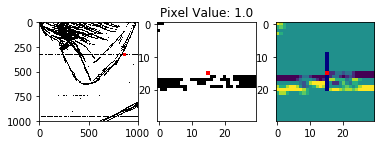

848


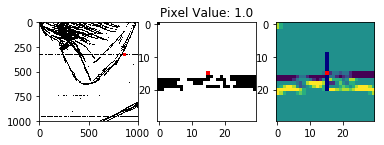

849


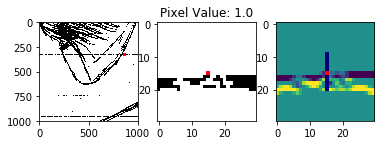

850


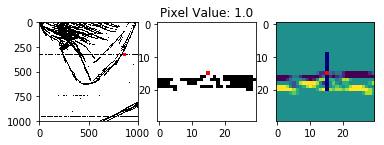

851


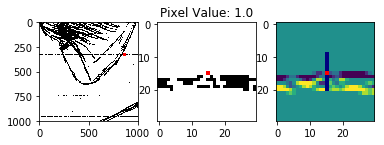

852


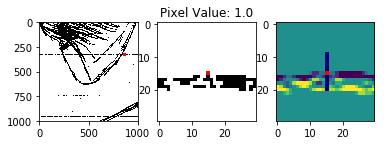

853


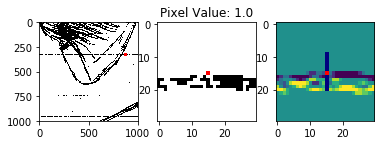

854


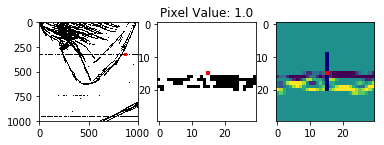

855


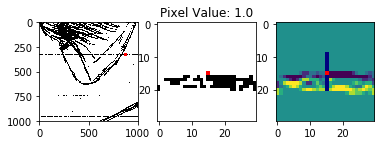

856


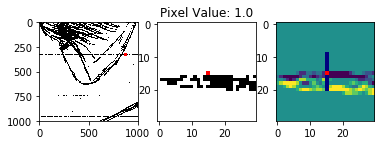

857


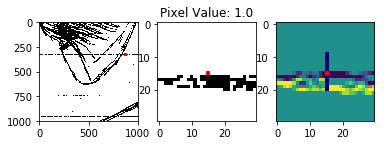

858


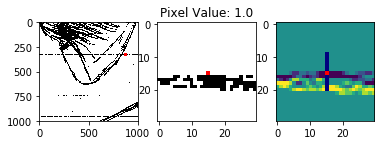

859


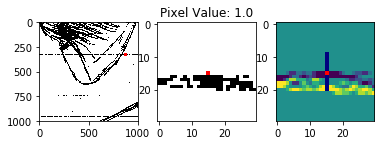

860


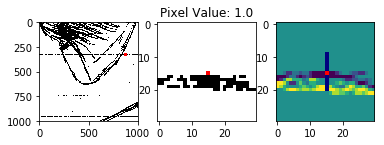

861


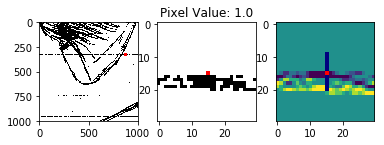

862


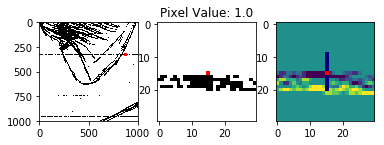

863


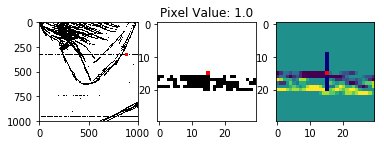

864


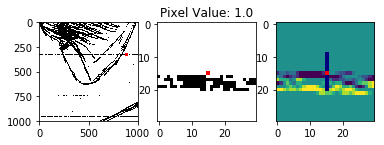

865


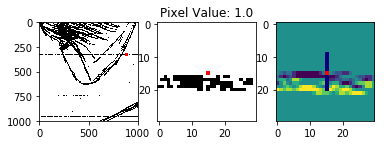

866


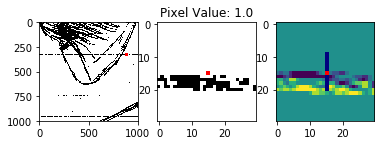

867


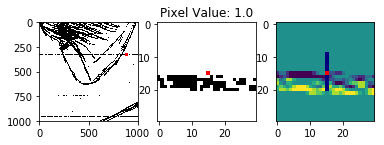

868


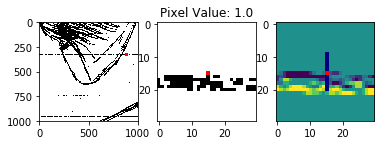

869


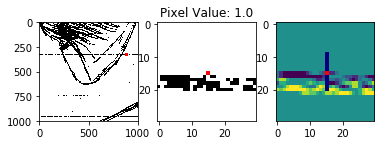

870


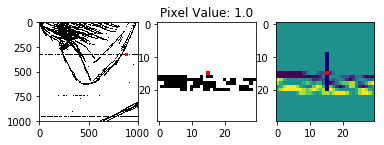

871


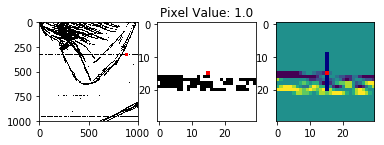

872


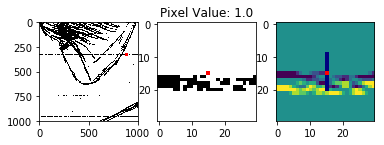

873


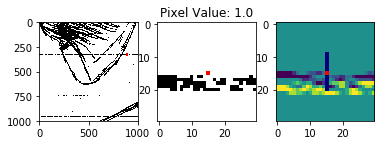

874


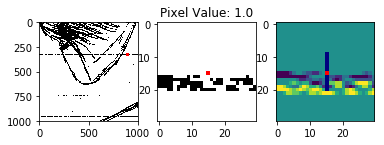

875


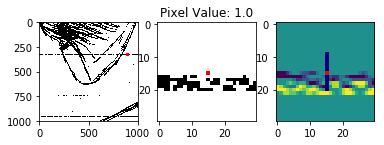

876


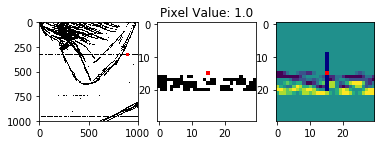

877


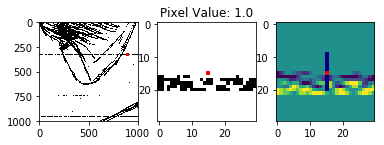

878


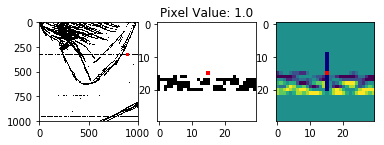

879


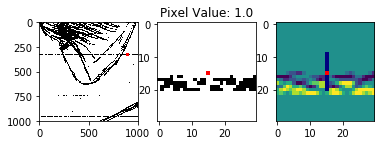

880


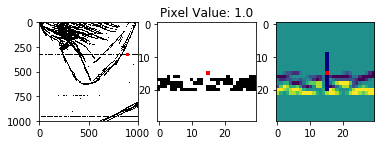

881


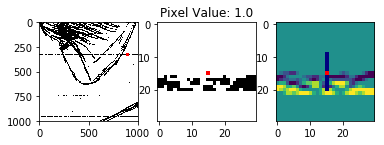

882


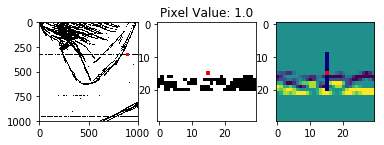

883


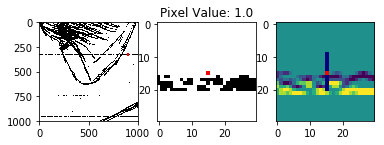

884


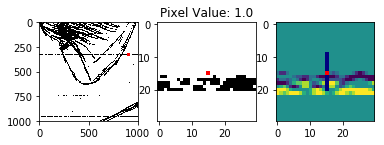

885


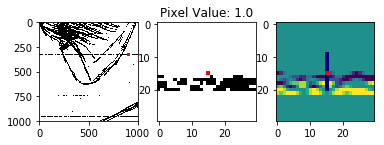

886


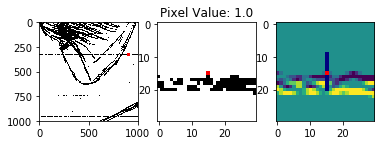

887


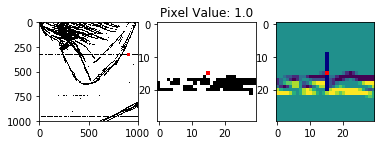

888


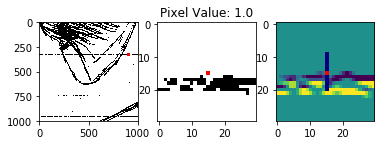

889


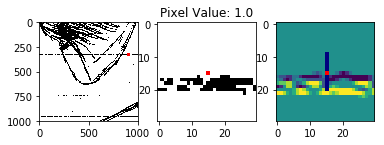

890


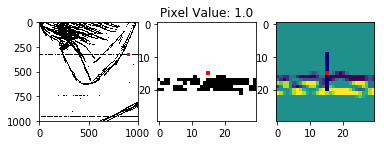

891


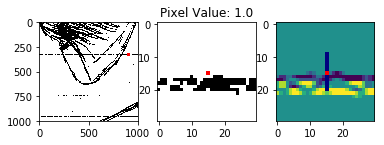

892


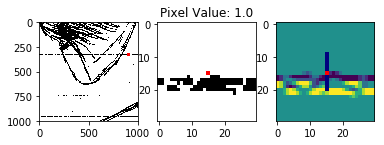

893


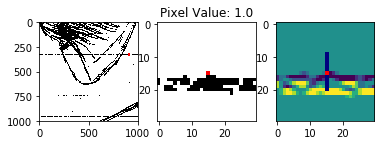

894


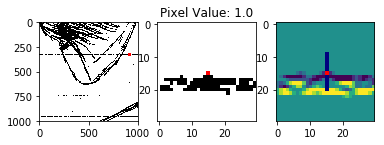

895


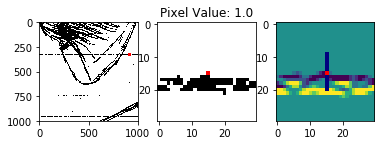

896


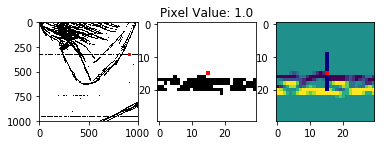

897


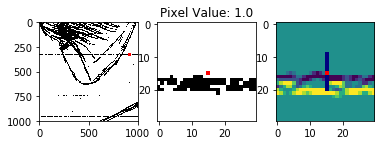

898


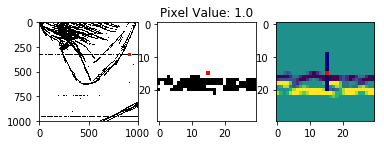

899


In [41]:
for i in range(900):
    size = 30
    row_index = 311
    col_index = i
    masked_window = np.random.random((zoom.shape[0],zoom.shape[1]))
    masked_window[row_index:row_index+size, col_index:col_index+size] = 1
    masked_window = np.ma.masked_where(masked_window != 1, masked_window)

    masked_pixel = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel[15,15] = 1
    masked_pixel = np.ma.masked_where(masked_pixel != 1, masked_pixel)

    masked_pixel1 = np.random.random((zoom[row_index:row_index+size, col_index:col_index+size].shape[0],zoom[row_index:row_index+size, col_index:col_index+size].shape[1]))
    masked_pixel1[9:21, 15] = 1
    masked_pixel1 = np.ma.masked_where(masked_pixel1 != 1, masked_pixel1)

    window = zoom[row_index:row_index+size, col_index:col_index+size]
    pixel_value = window[15, 15]
    window_sobel = ndimage.sobel(window, axis=0)
    above_area = np.mean(window_sobel[9:15, 15])
    below_area = np.mean(window_sobel[15:21, 15])
    sobel_value = window_sobel[15, 15]
    # Overlay the two images
    fig, ax = plt.subplots(1, 3)
    ax.ravel()
    ax[0].imshow(zoom, cmap='gray')
    ax[0].imshow(masked_window, cmap='prism', interpolation='none')
    # ax[0].imshow(masked_pixel, cmap=cm.jet, interpolation='none')
    ax[1].imshow(window, cmap='gray')
    ax[1].imshow(masked_pixel, cmap='prism', interpolation='none')
    ax[1].set_title('Pixel Value: {}'.format(pixel_value))
    ax[2].imshow(window_sobel)
    ax[2].imshow(masked_pixel1, cmap='jet')
    ax[2].imshow(masked_pixel, cmap='prism', interpolation='none')
    if pixel_value == 0.0:
        print(above_area)
        print(below_area)
        print(above_area - -below_area)
        if np.abs(above_area) >= 0.8 and np.abs(below_area) >= 0.8:
            if np.abs(above_area - -below_area) < 0.4:
                ax[2].set_title('Line')
        else:
            if np.abs(above_area) >= 0.1 and np.abs(below_area) >= 0.1: 
                if np.abs(above_area - -below_area) < 0.1:
                    ax[2].set_title('Line')
                else:
                    ax[2].set_title('Drawing')
            else:
                ax[2].set_title('Drawing')
    plt.show()
    
    fig.savefig(f'savefig2/{i:04}')
    print(i)

In [116]:
masked_data = np.random.random((result.shape[0],result.shape[1]))
masked_data[100:130,100:130] = 1
masked_data = np.ma.masked_where(masked_data != 1, masked_data)


In [117]:
masked_data

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        ...,
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --],
        [--, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],
  fill_value=1e+20)

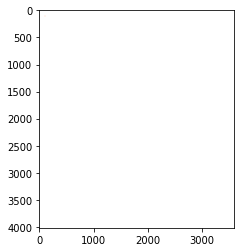

In [118]:
fig, ax = plt.subplots()
ax.imshow(masked_data, cmap='Reds')

In [13]:
binarized.shape

(4017, 3590)

In [20]:
result = np.ones((5000,5000))

In [21]:
result[:binarized.shape[0], :binarized.shape[1]] = binarized

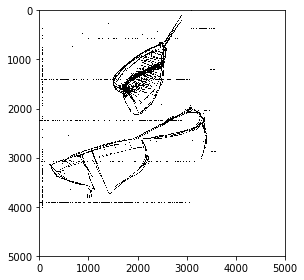

In [22]:
io.imshow(result)

In [19]:
def greyscale_images(images,  n):
    greyscale_images = []
    for i in range(n):
        try:
            image = imread(images[i], mode = 'L')
            
            greyscale_images.append(image)
        except:
            continue
    return np.array(greyscale_images)

def pad(image_list, pad_row, pad_col):
    padded_images = []
    for image in image_list:
        result = np.ones(pad_row, pad_col)
        result[:image.shape[0], :image.shape[1]] = image
        padded_images.append(result)
    return padded_images
    
    
def standardize(image_list):
    standardized_image_list = []
    for image in image_list:
        standardized_image = (image - np.min(image))/(np.max(image) - np.min(image))
        standardized_image_list.append(standardized_image)
    return np.array(standardized_image_list)

def binarize_images(images, threshold):
    binarized_images = []
    for image in images:
        binarized = 1.0 * (image > threshold)
        binarized_images.append(binarized)
    return np.array(binarized_images)

In [12]:
raw_ruled = greyscale_images(ruled, 30)

/Users/reiffd/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """


In [13]:
raw_ruled[0]

array([[199, 199, 203, ..., 200, 200, 198],
       [204, 200, 203, ..., 205, 206, 206],
       [220, 212, 209, ..., 207, 206, 205],
       ...,
       [211, 215, 218, ..., 210, 212, 215],
       [208, 212, 214, ..., 209, 212, 215],
       [210, 209, 208, ..., 201, 204, 203]], dtype=uint8)

In [14]:
standardized_rule = standardize(raw_ruled)

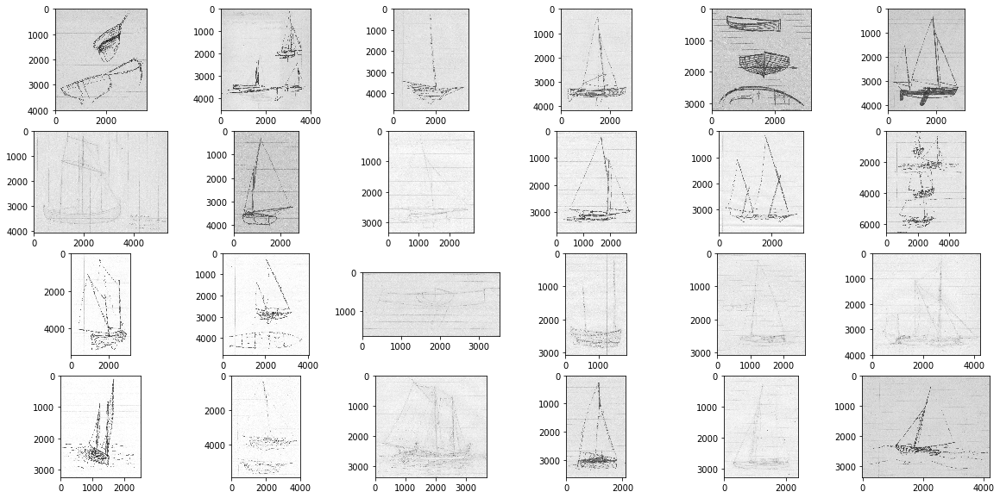

In [15]:
fig, ax = plt.subplots(4, 6, figsize = (20, 10))
for i, a in enumerate(ax.flatten()):
    a.imshow(standardized_rule[i], cmap='gray')


In [16]:
binarized_rule = binarize_images(standardized_rule, .72)

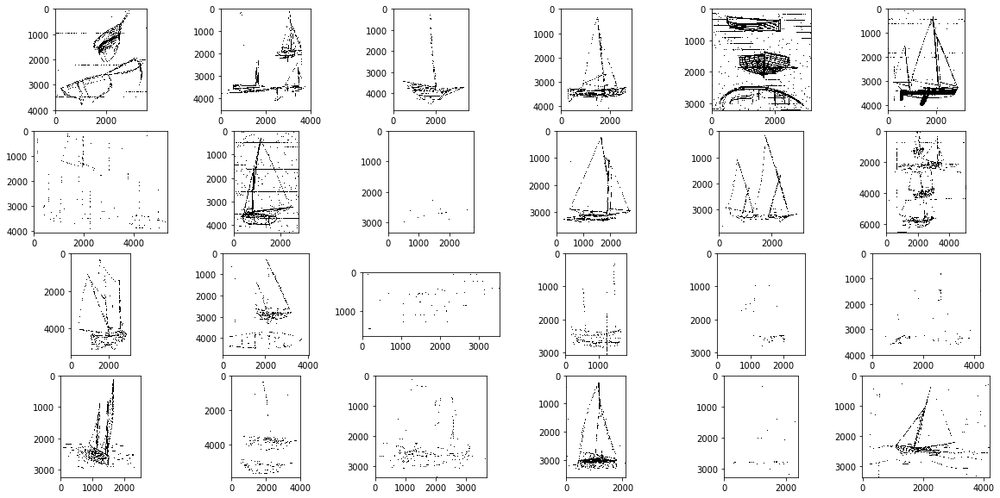

In [17]:
fig, ax = plt.subplots(4, 6, figsize = (20, 10))
for i, a in enumerate(ax.flatten()):
    a.imshow(binarized_rule[i], cmap='gray')
